# Heart Failure Prediction ❤️

In [ ]:
!pip install matplotlib scikit-learn numpy pandas xgboost scipy lightgbm plotly seaborn statsmodels mlxtend

In [296]:
# imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from typing import List, Dict, Union, Tuple

import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report , roc_auc_score, roc_curve, auc, silhouette_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from xgboost import XGBClassifier

from scipy.stats import boxcox
from scipy.stats import probplot
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram

# surpress warnings
import warnings
warnings.filterwarnings('ignore')

# set random seed
np.random.seed(42)

In [297]:
pd.set_option('display.max_columns', None)

## 1. Loading the Dataset

In [298]:
# Load the data
df = pd.read_csv('./heart.csv')
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


## 2. Exploratory Data Analysis (EDA)

In [299]:
# Viewing the shape of the dataframe
df.shape

(918, 12)

The dataset contains `918` data points with `12` columns

In [300]:
# Check information about the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


##### Attribute (Column) Information

1. `Age`: age of the patient [years]
2. `Sex`: sex of the patient [M: Male, F: Female]
3. `ChestPainType`: chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic]
4. `RestingBP`: resting blood pressure [mm Hg]
5. `Cholesterol`: serum cholesterol [mm/dl]
6. `FastingBS`: fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]
7. `RestingECG`: resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria]
8. `MaxHR`: maximum heart rate achieved [Numeric value between 60 and 202]
9. `ExerciseAngina`: exercise-induced angina [Y: Yes, N: No]
10. `Oldpeak`: oldpeak = ST [Numeric value measured in depression]
11. `ST_Slope`: the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]
12. `HeartDisease`: output class [1: heart disease, 0: Normal]



In [301]:
# Tidy up the column names (lowercased and underscores instead of spaces)
df.columns = df.columns.str.lower().str.replace(' ', '_')
df.columns

Index(['age', 'sex', 'chestpaintype', 'restingbp', 'cholesterol', 'fastingbs',
       'restingecg', 'maxhr', 'exerciseangina', 'oldpeak', 'st_slope',
       'heartdisease'],
      dtype='object')

In [302]:
# Checking for missing values
df.isnull().sum()

age               0
sex               0
chestpaintype     0
restingbp         0
cholesterol       0
fastingbs         0
restingecg        0
maxhr             0
exerciseangina    0
oldpeak           0
st_slope          0
heartdisease      0
dtype: int64

No missing values in any column in the dataset

In [303]:
# Checking the duplicate values
df.duplicated().sum()

np.int64(0)

No duplicates in the dataset

In [304]:
# View the summary statistics for numerical columns
df.describe()

,age,restingbp,cholesterol,fastingbs,maxhr,oldpeak,heartdisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [305]:
# View the summary statistics for categorical columns
df.describe(include='object')

,sex,chestpaintype,restingecg,exerciseangina,st_slope
count,918,918,918,918,918
unique,2,4,3,2,3
top,M,ASY,Normal,N,Flat
freq,725,496,552,547,460


In [306]:
# Viewing the number of unique values in each column
df.nunique()

age                50
sex                 2
chestpaintype       4
restingbp          67
cholesterol       222
fastingbs           2
restingecg          3
maxhr             119
exerciseangina      2
oldpeak            53
st_slope            3
heartdisease        2
dtype: int64

Based on the unique values in each column, we can categorize the columns as follows:

##### Categorical Columns
- `sex`: 2 unique values
- `chestpaintype`: 4 unique values
- `fastingbs`: 2 unique values
- `restingecg`: 3 unique values
- `exerciseangina`: 2 unique values
- `st_slope`: 3 unique values
- `heartdisease`: 2 unique values

##### Numeric Columns
- `age`: 50 unique values
- `restingbp`: 50 unique values
- `cholesterol`: 222 unique values
- `maxhr`: 119 unique values
- `oldpeak`: 53 unique values


### Analyzing each column

In [307]:
# Plot the QQ plot and the histogram for a specific numerical column
def plot_qq_hist_column(data: pd.DataFrame, col: str):
    if col not in data.select_dtypes(include='number').columns:
        raise ValueError(f"Column {col} is not a numerical column.")

    fig, ax = plt.subplots(1, 3, figsize=(36, 12))

    # Add big title
    fig.suptitle(f'{col}', fontsize=24)

    # Histogram
    data[col].plot(kind='hist', ax=ax[0])
    ax[0].set_title(f'Histogram for {col}')

    # QQ plot
    sm.qqplot(data[col], line='s', ax=ax[1])
    ax[1].set_title(f'QQ plot for {col}')

    # PDF plot with mean, median, and mode lines
    data[col].plot(kind='density', ax=ax[2], color='blue', alpha=0.5, label='PDF')
    mean = data[col].mean()
    median = data[col].median()
    mode = data[col].mode()[0]
    ax[2].axvline(x=mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax[2].axvline(x=median, color='green', linestyle='--', label=f'Median: {median:.2f}')
    ax[2].axvline(x=mode, color='purple', linestyle='--', label=f'Mode: {mode:.2f}')
    ax[2].set_title(f'PDF for {col}')
    ax[2].set_xlabel(col)
    ax[2].set_ylabel('Density')
    ax[2].legend()
    ax[2].grid()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Plot the count plot for a specific categorical column
def plot_count(data: pd.DataFrame, col: str):
    plt.figure(figsize=(12, 6))
    sns.countplot(data=data, x=col)
    plt.title(f'Count plot for {col}')
    plt.show()


# Plot the box plot for a specific numerical column and print the number of outliers using the IQR method
def print_outliers_plot_box_column(data: pd.DataFrame, col: str):
    if col not in data.select_dtypes(include='number').columns:
        raise ValueError(f"Column {col} is not a numerical column.")
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    print(f'Number of outliers in {col}: {outliers.shape[0]}')

    plt.figure(figsize=(12, 6))
    sns.boxplot(data=data, x=col)
    plt.title(f'Box plot for {col}')
    plt.show()

def disease_per_unique_col_value(df: pd.DataFrame, col: str):
    # View the percentage of heart disease in the dataset for unique values in a specific column
    df_grouped = df.groupby(col)['heartdisease'].value_counts(normalize=True).unstack()
    df_grouped.plot(kind='bar', stacked=True)
    print(df_grouped)

    plt.title(f"Percentage of Heart Disease per {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Percentage')
    plt.legend(title='Heart Disease', labels=['No', 'Yes'])
    plt.show()

#### 1. Age
age of the patient [years]

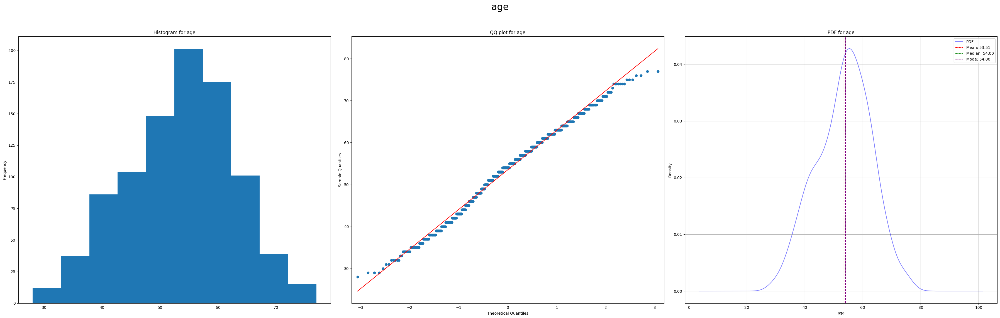

In [308]:
# Plot the distribution of the age column
plot_qq_hist_column(df, 'age')

In [309]:
# Get the skewness of the age column
df['age'].skew()

np.float64(-0.19593302867569365)

Number of outliers in age: 0


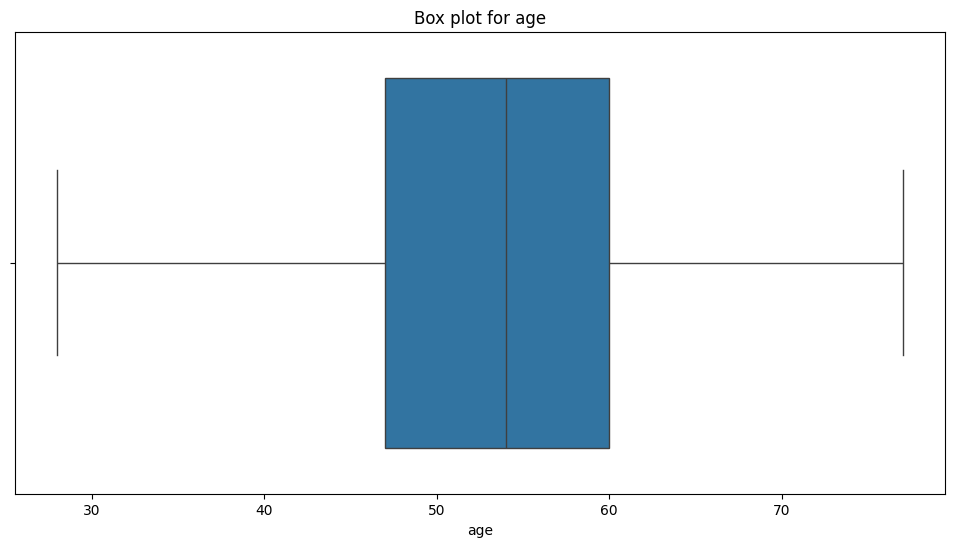

In [310]:
# Plot the box plot for the age column and print the number of outliers
print_outliers_plot_box_column(df, 'age')

Notes:
- The `age` column is looks like a normal distribution
- mean $\approx$ mode $\approx$ median
- It is slightly left skewed
- It has no outliers

#### 2.RestingBP
resting blood pressure [mm Hg]

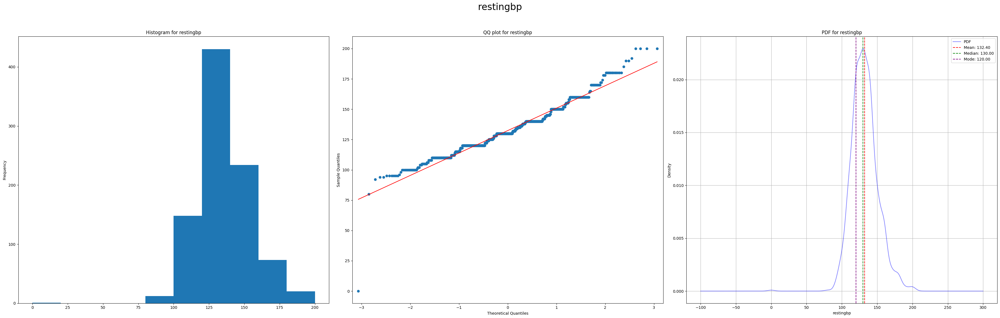

In [311]:
# Plot the distribution of the restingbp column
plot_qq_hist_column(df, 'restingbp')

In [312]:
# Get the skewness of the restingbp column
df['restingbp'].skew()

np.float64(0.1798393100516288)

Number of outliers in restingbp: 28


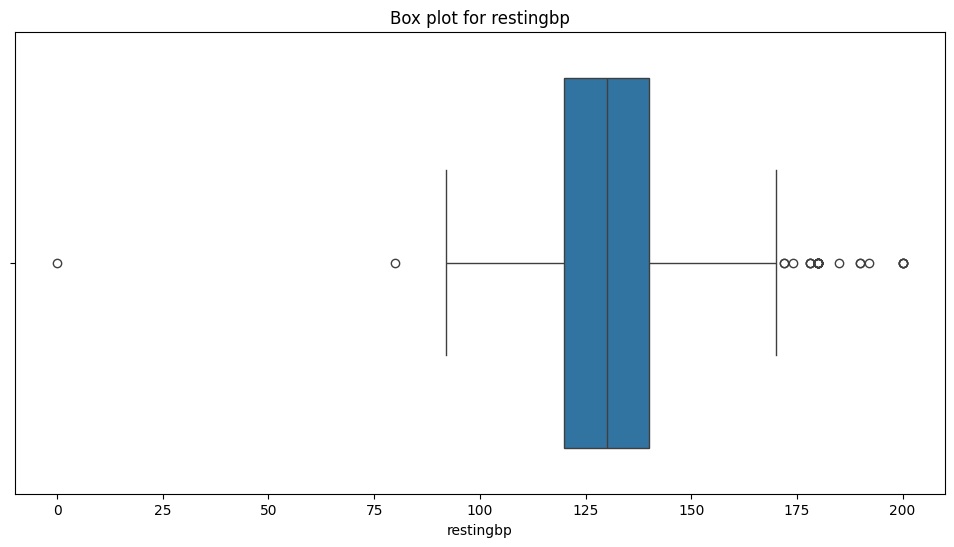

In [313]:
# Plot the box plot for the restingbp column and print the number of outliers
print_outliers_plot_box_column(df, 'restingbp')

Notes:
- Resting Blood Pressure of a person can never be 0, so these values could be a placeholder for an unknown/missing values which needs to be imputed
- It is slightly right skewed , very little skew
- It has some outliers
- It is approximately normal as seen from the QQ plot

#### 3.MaxHR
maximum heart rate achieved [Numeric value between 60 and 202]

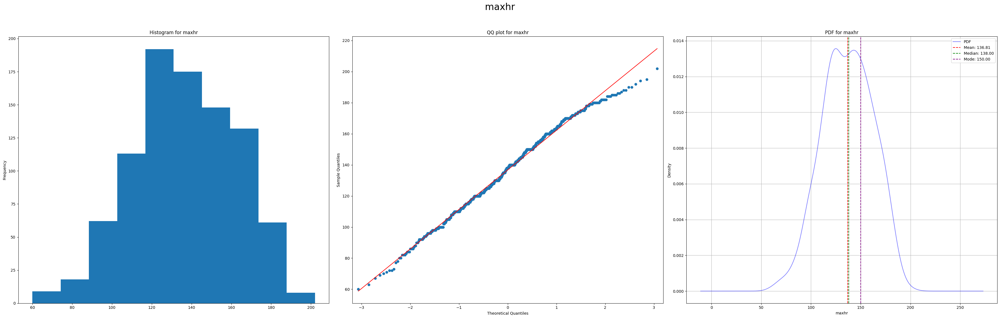

In [314]:
# Plot the distribution of the maxhr column
plot_qq_hist_column(df, 'maxhr')

In [315]:
# Get the skewness of the maxhr column
df['maxhr'].skew()

np.float64(-0.14435941846180994)

Number of outliers in maxhr: 2


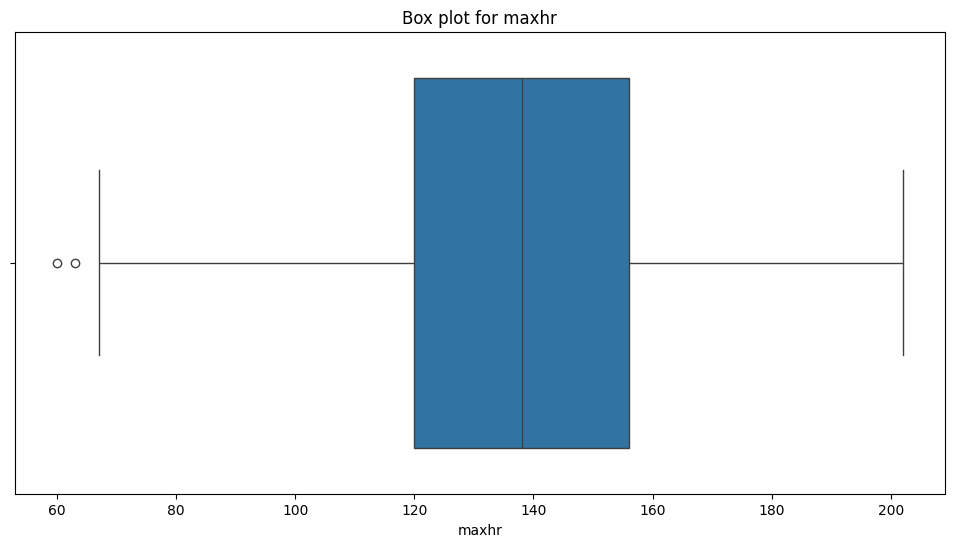

In [316]:
# Plot the box plot for the maxhr column and print the number of outliers
print_outliers_plot_box_column(df, 'maxhr')

Notes:
- The `maxhr` is almost normally distributed
- It has only 2 outliers
- It is slightly left skewed , very little skew

#### 4.Oldpeak
oldpeak = ST [Numeric value measured in depression]

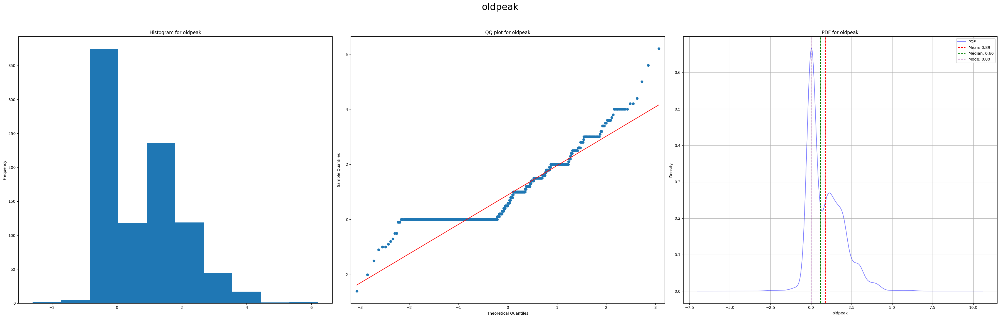

In [317]:
# Plot the distribution of the oldpeak column
plot_qq_hist_column(df, 'oldpeak')

In [318]:
# Get the skewness of the oldpeak column
df['oldpeak'].skew()

np.float64(1.0228720218107528)

Number of outliers in oldpeak: 16


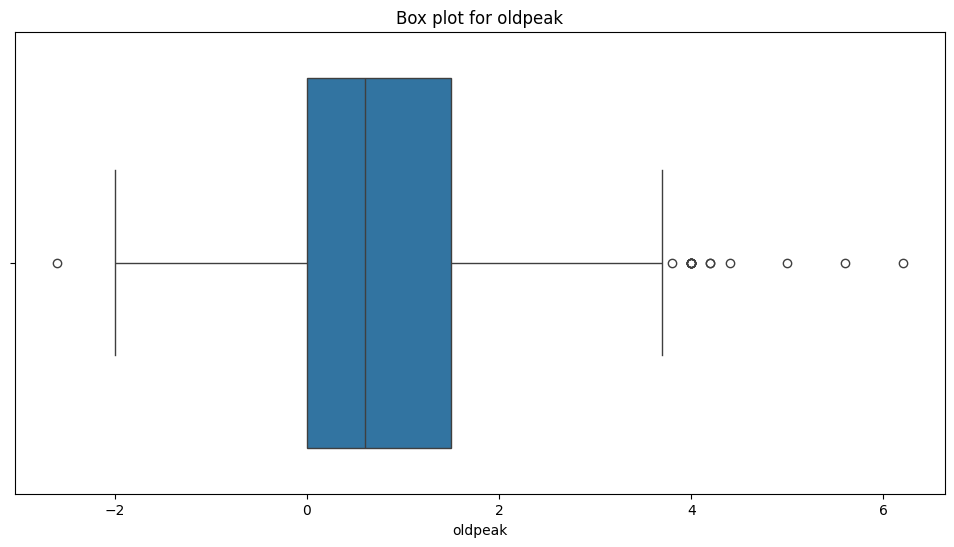

In [319]:
# Plot the box plot for the oldpeak column and print the number of outliers
print_outliers_plot_box_column(df, 'oldpeak')

Notes:
- The `oldpeak` column is illogical to have negative values,  Since it is a measure of how much lower the ST segment is compared to the baseline, negative values would be illogical—they would imply an "elevation" rather than a "depression," which is not what oldpeak is meant to capture.
- It is right skewed

In [320]:
# Viewing the unique values of the old peak column
neg_old_peak = df[df['oldpeak'] < 0]
print("Number of negative old peak values: ", neg_old_peak.shape[0])
print("Unique values negative old peak: ", neg_old_peak['oldpeak'].unique())

Number of negative old peak values:  13
Unique values negative old peak:  [-0.9 -2.6 -1.5 -0.1 -1.  -1.1 -0.7 -0.8 -0.5 -2. ]


#### 5.Cholesterol
serum cholesterol [mm/dl]

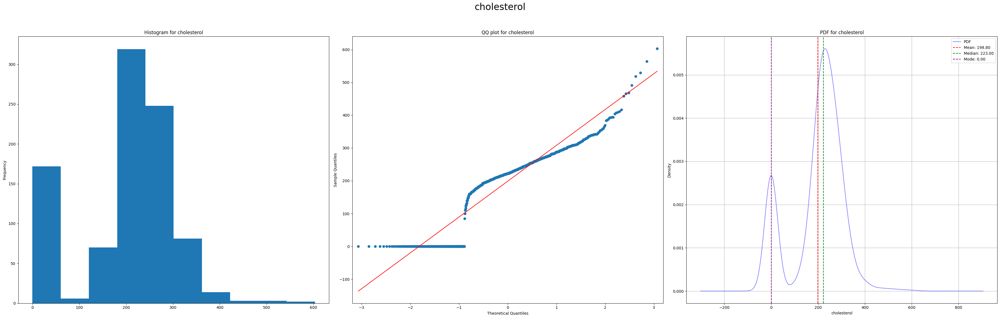

In [321]:
# Plot the count plot for the cholesterol column
plot_qq_hist_column(df, 'cholesterol')

In [322]:
# Get the skewness of the cholesterol column
df['cholesterol'].skew()

np.float64(-0.6100864307268192)

Number of outliers in cholesterol: 183


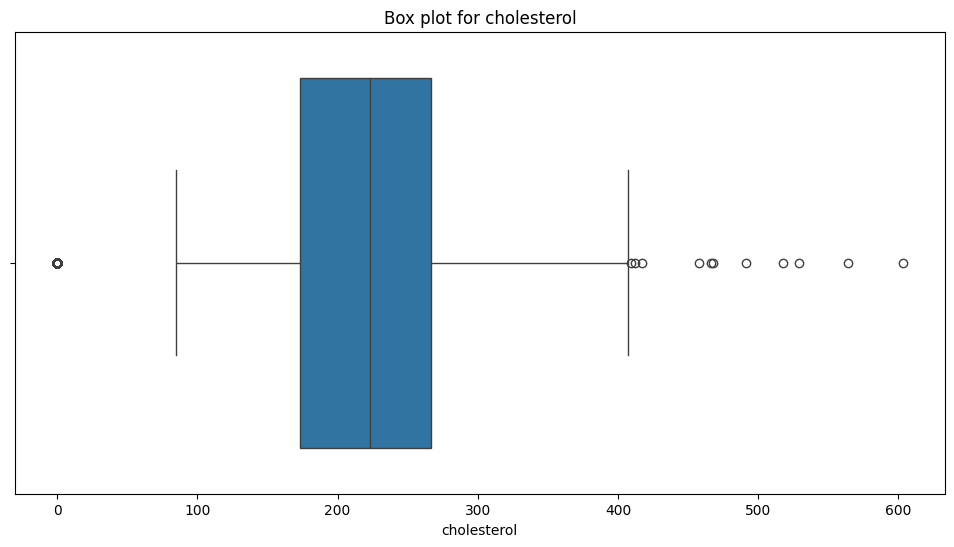

In [323]:
# Plot the box plot for the cholesterol column and print the number of outliers
print_outliers_plot_box_column(df, 'cholesterol')

In [324]:
# View the number of patients with 0 cholesterol
zero_cholesterol = df[df['cholesterol'] == 0]
print("Number of patients with 0 cholesterol: ", zero_cholesterol.shape[0])

Number of patients with 0 cholesterol:  172


Notes:
- The mode is at the 0 because there are 172 patients with 0 cholestrol , there can't be a human being with 0 cholesterol level , which suggests that this is a placeholder for an unknown/missing value, such problem will be solved by imputing the zero values to the mean or the median.
- It has 183 outliers

#### 6.Sex
sex of the patient [M: Male, F: Female]

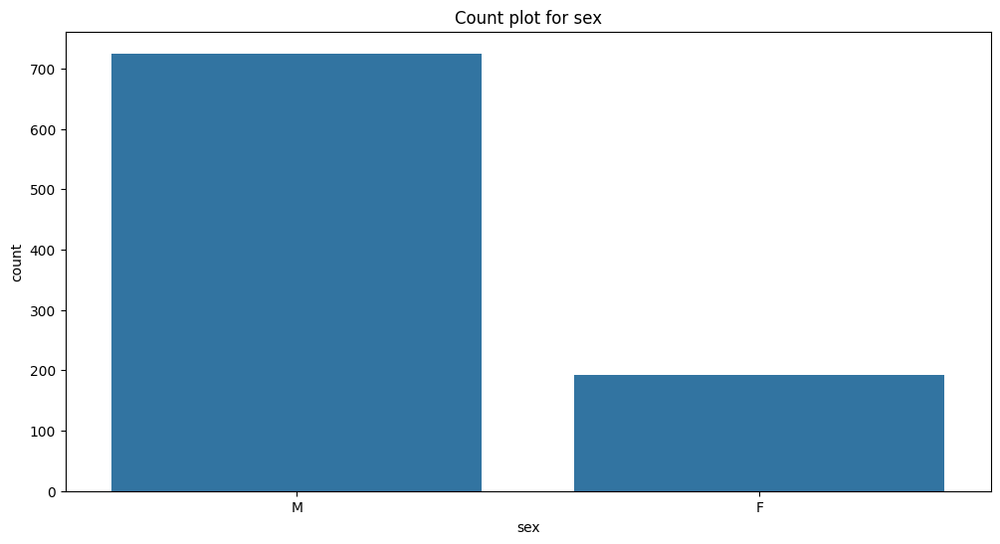

In [325]:
# Plot the count plot for the sex column
plot_count(df, 'sex')

heartdisease         0         1
sex                             
F             0.740933  0.259067
M             0.368276  0.631724


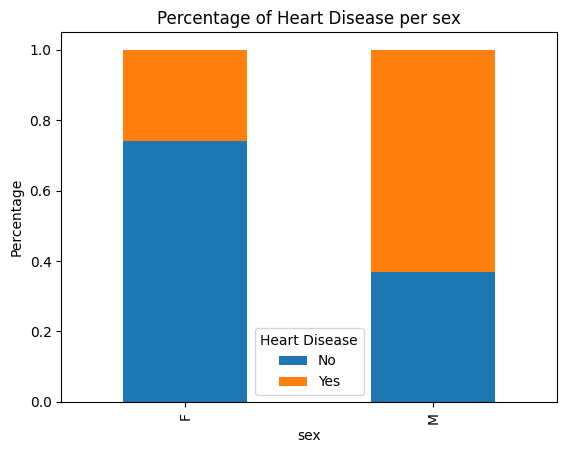

In [326]:
# View the percentage of heart disease in the dataset for each gender
disease_per_unique_col_value(df,'sex')

Notes:
- The dataset contains more `M` (Males) than `F` (Females)
- It seems like that a higher percentage of males have a heart disease compared to females

#### 7. ChestPainType
chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic]

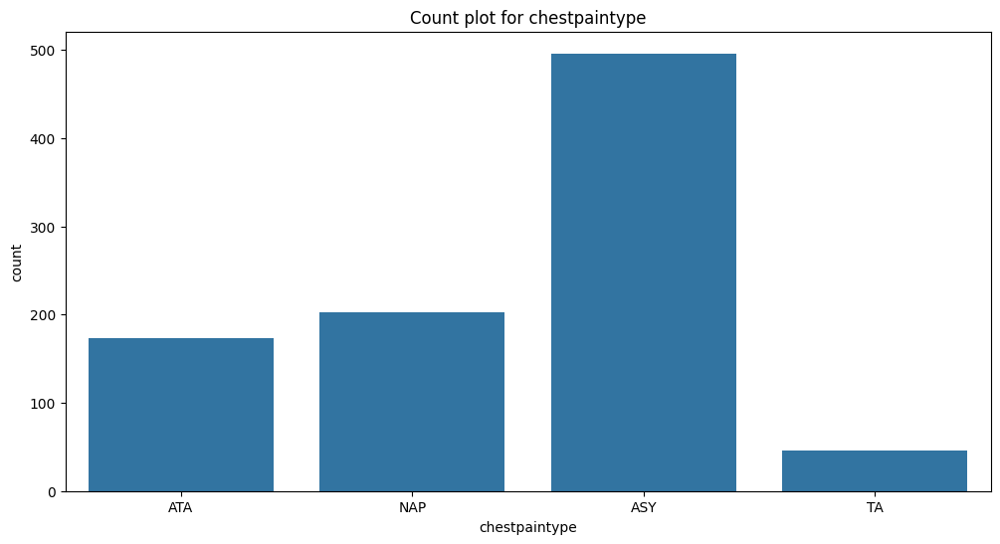

In [327]:
# Plot the count plot for the chestpaintype column
plot_count(df, 'chestpaintype')

heartdisease          0         1
chestpaintype                    
ASY            0.209677  0.790323
ATA            0.861272  0.138728
NAP            0.645320  0.354680
TA             0.565217  0.434783


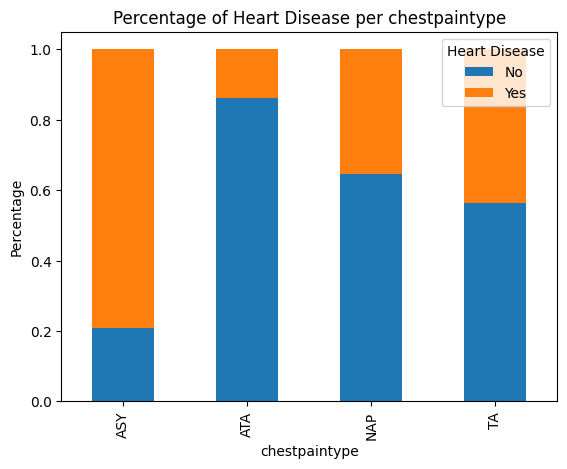

In [328]:
# View the percentage of heart disease in the dataset for each chest pain type
disease_per_unique_col_value(df,'chestpaintype')

Notes:
- The dataset contains more `ASY` (Asymptomatic) than `NAP` (Non-Anginal Pain)
- The dataset contains more `NAP` (Non-Anginal Pain) than `ATA` (Atypical Angina)
- The dataset contains more `ATA` (Atypical Angina) than `TA` (Typical Angina)
- Those who have `ASY` seems to be more than likely to have a heart disease, while `ATA` tends to be less likely to have heart disease

#### 8. RestingECG
resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria]

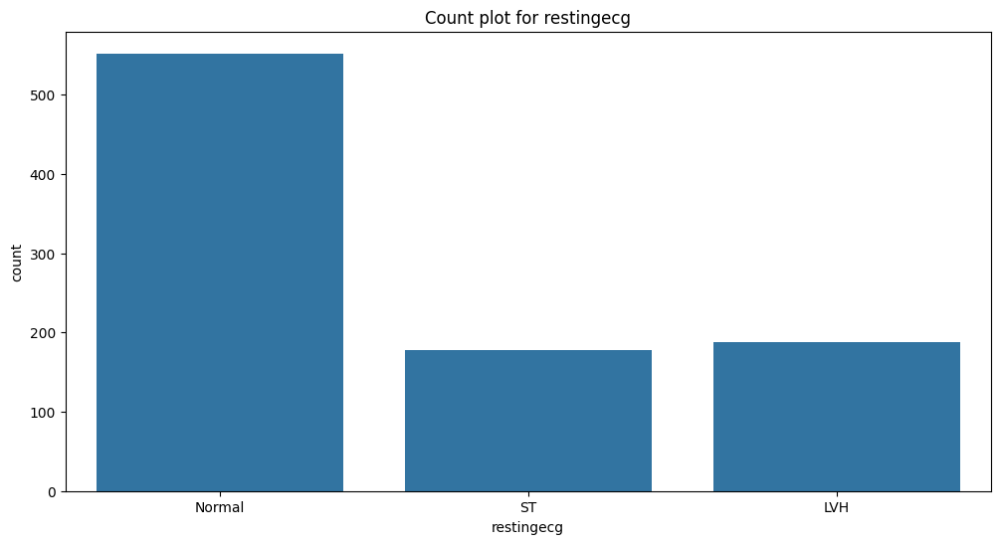

In [329]:
# Plot the count plot for the restingecg column
plot_count(df, 'restingecg')

heartdisease         0         1
restingecg                      
LVH           0.436170  0.563830
Normal        0.483696  0.516304
ST            0.342697  0.657303


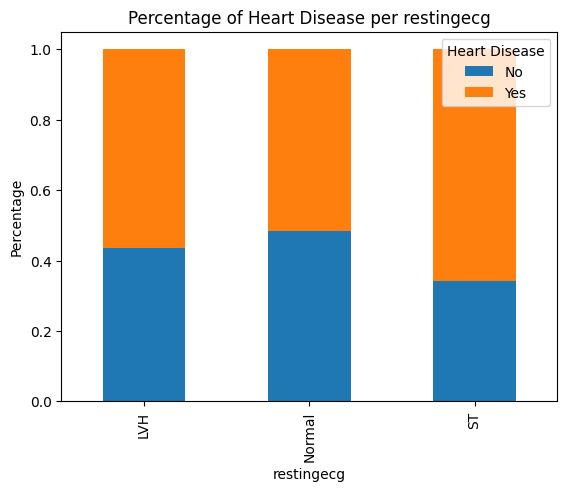

In [330]:
# View the percentage of heart disease in the dataset for each resting ECG result
disease_per_unique_col_value(df,'restingecg')

Notes:
- The dataset contains more `Normal`  than `LVH`
- The dataset contains slightly more `LVH` than `ST`
- However, the restingecg looks like not highly affecting the percentage of heart failure, but patients having a restingecg of `ST` tend to have a slightly higher risk of heart failure

#### 9. ExerciseAngina
exercise-induced angina [Y: Yes, N: No]

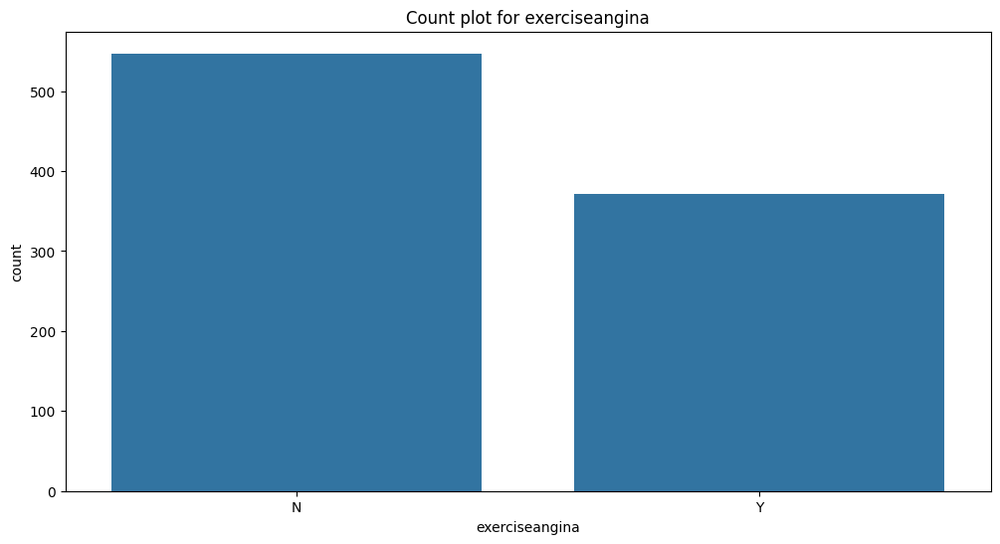

In [331]:
# Plot the count plot for the exerciseangina column
plot_count(df, 'exerciseangina')

heartdisease           0         1
exerciseangina                    
N               0.648995  0.351005
Y               0.148248  0.851752


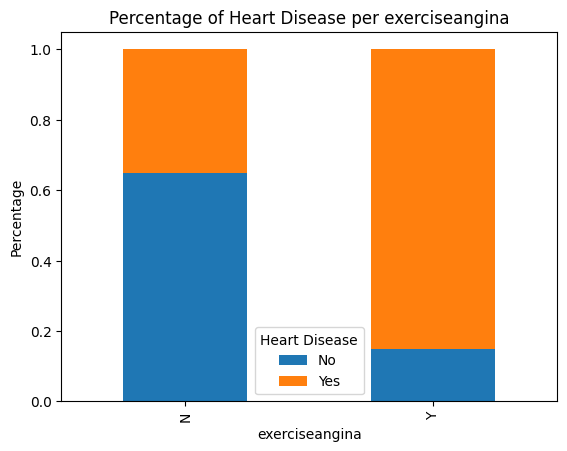

In [332]:
# View the percentage of heart disease in the dataset for each exercise-induced angina result
disease_per_unique_col_value(df,'exerciseangina')

Notes:
- The dataset contains more `N` (No) than `Y` (Yes) 
- Those who have exercise-induced angina are more than likely to have a heart disease

#### 10. ST_Slope
the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]

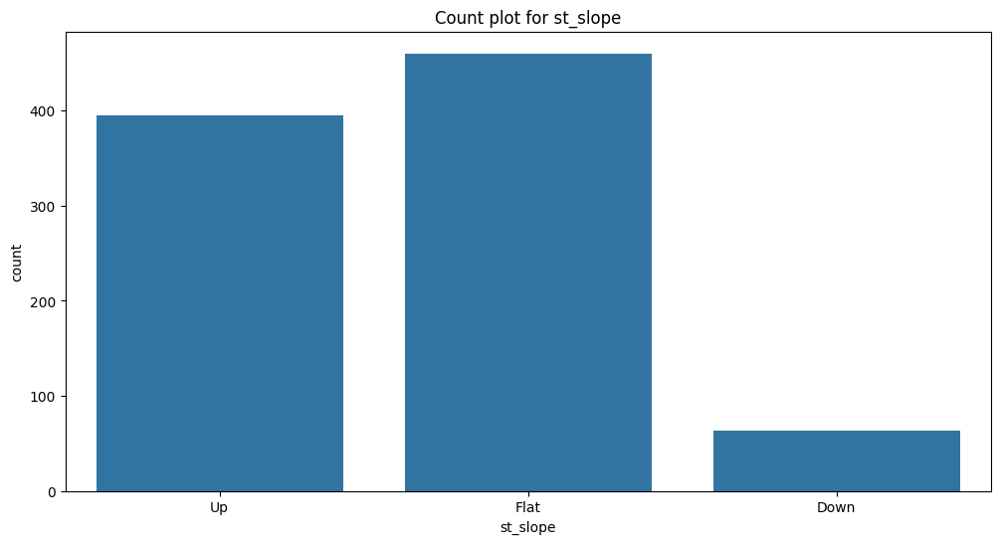

In [333]:
# Plot the count plot for the st_slope column
plot_count(df, 'st_slope')

heartdisease         0         1
st_slope                        
Down          0.222222  0.777778
Flat          0.171739  0.828261
Up            0.802532  0.197468


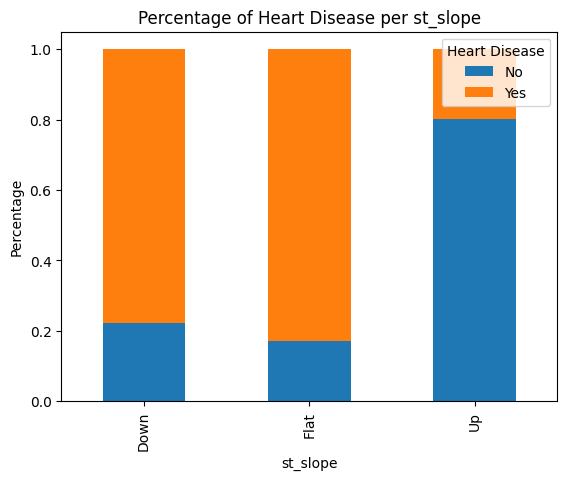

In [334]:
# View the percentage of heart disease in the dataset for each ST slope type
disease_per_unique_col_value(df,'st_slope')

Notes:
- The dataset contains slightly more `Flat` than `Up` (upsloping)
- The dataset contains more `Up` (upsloping)  than `Down` (Downsloping)
- Those who have their slope as `Up` are less likely to have a heart disease
- Those who have their slope as `Down` or `Flat` are more than likely to have a heart disease , with almost equal percentage in both classes

#### 11. Fastingbs
fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]

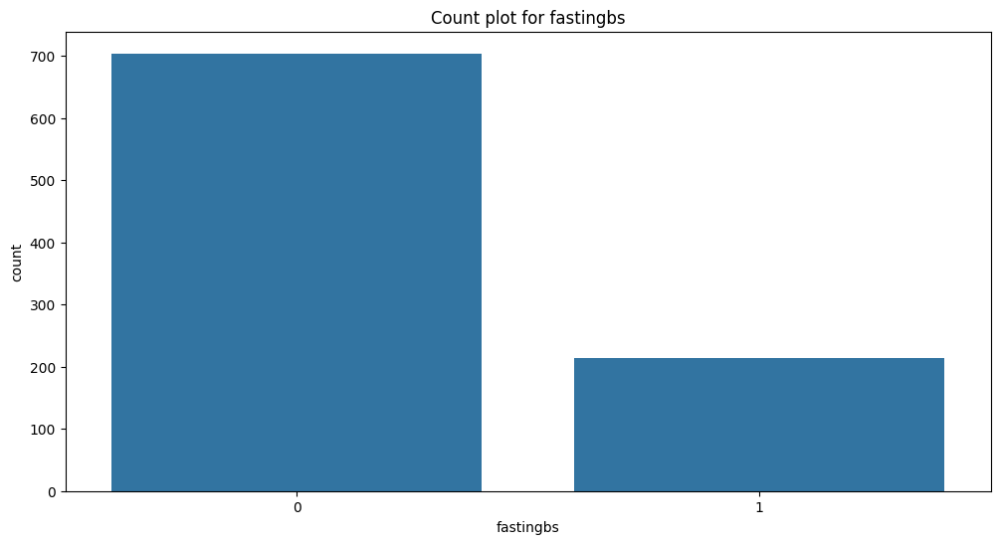

In [335]:
# Plot the count plot for the fastingbs column
plot_count(df, 'fastingbs')

heartdisease         0         1
fastingbs                       
0             0.519886  0.480114
1             0.205607  0.794393


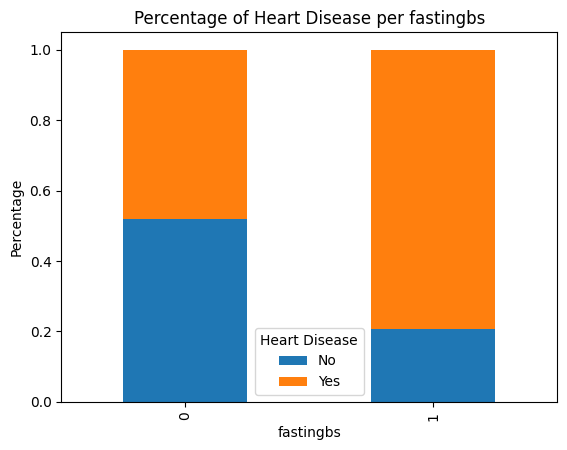

In [336]:
# View the percentage of heart disease in the dataset for each fasting blood sugar level
disease_per_unique_col_value(df,'fastingbs')

Notes:
- The dataset contains more `0` (FastingBS <= 120 mg/dl)  than `1` (FastingBS > 120 mg/dl)
- Those who have `fastingbs` of `1` are more than likely to have a heart disease

## 3. Data Cleaning & Preprocessing

In [337]:
# Before data preprocessing we need to split the data into features and target
X = df.drop('heartdisease', axis=1)
y = df['heartdisease']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((734, 11), (184, 11), (734,), (184,))

In [338]:
y_train.value_counts(normalize=True)

heartdisease
1    0.546322
0    0.453678
Name: proportion, dtype: float64

The number of patients with heart disease is 54.6% and the number of patients with no heart disease is 45.3% so data is almost balanced so we can carry on

In [339]:
y_test.value_counts(normalize=True)

heartdisease
1    0.581522
0    0.418478
Name: proportion, dtype: float64

### a. Cholestrol

#### i. Handling Missing Values

In [340]:
# Get the patients with non zero cholesterol
X_train_non_zero = X_train[X_train['cholesterol'] != 0]
X_train_non_zero.head()

,age,sex,chestpaintype,restingbp,cholesterol,fastingbs,restingecg,maxhr,exerciseangina,oldpeak,st_slope
795,42,M,NAP,120,240,1,Normal,194,N,0.8,Down
25,36,M,NAP,130,209,0,Normal,178,N,0.0,Up
84,56,M,ASY,150,213,1,Normal,125,Y,1.0,Flat
10,37,F,NAP,130,211,0,Normal,142,N,0.0,Up
254,55,M,ASY,145,248,0,Normal,96,Y,2.0,Flat


Mean of cholesterol:  245.5075376884422
Median of cholesterol:  237.0
Number of outliers in cholesterol: 16


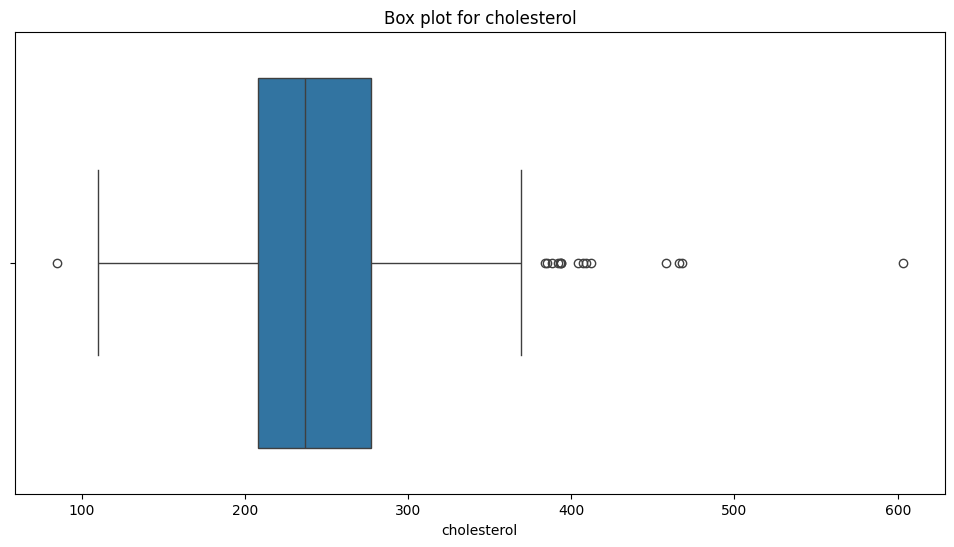

In [341]:
# Print mean and median of the cholestrol and, plot the box plot for the cholesterol column for patients with non zero cholesterol
print("Mean of cholesterol: ", X_train_non_zero['cholesterol'].mean())
print("Median of cholesterol: ", X_train_non_zero['cholesterol'].median())
print_outliers_plot_box_column(X_train_non_zero, 'cholesterol')

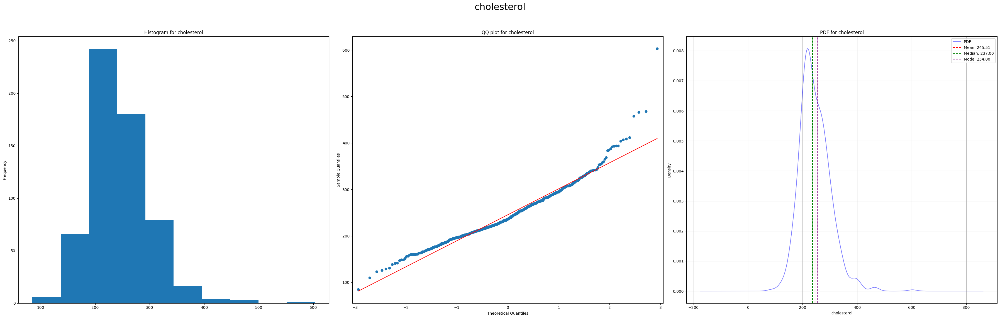

In [342]:
# Plot the distribution of the cholesterol column for patients with non zero cholesterol
plot_qq_hist_column(X_train_non_zero, 'cholesterol')

The cholestrol column is right skewed, so it will be better to impute the zero values using the median

In [343]:
# Replace (Impute) the zero cholesterol values with the median of the cholesterol column
median_non_zero = X_train_non_zero['cholesterol'].median()
X_train['cholesterol'] = X_train['cholesterol'].replace(0, median_non_zero)
X_test['cholesterol'] = X_test['cholesterol'].replace(0, median_non_zero)

# Check if the zero values have been replaced
zero_cholestrol_train = X_train[X_train['cholesterol'] == 0]
zero_cholestrol_test = X_test[X_test['cholesterol'] == 0]
zero_cholestrol_train.shape, zero_cholestrol_test.shape

((0, 11), (0, 11))

#### ii. Deal with outliers & Fixing Data Skewness

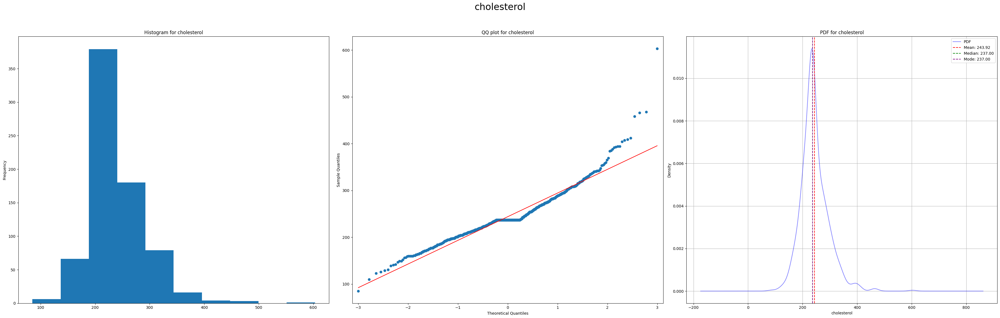

In [344]:
# Plot the distribution of the cholesterol column after replacing the zero values
plot_qq_hist_column(X_train, 'cholesterol')

In [345]:
# Get the skewness of the cholesterol column after replacing the zero values
X_train['cholesterol'].skew()

np.float64(1.2319318979267193)

Number of outliers in cholesterol: 28


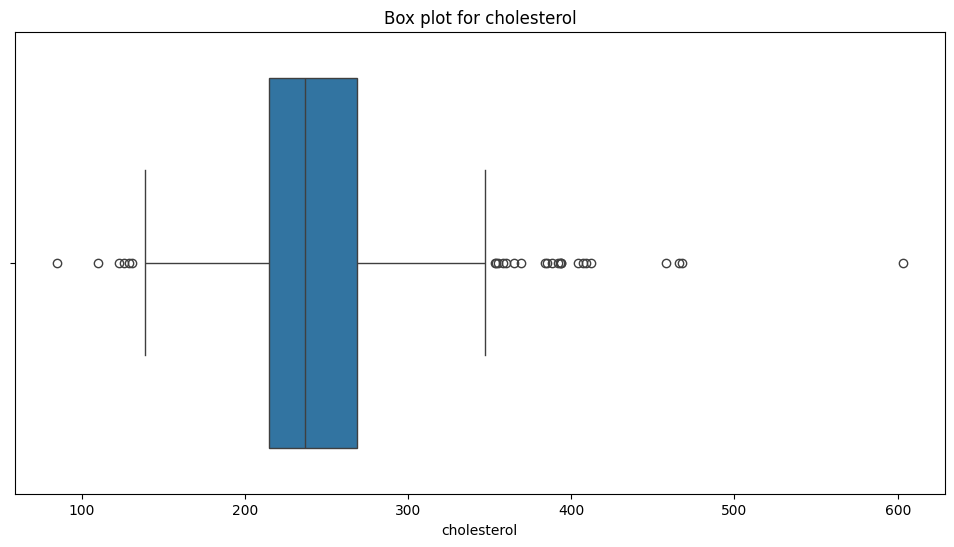

In [346]:
# Plot the box plot for the cholesterol column after replacing the zero values
print_outliers_plot_box_column(X_train, 'cholesterol')

To fix the data skewness and distribution we will try the following transformations:
1. `log transformation`
2. `sqrt transformation`
3. `box cox transformation`
4. `reciporical transformation`

##### Log Transformation

In [347]:
# Get the log transformation of the cholesterol column
log_cholestrol = np.log(X_train['cholesterol'])

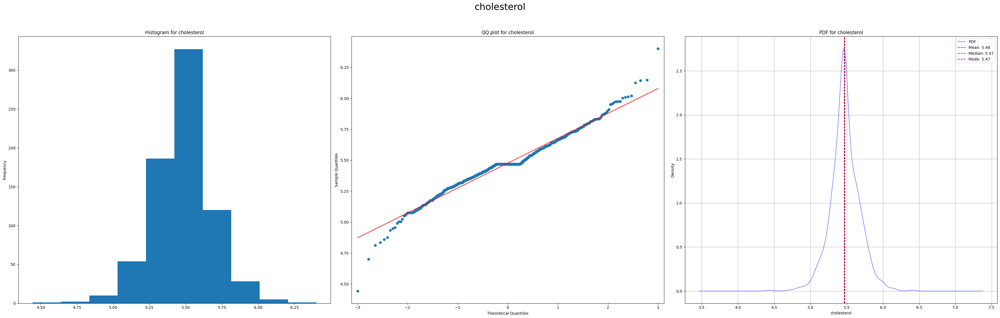

In [348]:
# Plot the distribution of the log transformed cholesterol column
plot_qq_hist_column(pd.DataFrame(log_cholestrol, columns=['cholesterol']), 'cholesterol')

In [349]:
# Get the skewness of the log transformed cholesterol column
log_cholestrol.skew()

np.float64(-0.050781283626793135)

Number of outliers in cholesterol: 28


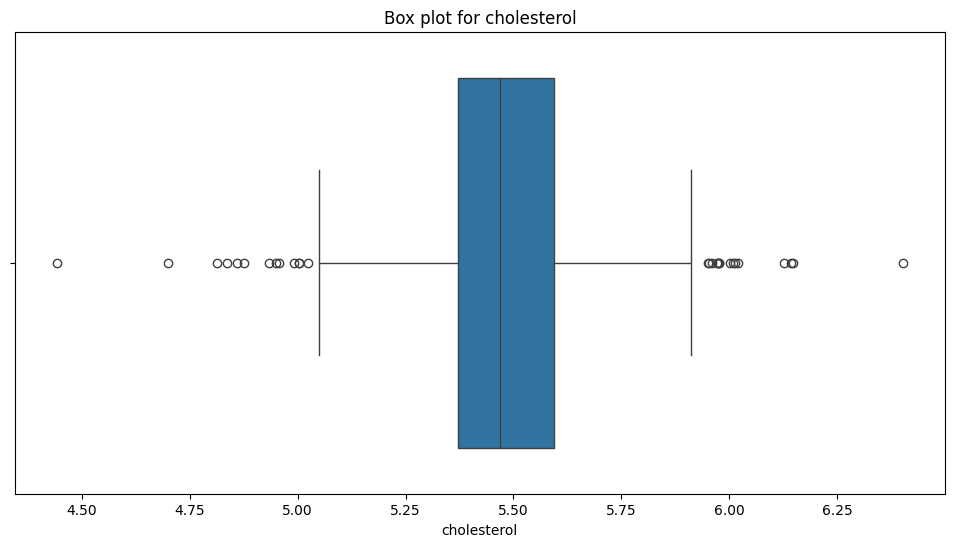

In [350]:
# Plot the box plot for the log transformed cholesterol column
print_outliers_plot_box_column(pd.DataFrame(log_cholestrol, columns=['cholesterol']), 'cholesterol')

Notes:
- Log transformation reduced skewness
- but didn't decrease the number of outliers

##### Sqrt Transformation

In [351]:
# Get the square root transformation of the cholesterol column
sqrt_cholestrol = np.sqrt(X_train['cholesterol'])

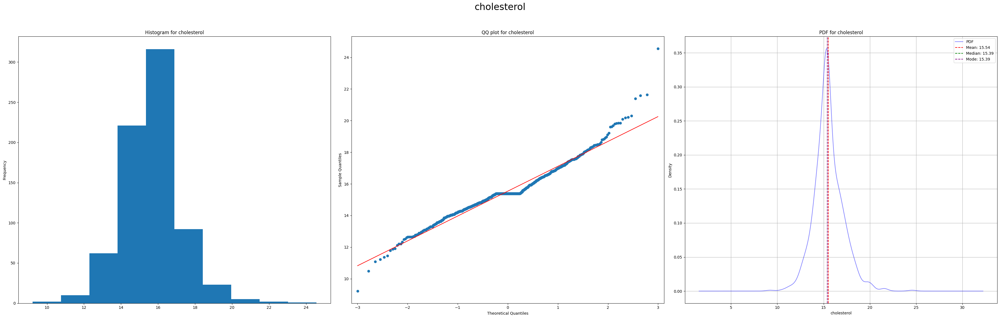

In [352]:
# Plot the distribution of the square root transformed cholesterol column
plot_qq_hist_column(pd.DataFrame(sqrt_cholestrol, columns=['cholesterol']), 'cholesterol')

In [353]:
# Get the skewness of the square root transformed cholesterol column
sqrt_cholestrol.skew()

np.float64(0.5722853601572656)

Number of outliers in cholesterol: 26


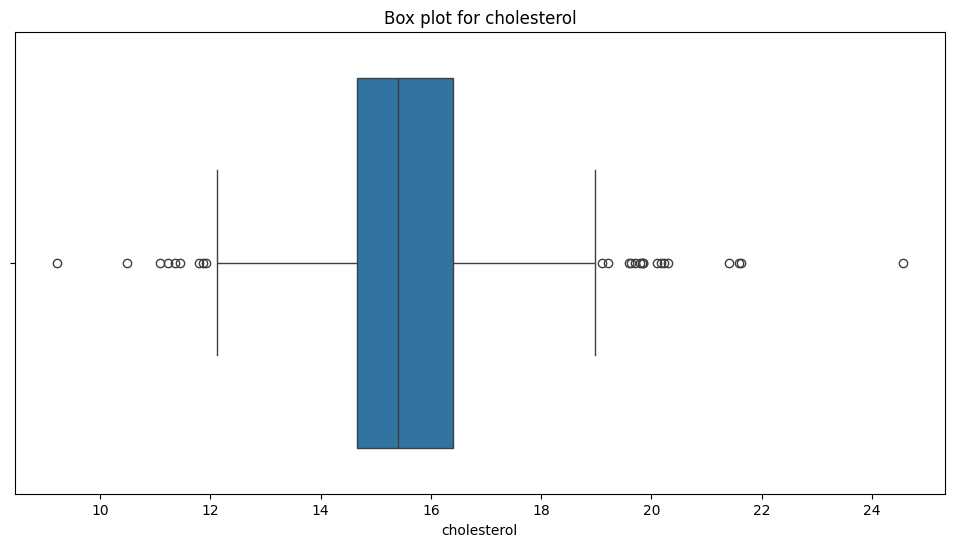

In [354]:
# Plot the box plot for the square root transformed cholesterol column
print_outliers_plot_box_column(pd.DataFrame(sqrt_cholestrol, columns=['cholesterol']), 'cholesterol')

Notes:
- The sqrt transformation decreased the skewness of the data much less than the log transformation
- But it decreased the number of outliers by only 2 data points

##### Boxcox Transformation

In [355]:
# Get the boxcox transformation of the cholesterol column
boxcox_cholestrol, lambda_val = boxcox(X_train['cholesterol'])

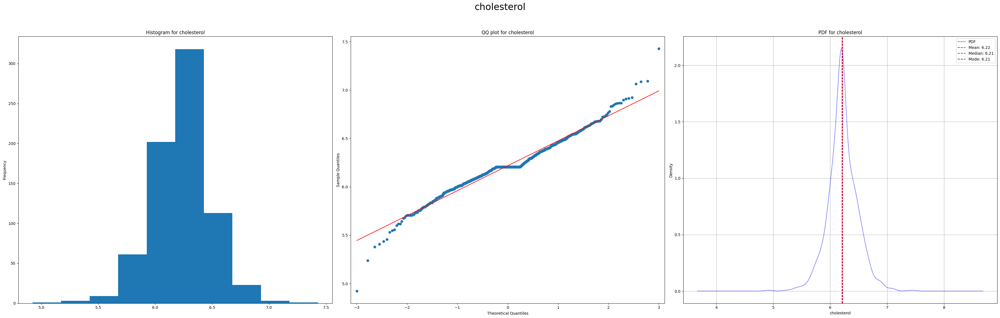

In [356]:
# Plot the distribution of the boxcox transformed cholesterol column
plot_qq_hist_column(pd.DataFrame(boxcox_cholestrol, columns=['cholesterol']), 'cholesterol')

In [357]:
# Get the skewness of the boxcox transformed cholesterol column
pd.Series(boxcox_cholestrol).skew()

np.float64(0.006618260752254604)

Number of outliers in cholesterol: 28


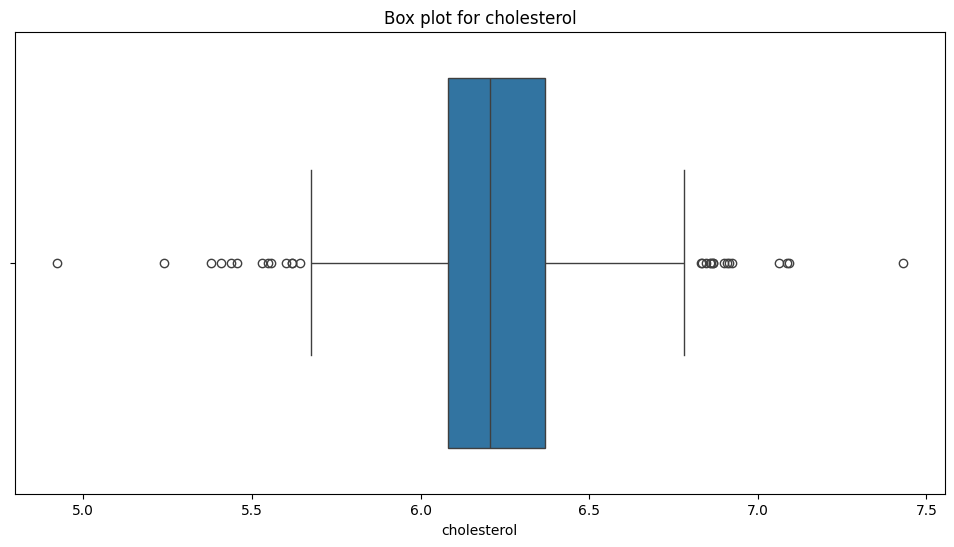

In [358]:
# Plot the box plot for the boxcox transformed cholesterol column
print_outliers_plot_box_column(pd.DataFrame(boxcox_cholestrol, columns=['cholesterol']), 'cholesterol')

Notes:
- The boxcox transformations decreased the skewness of the data the most.
- But it didn't decrease the number of outliers

##### Reciporical Transformation

In [359]:
# Get the reciprocal transformation of the cholesterol column
reciprocal_cholestrol = 1 / X_train['cholesterol']

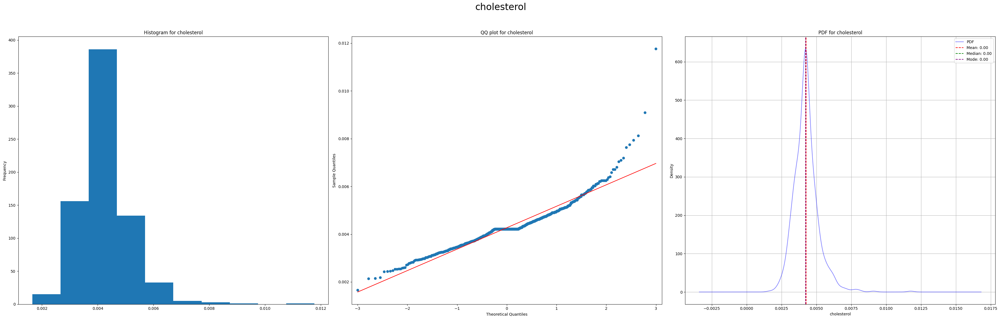

In [360]:
# Plot the distribution of the reciprocal transformed cholesterol column
plot_qq_hist_column(pd.DataFrame(reciprocal_cholestrol, columns=['cholesterol']), 'cholesterol')

In [361]:
# Get the skewness of the reciprocal transformed cholesterol column
reciprocal_cholestrol.skew()

np.float64(1.5760527835712237)

Number of outliers in cholesterol: 31


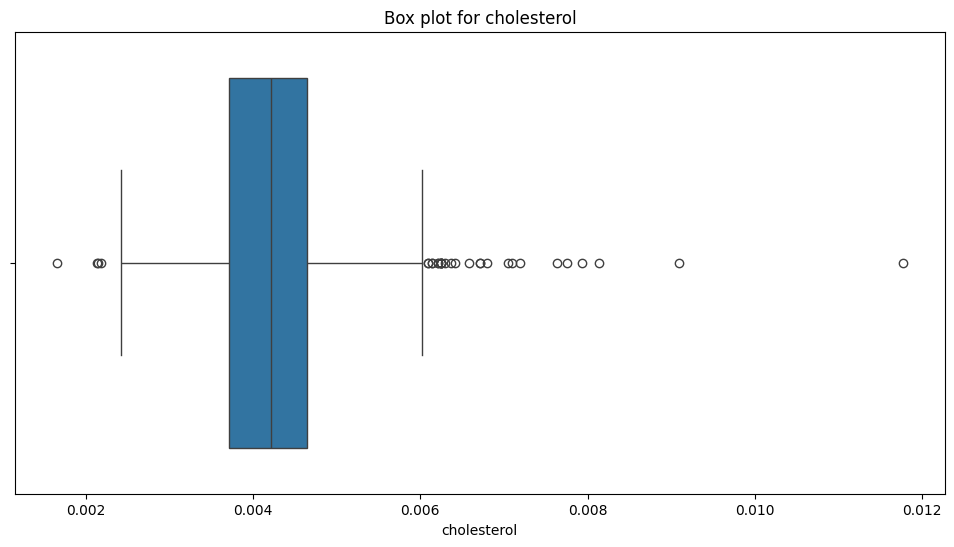

In [362]:
# Plot the box plot for the reciprocal transformed cholesterol column
print_outliers_plot_box_column(pd.DataFrame(reciprocal_cholestrol, columns=['cholesterol']), 'cholesterol')

Notes:
- The Recoprical Transformation is the worst one as it increased the number of ouliers and the skewness of the data

The boxcox transformation will be applied to the cholestrol column, this is because it is the one that improve the distribution the most.

However for outliers, the max and min values are outliers however it is normal for human beings to have those values, so there is no need to remove them.

In [363]:
# Apply the boxcox transformation to the cholesterol column
X_train['cholesterol'], lambda_val = boxcox(X_train['cholesterol'])
X_test['cholesterol'] = boxcox(X_test['cholesterol'], lmbda=lambda_val)

##### Removing Outliers

In [364]:
# Viewing the percentage of outliers in the cholesterol column after boxcox transformation
def calculate_outliers_percentage(column: pd.Series) -> Union[pd.Series, float, float]:
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = column[(column < lower_bound) | (column > upper_bound)]
    return outliers, lower_bound, upper_bound

outliers, lower_bound, upper_bound = calculate_outliers_percentage(X_train['cholesterol'])
print(f'Percentage of outliers in cholesterol after boxcox transformation: {outliers.shape[0] / X_train.shape[0] * 100:.2f}%')

Percentage of outliers in cholesterol after boxcox transformation: 3.81%


In [365]:
# Remove the outliers by replacing them with the median of the cholesterol column

def remove_outliers_replace_with_median(X_train: pd.DataFrame, X_test: pd.DataFrame, column: str) -> Tuple[pd.DataFrame, pd.DataFrame]:
    '''
    Remove the outliers in a column by replacing them with the median of the column.

    Parameters:
    X_train (pd.DataFrame): The training data.
    X_test (pd.DataFrame): The testing data.
    column (str): The column to remove the outliers from.

    Returns:
    pd.DataFrame: The training and testing data with the outliers replaced with the median.
    '''
    # Calculate the IQR, lower bound, and upper bound
    Q1 = X_train[column].quantile(0.25)
    Q3 = X_train[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Calculate the median of the column
    median_value = X_train[column].median()

    X_train[column] = np.where(X_train[column] < lower_bound, median_value, X_train[column])
    X_train[column] = np.where(X_train[column] > upper_bound, median_value, X_train[column])
    X_test[column] = np.where(X_test[column] < lower_bound, median_value, X_test[column])
    X_test[column] = np.where(X_test[column] > upper_bound, median_value, X_test[column])

    return X_train, X_test

# Apply the function to the cholesterol column
X_train, X_test = remove_outliers_replace_with_median(X_train, X_test, 'cholesterol')

X_train.shape, X_test.shape

((734, 11), (184, 11))

#### iii. Normalization

In [366]:
# Get the max, min, and mean of the cholesterol column after the boxcox transformation
X_train['cholesterol'].max(), X_train['cholesterol'].min(), X_train['cholesterol'].mean()

(np.float64(6.779795362513108),
 np.float64(5.675588319454303),
 np.float64(6.216611012278946))

In [367]:
# Use min-max scaler to scale the cholesterol column
scaler = MinMaxScaler()
X_train['cholesterol'] = scaler.fit_transform(X_train[['cholesterol']])
X_test['cholesterol'] = scaler.transform(X_test[['cholesterol']])

# Get the max, min, and mean of the cholesterol column after scaling
X_train['cholesterol'].max(), X_train['cholesterol'].min(), X_train['cholesterol'].mean()

(np.float64(1.0), np.float64(0.0), np.float64(0.4899648994503205))

### b. RestingBP

#### 1. Handling Missing Values

In [368]:
# Get the patients with non zero resting blood pressure
X_train_non_zero = X_train[X_train['restingbp'] != 0]
X_train_non_zero.head()

,age,sex,chestpaintype,restingbp,cholesterol,fastingbs,restingecg,maxhr,exerciseangina,oldpeak,st_slope
795,42,M,NAP,120,0.495478,1,Normal,194,N,0.8,Down
25,36,M,NAP,130,0.335345,0,Normal,178,N,0.0,Up
84,56,M,ASY,150,0.357236,1,Normal,125,Y,1.0,Flat
10,37,F,NAP,130,0.346340,0,Normal,142,N,0.0,Up
344,51,M,ASY,120,0.480872,1,Normal,104,N,0.0,Flat


Mean of resting blood pressure:  133.2455661664393
Median of resting blood pressure:  130.0
Number of outliers in restingbp: 23


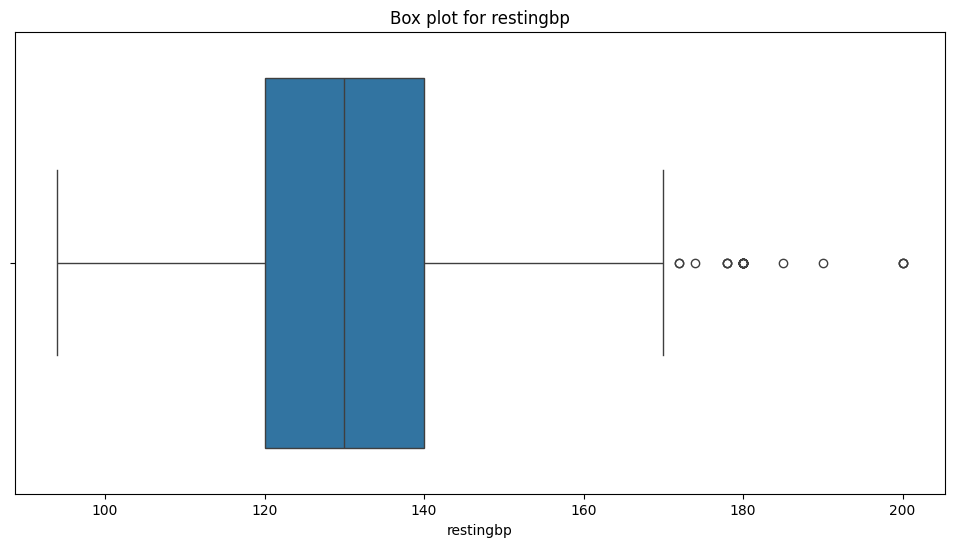

In [369]:
# Print mean and median of the resting blood pressure and, plot the box plot for the resting blood pressure column for patients with non zero resting blood pressure
print("Mean of resting blood pressure: ", X_train_non_zero['restingbp'].mean())
print("Median of resting blood pressure: ", X_train_non_zero['restingbp'].median())
print_outliers_plot_box_column(X_train_non_zero, 'restingbp')

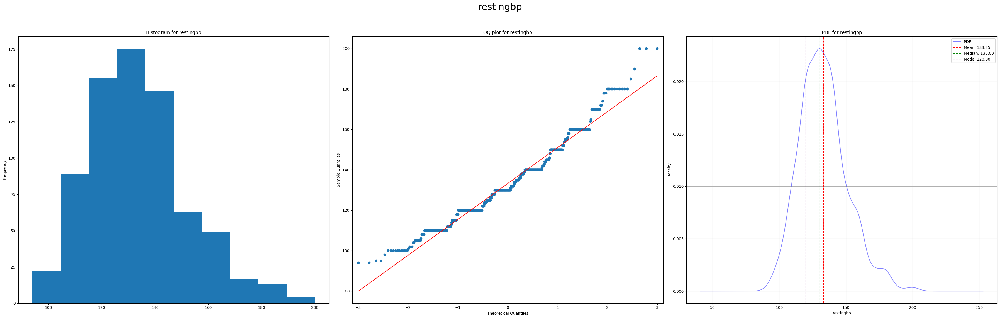

In [370]:
# Plot the distribution of the resting blood pressure column for patients with non zero resting blood pressure
plot_qq_hist_column(X_train_non_zero, 'restingbp')

In [371]:
# Get the skewness of the resting blood pressure column for patients with non zero resting blood pressure
X_train_non_zero['restingbp'].skew()

np.float64(0.6336591624077296)

The restingbp is a bit right skewed so it will be better to use the median for imputation

In [372]:
# Replace (Impute) the zero resting blood pressure values with the median of the resting blood pressure column
median_non_zero = X_train_non_zero['restingbp'].median()
X_train['restingbp'] = X_train['restingbp'].replace(0, median_non_zero)
X_test['restingbp'] = X_test['restingbp'].replace(0, median_non_zero)

# Check if the zero values have been replaced
zero_restingbp_train = X_train[X_train['restingbp'] == 0]
zero_restingbp_test = X_test[X_test['restingbp'] == 0]
zero_restingbp_train.shape, zero_restingbp_test.shape

((0, 11), (0, 11))

#### ii. Deal with outliers & Fixing Data Skewness

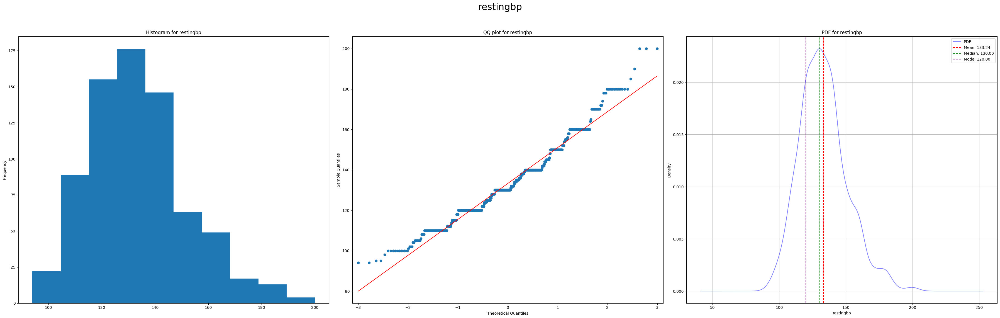

In [373]:
# Plot the distribution of the resting blood pressure column after replacing the zero values
plot_qq_hist_column(X_train, 'restingbp')

In [374]:
# Get the skewness of the resting blood pressure column after replacing the zero values
X_train['restingbp'].skew()

np.float64(0.63478640658465)

Number of outliers in restingbp: 23


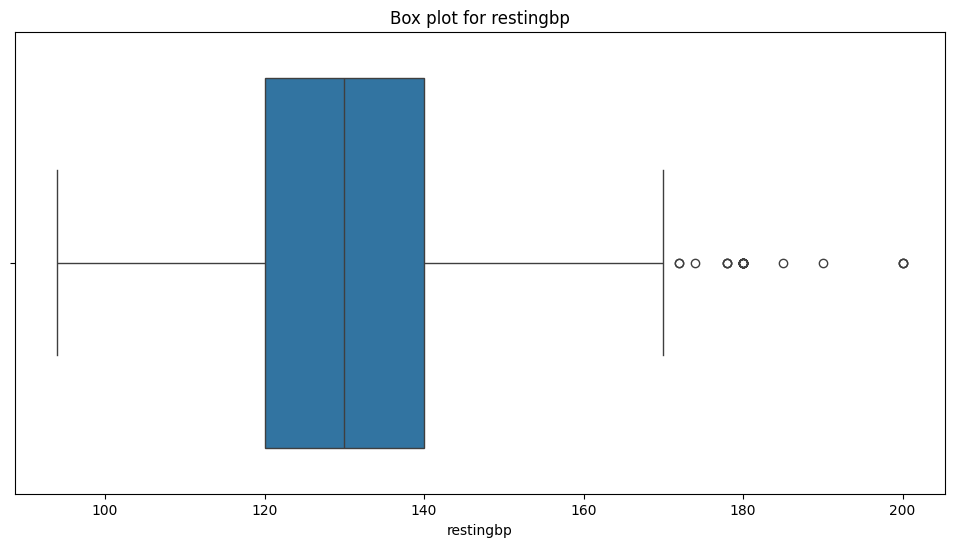

In [375]:
# Plot the box plot for the resting blood pressure column after replacing the zero values
print_outliers_plot_box_column(X_train, 'restingbp')

To fix the data skewness and distribution we will try the following transformations:
1. `log transformation`
2. `sqrt transformation`
3. `box cox transformation`
4. `reciporical transformation`

##### Log transformation

In [376]:
# Get the log transformation of the resting blood pressure column
log_restingbp = np.log(X_train['restingbp'])

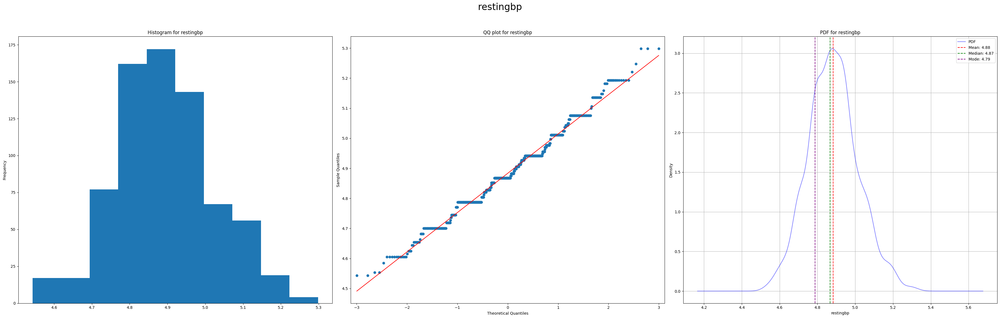

In [377]:
# Plot the distribution of the log transformed resting blood pressure column
plot_qq_hist_column(pd.DataFrame(log_restingbp, columns=['restingbp']), 'restingbp')

In [378]:
# Get the skewness of the log transformed resting blood pressure column
log_restingbp.skew()

np.float64(0.22388787962602658)

Number of outliers in restingbp: 24


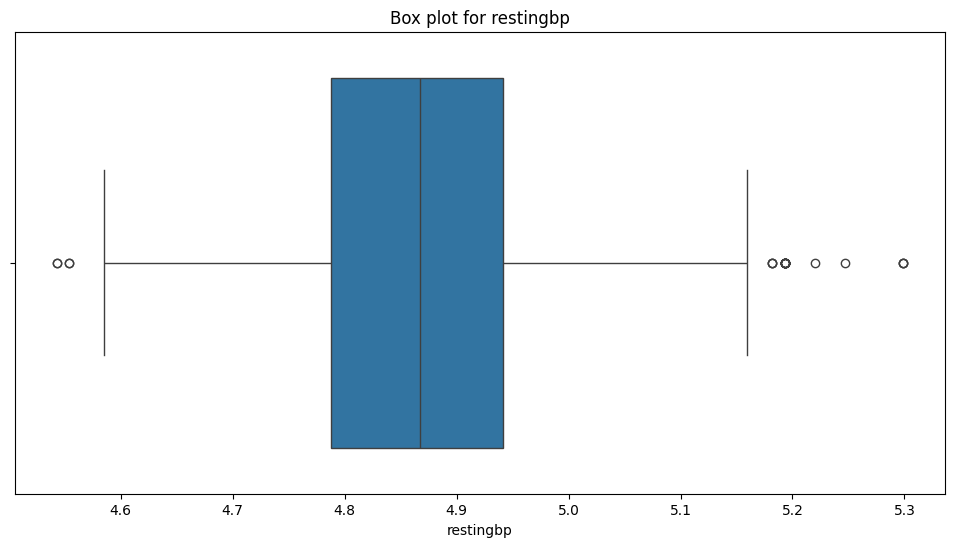

In [379]:
# Plot the box plot for the log transformed resting blood pressure column
print_outliers_plot_box_column(pd.DataFrame(log_restingbp, columns=['restingbp']), 'restingbp')

Notes:
- The log transformation improved the skewness
- However, it increased the number of outliers

##### Sqrt Transformation

In [380]:
# Get the square root transformation of the resting blood pressure column
sqrt_restingbp = np.sqrt(X_train['restingbp'])

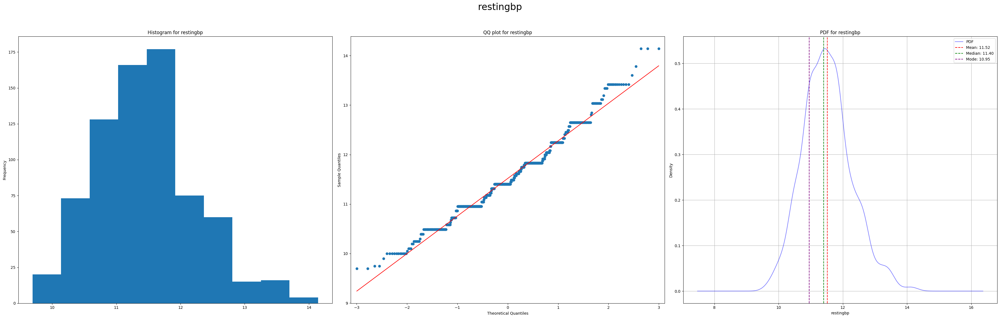

In [381]:
# Plot the distribution of the square root transformed resting blood pressure column
plot_qq_hist_column(pd.DataFrame(sqrt_restingbp, columns=['restingbp']), 'restingbp')

In [382]:
# Get the skewness of the square root transformed resting blood pressure column
sqrt_restingbp.skew()

np.float64(0.4262706400913285)

Number of outliers in restingbp: 21


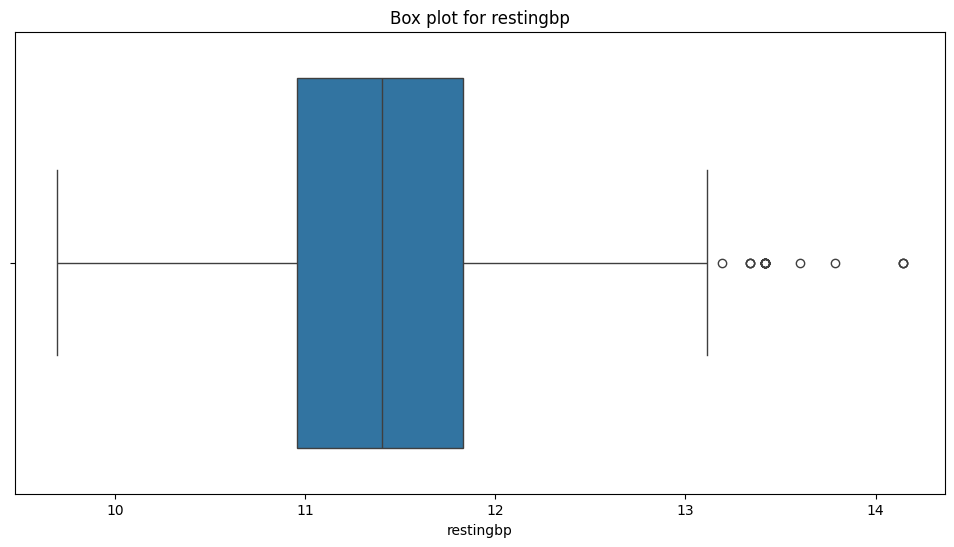

In [383]:
# Plot the box plot for the square root transformed resting blood pressure column
print_outliers_plot_box_column(pd.DataFrame(sqrt_restingbp, columns=['restingbp']), 'restingbp')

Notes:
- The sqrt transformation decreased the skewness of the data much less than the log transformation
- But it decreased the number of outliers by 3 data points

##### Boxcox Transformation

In [384]:
# Get the boxcox transformation of the resting blood pressure column
boxcox_restingbp, lambda_val = boxcox(X_train['restingbp'])

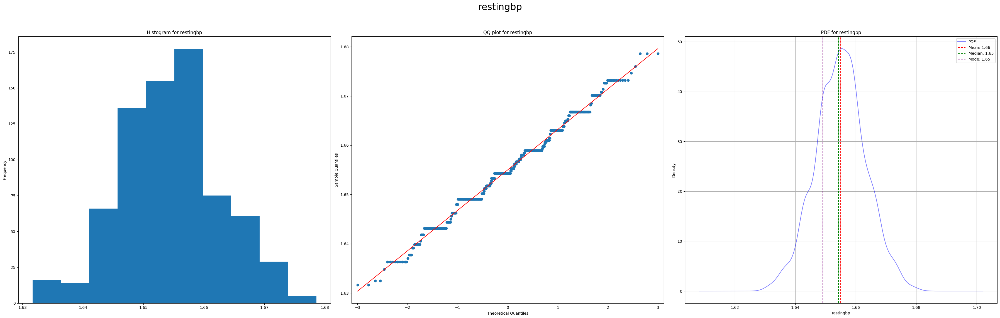

In [385]:
# Plot the distribution of the boxcox transformed resting blood pressure column
plot_qq_hist_column(pd.DataFrame(boxcox_restingbp, columns=['restingbp']), 'restingbp')

In [386]:
# Get the skewness of the boxcox transformed resting blood pressure column
pd.Series(boxcox_restingbp).skew()

np.float64(0.00017781319610577997)

Number of outliers in restingbp: 9


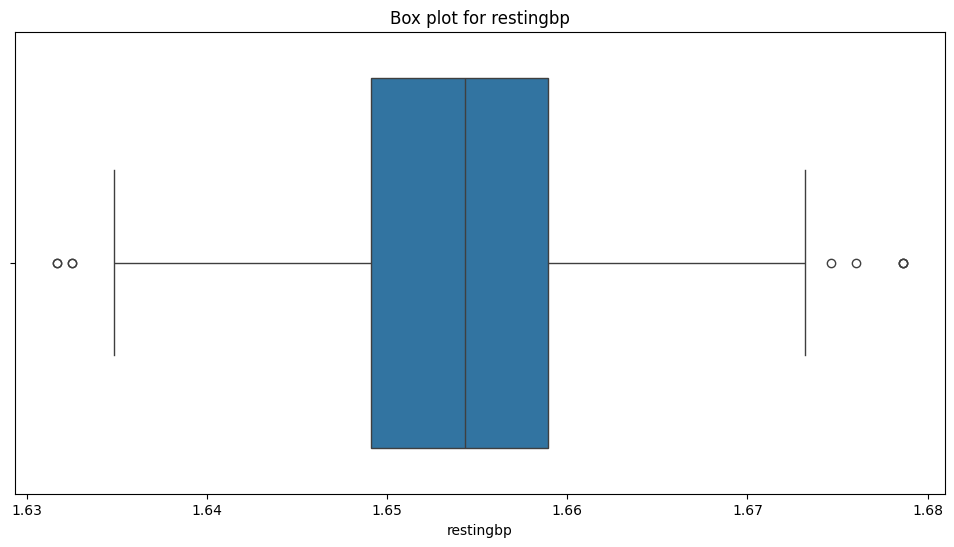

In [387]:
# Plot the box plot for the boxcox transformed resting blood pressure column
print_outliers_plot_box_column(pd.DataFrame(boxcox_restingbp, columns=['restingbp']), 'restingbp')

Notes:
- The boxcox transformation decreased the skewness as it became approximately not skewed
- It also decreased the number of ouliers as we currently have only 9 outliers

##### Recoprical Transformation

In [388]:
# Get the reciprocal transformation of the resting blood pressure column
reciprocal_restingbp = 1 / X_train['restingbp']

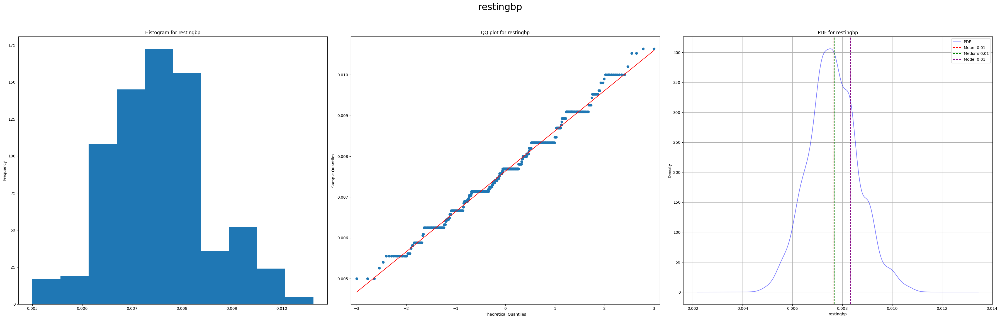

In [389]:
# Plot the distribution of the reciprocal transformed resting blood pressure column
plot_qq_hist_column(pd.DataFrame(reciprocal_restingbp, columns=['restingbp']), 'restingbp')

In [390]:
# Get the skewness of the reciprocal transformed resting blood pressure column
reciprocal_restingbp.skew()

np.float64(0.1687466845769697)

Number of outliers in restingbp: 9


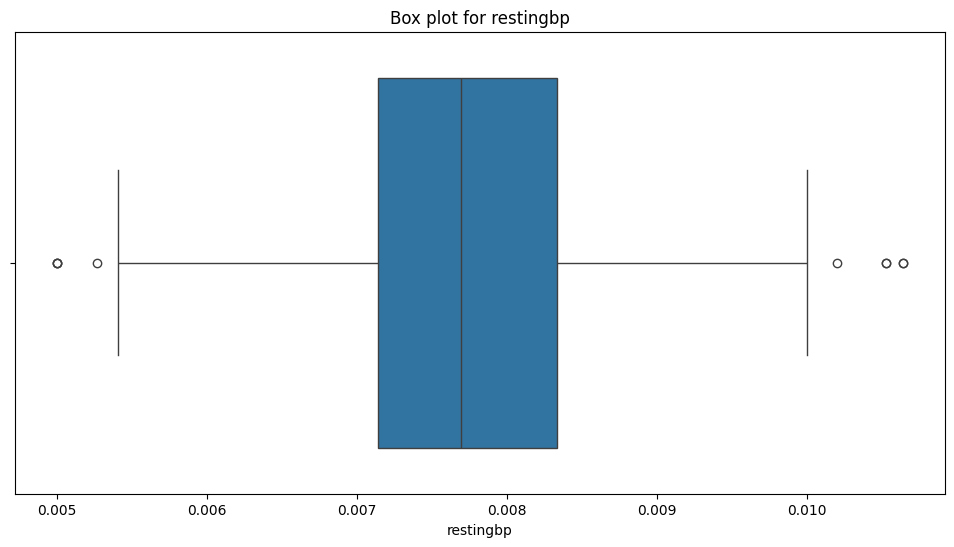

In [391]:
# Plot the box plot for the reciprocal transformed resting blood pressure column
print_outliers_plot_box_column(pd.DataFrame(reciprocal_restingbp, columns=['restingbp']), 'restingbp')

Notes:
- The Recoprical Transformation has decreased both the skewness but not as efficient as the boxcox, although having the same number of outliers

The boxcox transformation will be applied to the resting blood pressure column, this is because it it the one that improve the skewness of the distribution the most and reduces the number of outliers the most

In [392]:
# Apply the boxcox transformation to the resting blood pressure column
X_train['restingbp'], lambda_val = boxcox(X_train['restingbp'])
X_test['restingbp'] = boxcox(X_test['restingbp'], lmbda=lambda_val)

##### Removing Outliers

In [393]:
# Viewing the percentage of outliers in the resting blood pressure column after boxcox transformation
outliers, lower_bound, upper_bound = calculate_outliers_percentage(X_train['restingbp'])
print(f'Percentage of outliers in resting blood pressure after boxcox transformation: {outliers.shape[0] / X_train.shape[0] * 100:.2f}%')

Percentage of outliers in resting blood pressure after boxcox transformation: 1.23%


In [394]:
# Remove the outliers by replacing them with the median of the resting blood pressure column
X_train, X_test = remove_outliers_replace_with_median(X_train, X_test, 'restingbp')
X_train.shape, X_test.shape

((734, 11), (184, 11))

#### iii. Normalization

In [395]:
# Use min-max scaler to scale the resting blood pressure column
scaler = MinMaxScaler()
X_train['restingbp'] = scaler.fit_transform(X_train[['restingbp']])
X_test['restingbp'] = scaler.transform(X_test[['restingbp']])

# Get the max, min, and mean of the resting blood pressure column after scaling
X_train['restingbp'].max(), X_train['restingbp'].min(), X_train['restingbp'].mean()

(np.float64(1.0), np.float64(0.0), np.float64(0.5251667475696724))

### c. OldPeak

##### i. Handling Missing & Inappropriate values

In [396]:
# Get the unique negative old peak values
neg_old_peak = X_train[X_train['oldpeak'] < 0]
print("Number of negative old peak values: ", neg_old_peak.shape[0])
print("Unique values negative old peak: ", neg_old_peak['oldpeak'].unique())

Number of negative old peak values:  9
Unique values negative old peak:  [-0.1 -0.9 -0.8 -2.6 -0.5 -1.5 -2. ]


In [397]:
# Get the patients with non negative old peak values
X_train_non_negative = X_train[X_train['oldpeak'] >= 0]
X_train_non_negative.head()

,age,sex,chestpaintype,restingbp,cholesterol,fastingbs,restingecg,maxhr,exerciseangina,oldpeak,st_slope
795,42,M,NAP,0.371976,0.495478,1,Normal,194,N,0.8,Down
25,36,M,NAP,0.507629,0.335345,0,Normal,178,N,0.0,Up
84,56,M,ASY,0.735349,0.357236,1,Normal,125,Y,1.0,Flat
10,37,F,NAP,0.507629,0.346340,0,Normal,142,N,0.0,Up
344,51,M,ASY,0.371976,0.480872,1,Normal,104,N,0.0,Flat


Mean of old peak:  0.9286896551724138
Median of old peak:  0.6
Number of outliers in oldpeak: 14


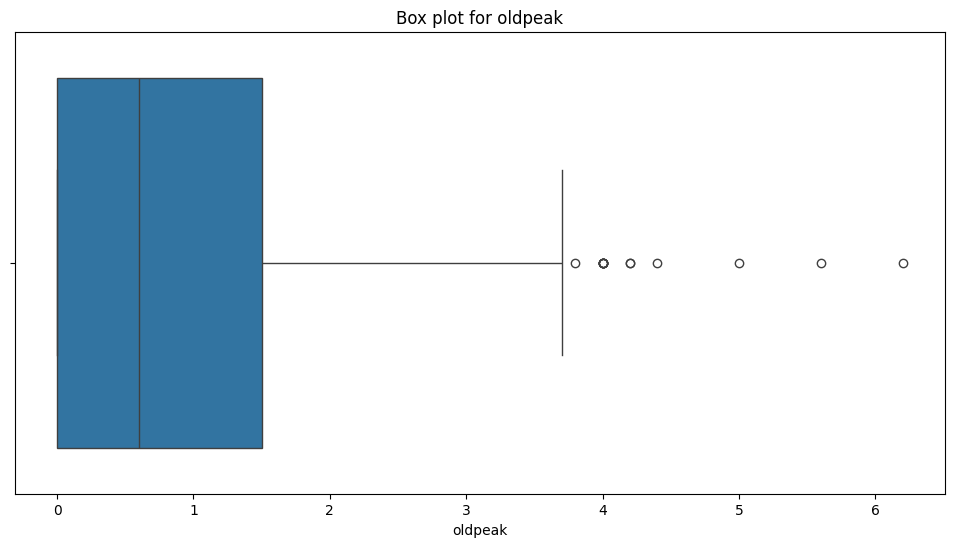

In [398]:
# Print mean and median of the old peak and, plot the box plot for the old peak column for patients with non negative old peak values
print("Mean of old peak: ", X_train_non_negative['oldpeak'].mean())
print("Median of old peak: ", X_train_non_negative['oldpeak'].median())
print_outliers_plot_box_column(X_train_non_negative, 'oldpeak')

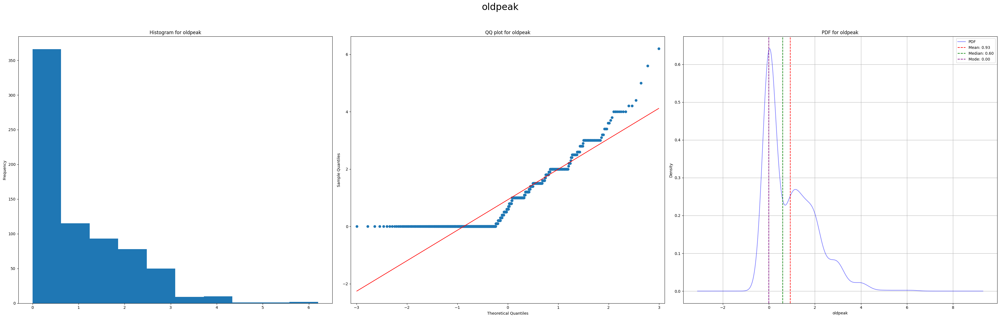

In [399]:
# Plot the distribution of the old peak column for patients with non negative old peak values
plot_qq_hist_column(X_train_non_negative, 'oldpeak')

In [400]:
# Get the skewness of the old peak column for patients with non negative old peak values
X_train_non_negative['oldpeak'].skew()

np.float64(1.162853644231877)

The oldpeak is highly right skewed so it will be better to use the median for imputation for the negative values

In [401]:
# Replace (Impute) the negative old peak values with the median of the old peak column
median_non_negative = X_train_non_negative['oldpeak'].median()
print("Median of non negative old peak: ", median_non_negative)

# replace negative values with the median of the old peak column
X_train['oldpeak'] = X_train['oldpeak'].apply(lambda x: median_non_negative if x < 0 else x)
X_test['oldpeak'] = X_test['oldpeak'].apply(lambda x: median_non_negative if x < 0 else x)

# Check if the negative values have been replaced
neg_old_peak_train = X_train[X_train['oldpeak'] < 0]
neg_old_peak_test = X_test[X_test['oldpeak'] < 0]
neg_old_peak_train.shape, neg_old_peak_test.shape


Median of non negative old peak:  0.6


((0, 11), (0, 11))

#### ii. Deal with outliers & Fixing Data Skewness

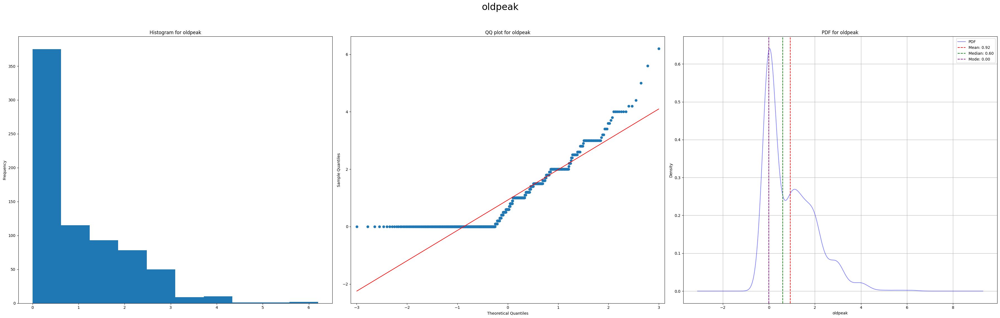

In [402]:
# Plot the distribution of the oldpeak column after replacing the negaitve values
plot_qq_hist_column(X_train, 'oldpeak')

In [403]:
# Get the skewness of the oldpeak column after replacing the negative values
X_train['oldpeak'].skew()

np.float64(1.179051595456244)

Number of outliers in oldpeak: 14


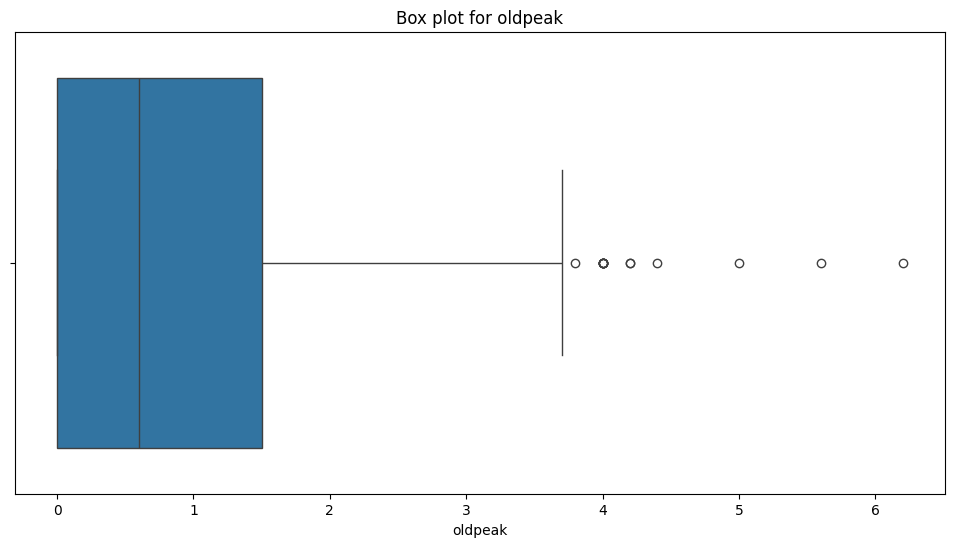

In [404]:
# Plot the box plot for the oldpeak column after replacing the negative values
print_outliers_plot_box_column(X_train, 'oldpeak')

To fix the data skewness and distribution we will try the following transformations:
1. `log transformation`
2. `sqrt transformation`
3. `box cox transformation`
4. `reciporical transformation`

##### Log Transformation

In [405]:
# Get the log transformation of the oldpeak column
# we used log1p to avoid log of 0 values as it returns -inf
log_oldpeak = np.log1p(X_train['oldpeak'])

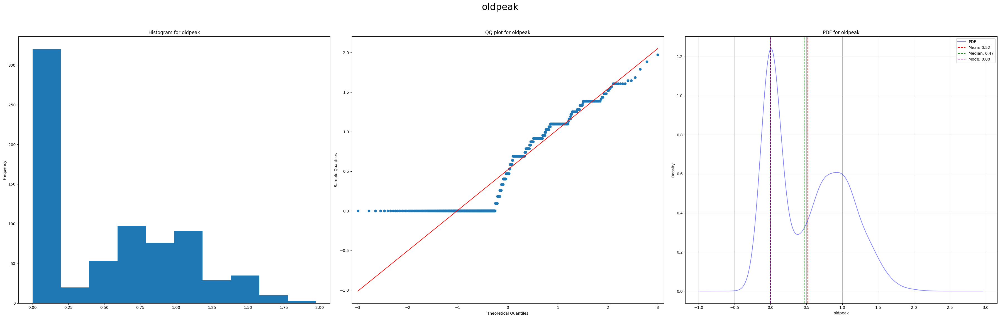

In [406]:
# Plot the distribution of the log transformed oldpeak column
plot_qq_hist_column(pd.DataFrame(log_oldpeak, columns=['oldpeak']), 'oldpeak')

In [407]:
# Get the skewness of the log transformed oldpeak column
log_oldpeak.skew()

np.float64(0.39621079787736124)

Number of outliers in oldpeak: 0


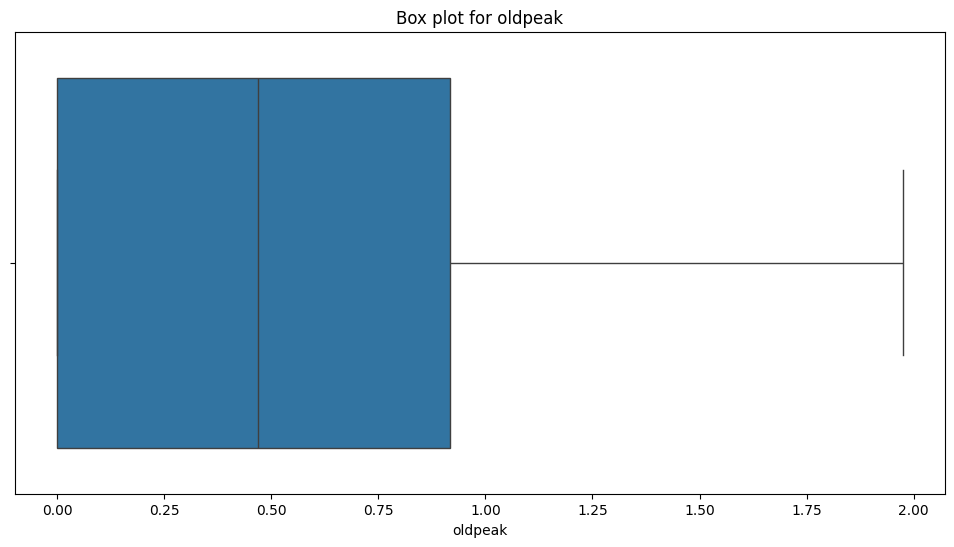

In [408]:
# Plot the box plot for the log transformed oldpeak column
print_outliers_plot_box_column(pd.DataFrame(log_oldpeak, columns=['oldpeak']), 'oldpeak')

Notes:
- Log transformation reduced skewness but the graph has a mode value of 0 but the rest of the graph looks similar to normal distrbution
- It decreased the number of outliers to 0

##### Sqrt Transformation

In [409]:
# Get the square root transformation of the oldpeak column
sqrt_oldpeak = np.sqrt(X_train['oldpeak'])

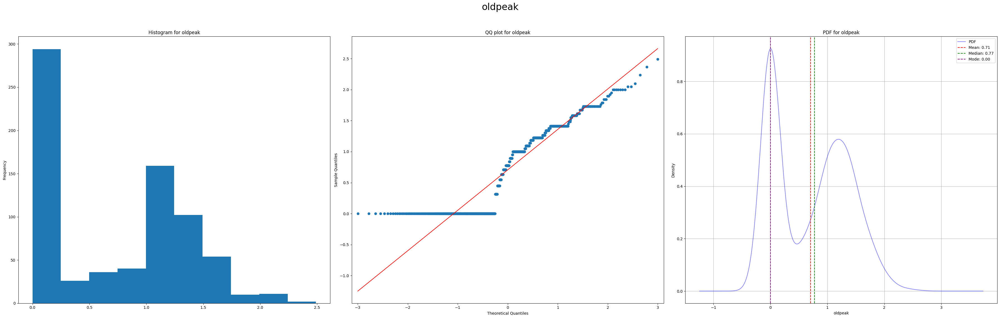

In [410]:
# Plot the distribution of the square root transformed oldpeak column
plot_qq_hist_column(pd.DataFrame(sqrt_oldpeak, columns=['oldpeak']), 'oldpeak')

In [411]:
# Get the skewness of the square root transformed oldpeak column
sqrt_oldpeak.skew()

np.float64(0.19477522860033536)

Number of outliers in oldpeak: 0


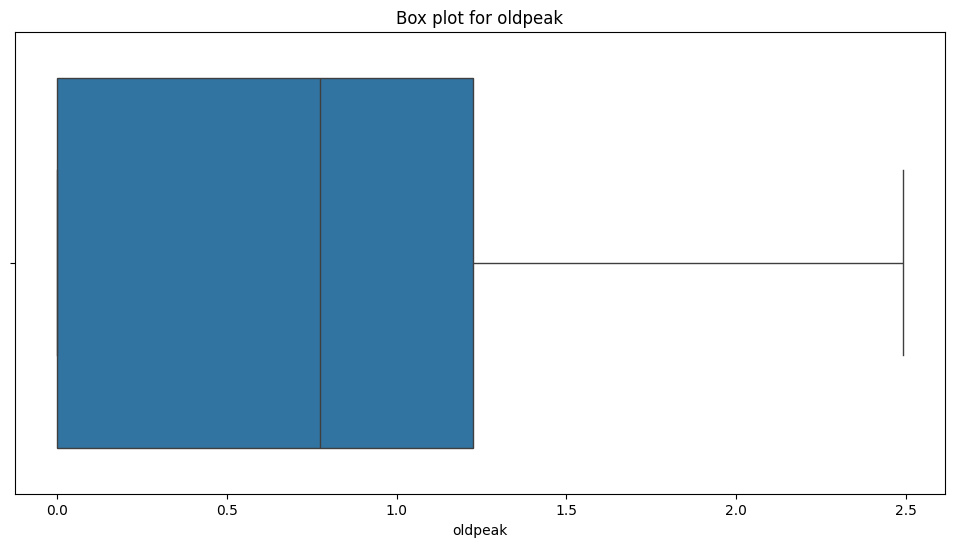

In [412]:
# Plot the box plot for the square root transformed oldpeak column
print_outliers_plot_box_column(pd.DataFrame(sqrt_oldpeak, columns=['oldpeak']), 'oldpeak')

Notes:
- The sqrt transformation decreased the skewness of the data more than the log transformation
- It decreased number of outliers to 0 like the log transformation

##### Boxcox Transformation

In [413]:
# Get the boxcox transformation of the oldpeak column
# we add 1 to the oldpeak values to avoid applying boxcox of 0 values
c = 1
boxcox_oldpeak, lambda_val = boxcox(c+X_train['oldpeak'])

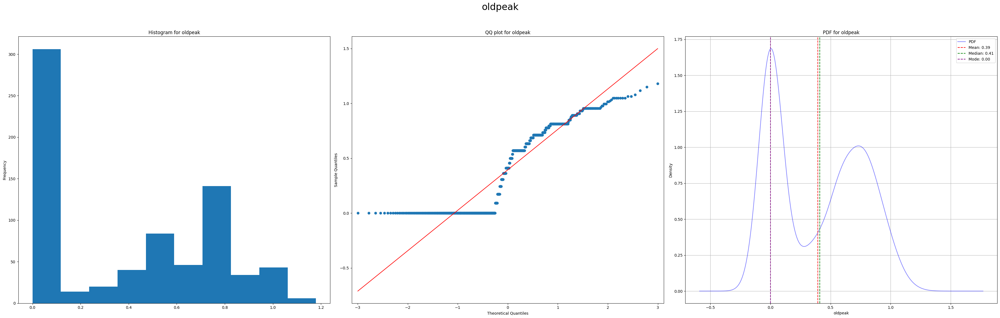

In [414]:
# Plot the distribution of the boxcox transformed oldpeak column
plot_qq_hist_column(pd.DataFrame(boxcox_oldpeak, columns=['oldpeak']), 'oldpeak')

In [415]:
# Get the skewness of the boxcox transformed oldpeak column
pd.Series(boxcox_oldpeak).skew()

np.float64(0.15292099642713894)

Number of outliers in oldpeak: 0


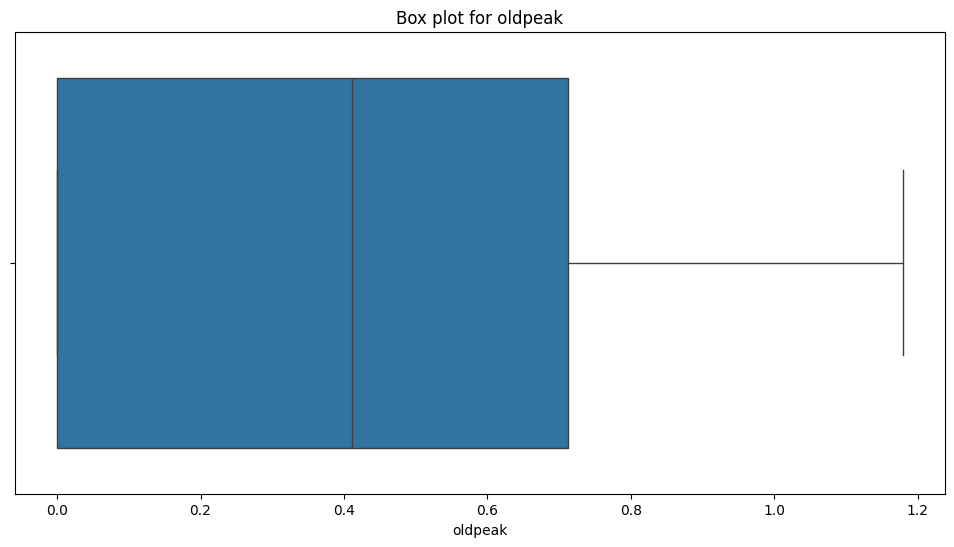

In [416]:
# Plot the box plot for the boxcox transformed oldpeak column
print_outliers_plot_box_column(pd.DataFrame(boxcox_oldpeak, columns=['oldpeak']), 'oldpeak')

Notes:
- The boxcox transformations decreased the skewness of the data the most.
- It decreased number of outliers to 0 like the sqrt and log transformations

##### Reciporical Transformation

In [417]:
# Get the reciprocal transformation of the oldpeak column
# to avoid division by 0 we add constant c to the oldpeak values
c = 1
reciprocal_oldpeak = 1 / (X_train['oldpeak']+c)

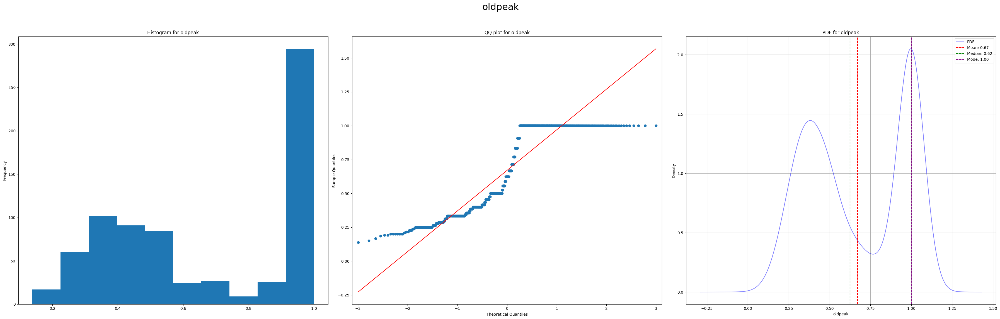

In [418]:
# Plot the distribution of the reciprocal transformed oldpeak column
plot_qq_hist_column(pd.DataFrame(reciprocal_oldpeak, columns=['oldpeak']), 'oldpeak')

In [419]:
# Get the skewness of the reciprocal transformed oldpeak column
reciprocal_oldpeak.skew()

np.float64(-0.03108388421390462)

Number of outliers in oldpeak: 0


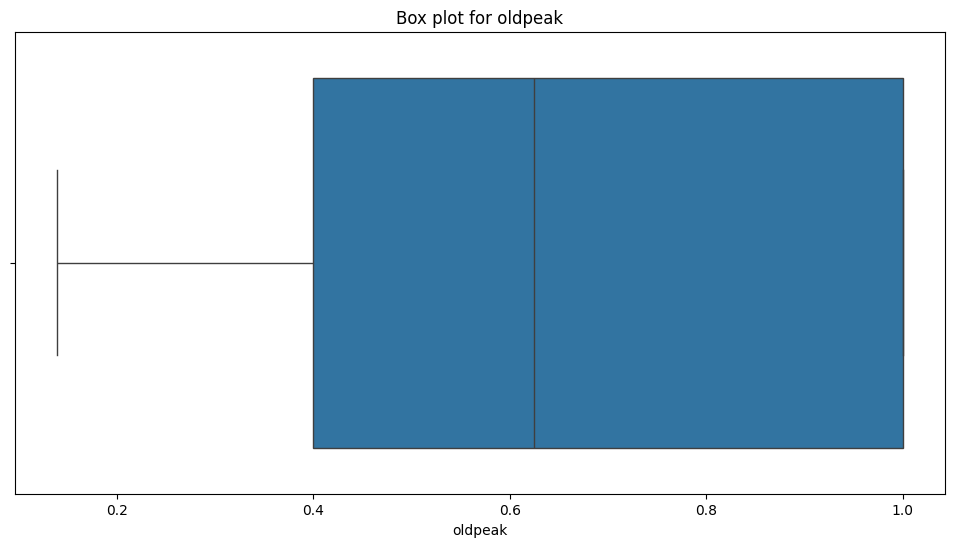

In [420]:
# Plot the box plot for the reciprocal transformed oldpeak column
print_outliers_plot_box_column(pd.DataFrame(reciprocal_oldpeak, columns=['oldpeak']), 'oldpeak')

Notes:
- The Recoprical Transformation decreased the skewness of the data the most
- It also decreased the number of outliers to 0 just like the previous transformations

The reciprocal transformation will be applied to the oldpeak column, this is because it is the one that improve the distribution the most.

However for outliers, the max and min values are outliers however it is normal for human beings to have those values, so there is no need to remove them.

In [421]:
# Apply the reciprocal transformation to the oldpeak column
c=1 # constant to avoid division by 0
X_train['oldpeak'] = 1/(X_train['oldpeak']+c)
X_test['oldpeak'] = 1/(X_test['oldpeak']+c)

##### Removing Outliers

In [422]:
# Viewing the percentage of outliers in the oldpeak column after reciprocal transformation
outliers, lower_bound, upper_bound = calculate_outliers_percentage(X_train['oldpeak'])
print(f'Percentage of outliers in oldpeak after reciprocal transformation: {outliers.shape[0] / X_train.shape[0] * 100:.2f}%')

Percentage of outliers in oldpeak after reciprocal transformation: 0.00%


#### iii. Normalization

In [423]:
# Get the max, min, and mean of the oldpeak column after replacing negative with median
X_train['oldpeak'].max(), X_train['oldpeak'].min(), X_train['oldpeak'].mean()

(np.float64(1.0),
 np.float64(0.1388888888888889),
 np.float64(0.670376750598458))

In [424]:
# Use min-max scaler to scale the oldpeak column after replacing the negative values
scaler = MinMaxScaler()
X_train['oldpeak'] = scaler.fit_transform(X_train[['oldpeak']])
X_test['oldpeak'] = scaler.transform(X_test[['oldpeak']])

# Get the max, min, and mean of the oldpeak column after scaling
X_train['oldpeak'].max(), X_train['oldpeak'].min(), X_train['oldpeak'].mean()

(np.float64(0.9999999999999999),
 np.float64(0.0),
 np.float64(0.6172117103724029))

### d. Age

#### i. Handling Missing Values

In [425]:
# Get the patients with missing age values
X_train_missing_age = X_train[X_train['age'].isna()]
X_train_missing_age.head()

,age,sex,chestpaintype,restingbp,cholesterol,fastingbs,restingecg,maxhr,exerciseangina,oldpeak,st_slope


Mean of age:  53.65122615803815
Median of age:  54.0
Number of outliers in age: 0


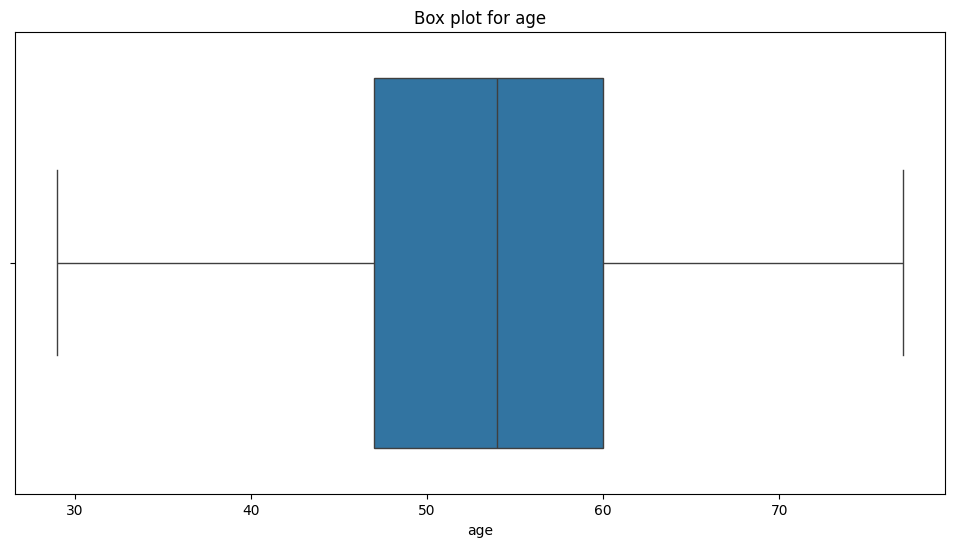

In [426]:
# Print mean and median of the cholestrol and, plot the box plot for the age column for patients with non zero cholesterol
print("Mean of age: ", X_train['age'].mean())
print("Median of age: ", X_train['age'].median())
print_outliers_plot_box_column(X_train, 'age')

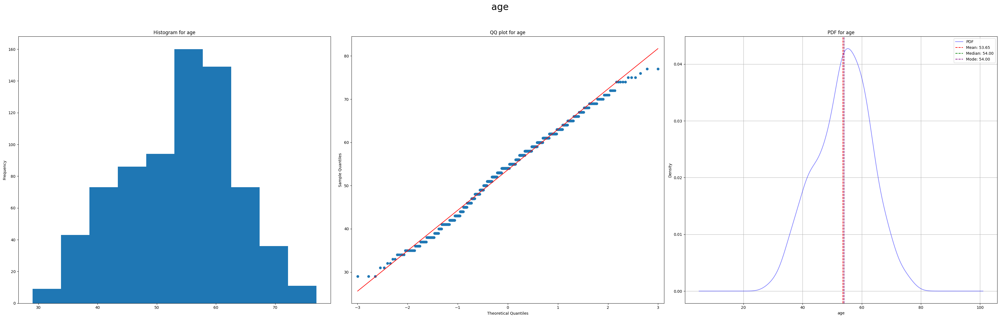

In [427]:
# Plot the distribution of the age column for patients
plot_qq_hist_column(X_train, 'age')

In [428]:
# Get the skewness of the age column
X_train['age'].skew()

np.float64(-0.18010482505129022)

- The age column is almost normally distributed (little skewness),
- It has no missing values so no imputation required
- It has no outliers so no outlier handling is required

#### ii. Fixing Data Skewness

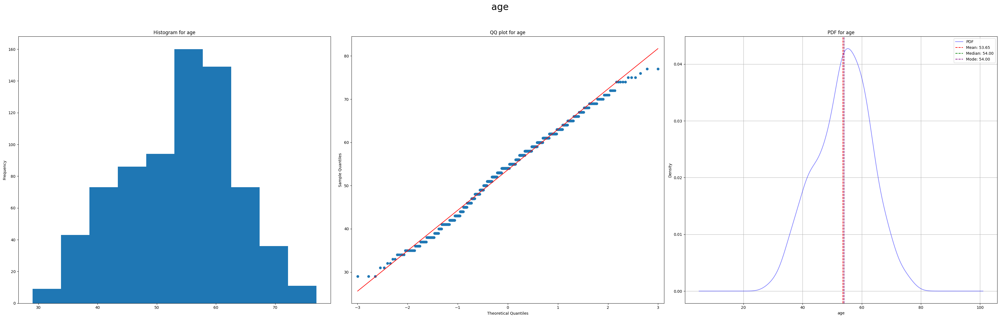

In [429]:
# Plot the distribution of the age column
plot_qq_hist_column(X_train, 'age')

In [430]:
# Get the skewness of the age column
X_train['age'].skew()

np.float64(-0.18010482505129022)

Number of outliers in age: 0


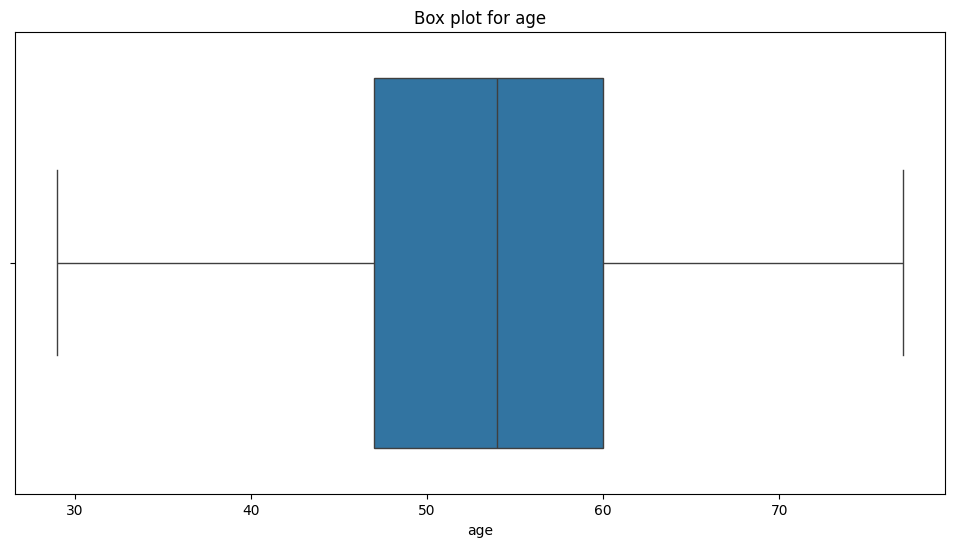

In [431]:
# Plot the box plot for the age column
print_outliers_plot_box_column(X_train, 'age')

To fix the data skewness and distribution we will try the following transformations:
1. `log transformation`
2. `sqrt transformation`
3. `box cox transformation`
4. `reciporical transformation`

##### Log Transformation

In [432]:
# Get the log transformation of the age column
log_age = np.log(X_train['age'])

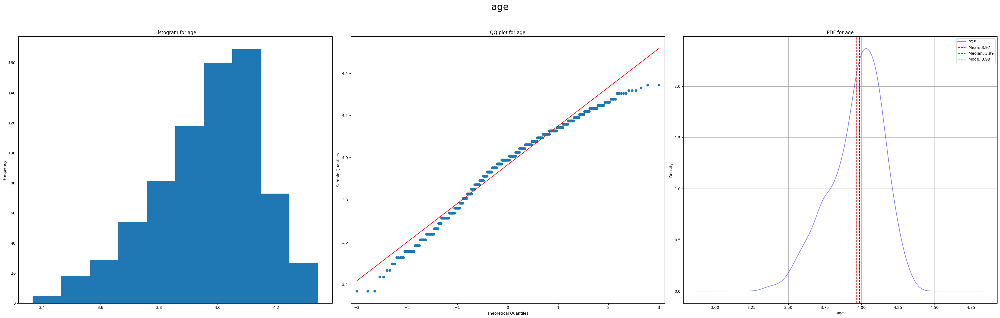

In [433]:
# Plot the distribution of the log transformed age column
plot_qq_hist_column(pd.DataFrame(log_age, columns=['age']), 'age')

In [434]:
# Get the skewness of the log transformed age column
log_age.skew()

np.float64(-0.6198704461721578)

Number of outliers in age: 7


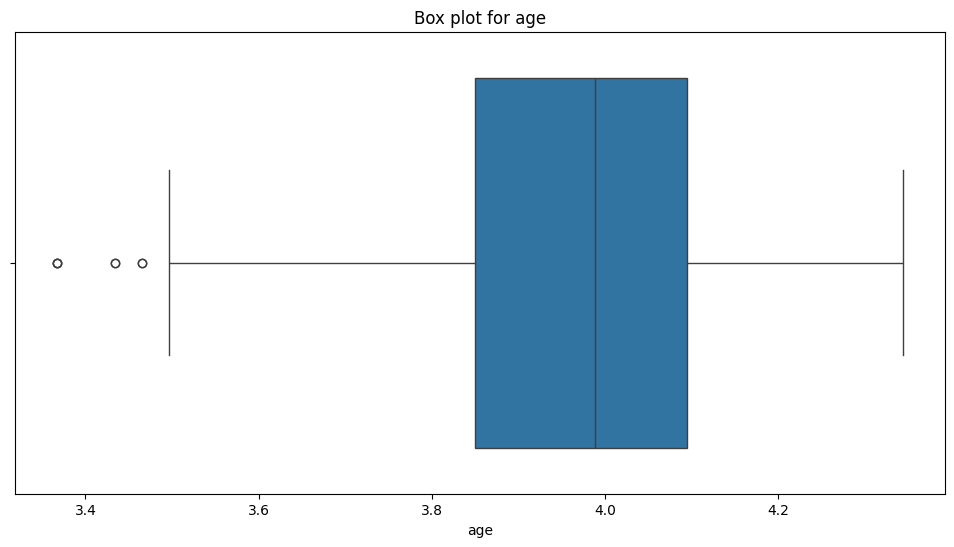

In [435]:
# Plot the box plot for the log transformed age column
print_outliers_plot_box_column(pd.DataFrame(log_age, columns=['age']), 'age')

Notes:
- Log transformation increased the magnitude of the skewness
- It increased the number of outliers to 7

##### Sqrt Transformation

In [436]:
# Get the square root transformation of the age column
sqrt_age = np.sqrt(X_train['age'])

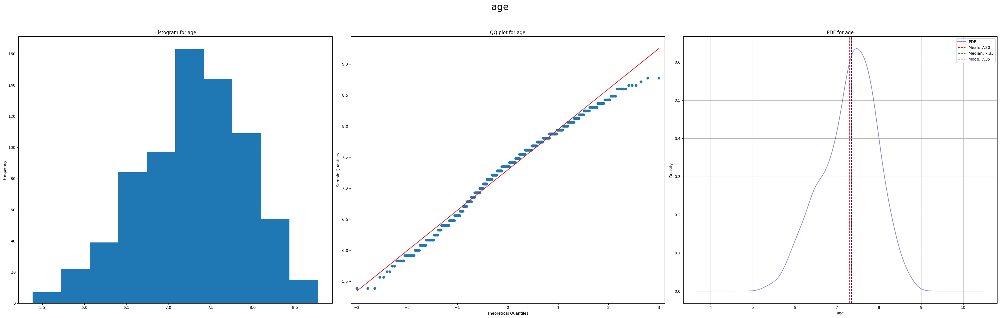

In [437]:
# Plot the distribution of the square root transformed age column
plot_qq_hist_column(pd.DataFrame(sqrt_age, columns=['age']), 'age')

In [438]:
# Get the skewness of the square root transformed age column
sqrt_age.skew()

np.float64(-0.39631466741345056)

Number of outliers in age: 3


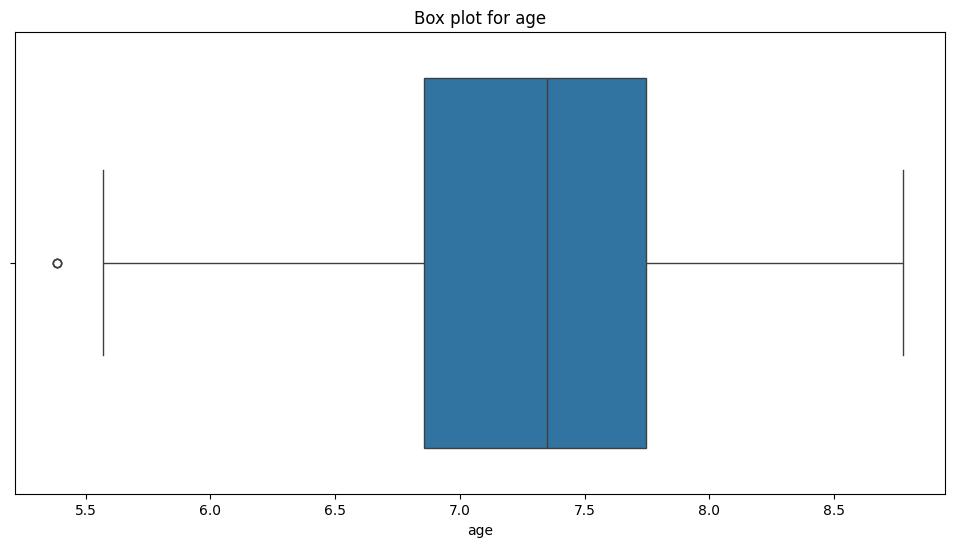

In [439]:
# Plot the box plot for the square root transformed age column
print_outliers_plot_box_column(pd.DataFrame(sqrt_age, columns=['age']), 'age')

Notes:
- The sqrt transformation increased the magnitude of skewness of the data but less than that of the log transformation
- It increased number of outliers to 3 which is less than that of the log transformation

##### Boxcox Transformation

In [440]:
# Get the boxcox transformation of the age column
boxcox_age, lambda_val = boxcox(X_train['age'])

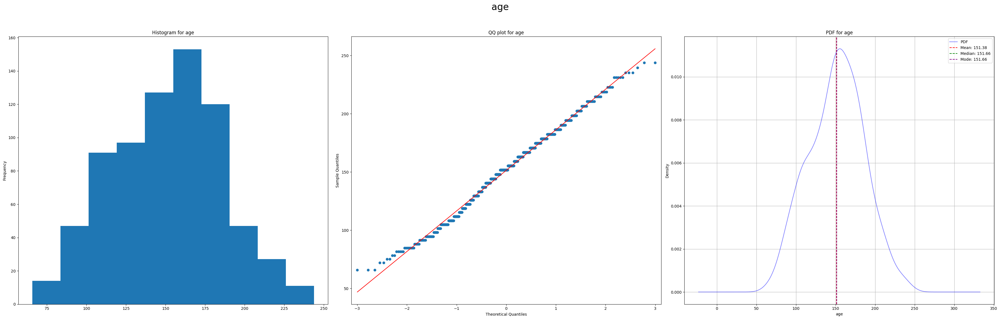

In [441]:
# Plot the distribution of the boxcox transformed age column
plot_qq_hist_column(pd.DataFrame(boxcox_age, columns=['age']), 'age')

In [442]:
# Get the skewness of the boxcox transformed age column
pd.Series(boxcox_age).skew()

np.float64(-0.03938480465827449)

Number of outliers in age: 0


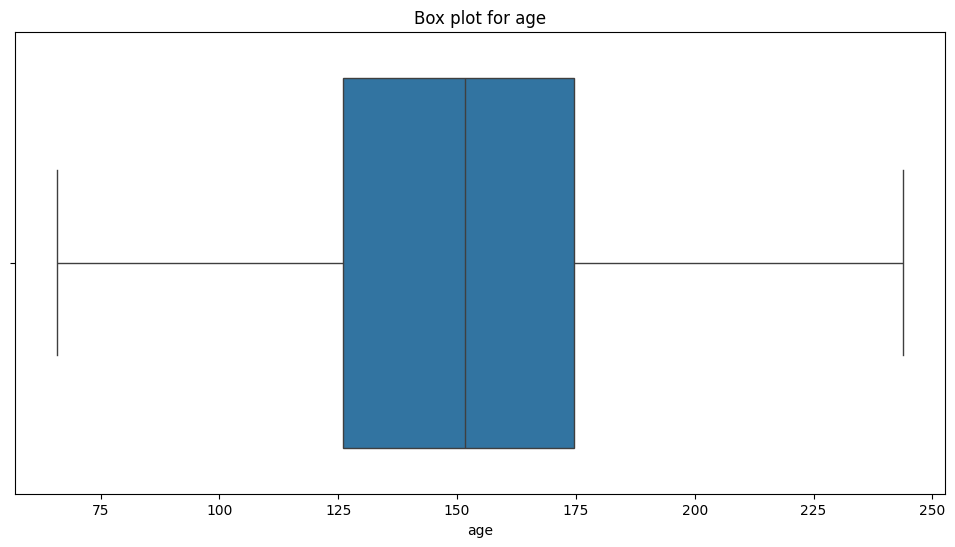

In [443]:
# Plot the box plot for the boxcox transformed age column
print_outliers_plot_box_column(pd.DataFrame(boxcox_age, columns=['age']), 'age')

Notes:
- The boxcox transformations is the only one that decreased the magnitude of the skewness of the data so far.
- Number of outliers stayed at 0

##### Reciporical Transformation

In [444]:
# Get the reciprocal transformation of the age column
reciprocal_age = 1 / X_train['age']

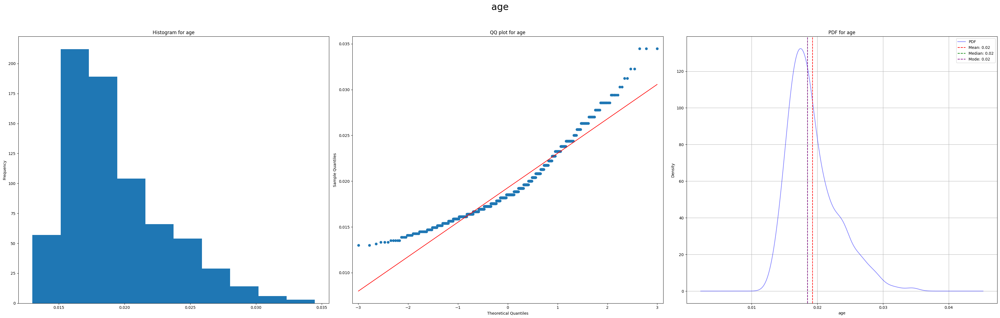

In [445]:
# Plot the distribution of the reciprocal transformed age column
plot_qq_hist_column(pd.DataFrame(reciprocal_age, columns=['age']), 'age')

In [446]:
# Get the skewness of the reciprocal transformed age column
reciprocal_age.skew()

np.float64(1.1017385479192299)

Number of outliers in age: 23


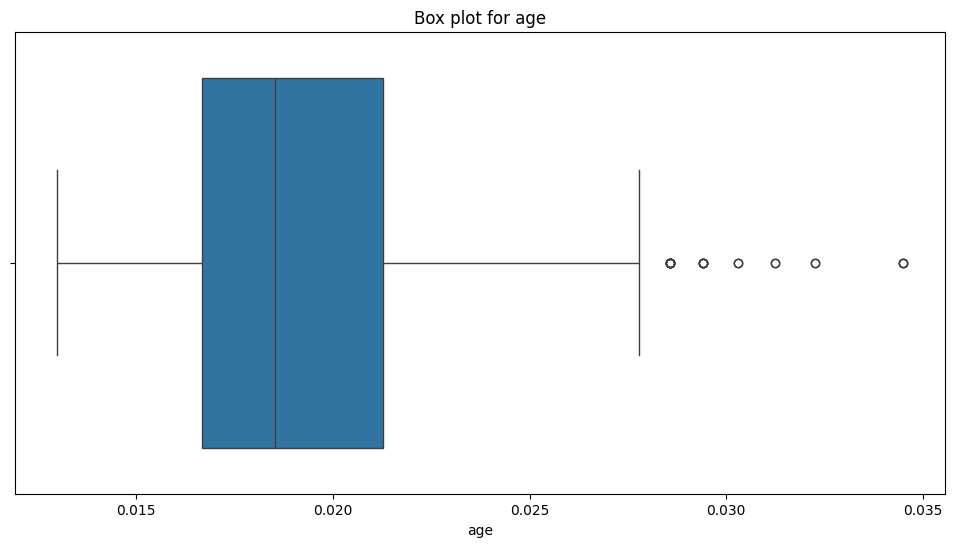

In [447]:
# Plot the box plot for the reciprocal transformed age column
print_outliers_plot_box_column(pd.DataFrame(reciprocal_age, columns=['age']), 'age')

Notes:
- The Recoprical Transformation increased the magnitude of the skewness of the data the most
- It also increased the number of outliers the most to 23

The boxcox transformation will be applied to the age column, this is because it is the one that improves the distribution the most.


In [448]:
# Apply the boxcox transformation to the age column
X_train['age'], lambda_val = boxcox(X_train['age'])
X_test['age'] = boxcox(X_test['age'], lmbda=lambda_val)

##### Removing Outliers
No outliers from above but check for completness

In [449]:
# Viewing the percentage of outliers in the age column after boxcox transformation
outliers, lower_bound, upper_bound = calculate_outliers_percentage(X_train['age'])
print(f'Percentage of outliers in age after boxcox transformation: {outliers.shape[0] / X_train.shape[0] * 100:.2f}%')

Percentage of outliers in age after boxcox transformation: 0.00%


#### iii. Normalization

In [450]:
# Get the max, min, and mean of the age column
X_train['age'].max(), X_train['age'].min(), X_train['age'].mean()

(np.float64(243.74520153388664),
 np.float64(65.83605617704497),
 np.float64(151.38235494350775))

In [451]:
# Use min-max scaler to scale the age column
scaler = MinMaxScaler()
X_train['age'] = scaler.fit_transform(X_train[['age']])
X_test['age'] = scaler.transform(X_test[['age']])

# Get the max, min, and mean of the age column after scaling
X_train['age'].max(), X_train['age'].min(), X_train['age'].mean()

(np.float64(1.0), np.float64(0.0), np.float64(0.48084261545339957))

### e. MaxHR

#### i. Handling Missing Values

In [452]:
# Get the patients with missing maxhr
X_train_missing_maxhr = X_train[X_train['maxhr'].isna()]
X_train_missing_maxhr.head()

,age,sex,chestpaintype,restingbp,cholesterol,fastingbs,restingecg,maxhr,exerciseangina,oldpeak,st_slope


Mean of maxhr:  136.17847411444143
Median of maxhr:  138.0
Number of outliers in maxhr: 1


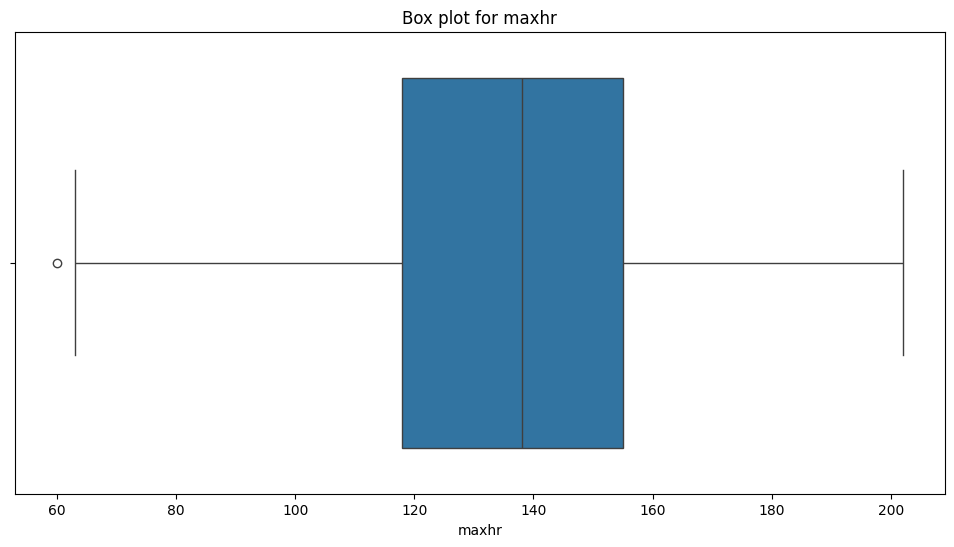

In [453]:
# Print mean and median of the cholestrol and, plot the box plot for the maxhr column
print("Mean of maxhr: ", X_train['maxhr'].mean())
print("Median of maxhr: ", X_train['maxhr'].median())
print_outliers_plot_box_column(X_train_non_zero, 'maxhr')

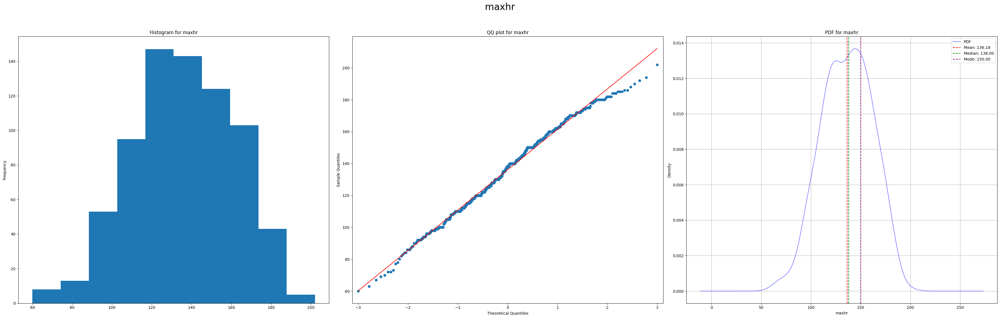

In [454]:
# Plot the distribution of the maxhr column for patients
plot_qq_hist_column(X_train, 'maxhr')

In [455]:
# Get the skewness of the maxhr column
X_train['maxhr'].skew()

np.float64(-0.1648496224515407)

- The maxhr column is almost normally distributed
- It has no missing values or unusual values so it needs no imputation
- It has only 1 outlier in training data so no transformation is needed

#### ii. Fixing Data Skewness

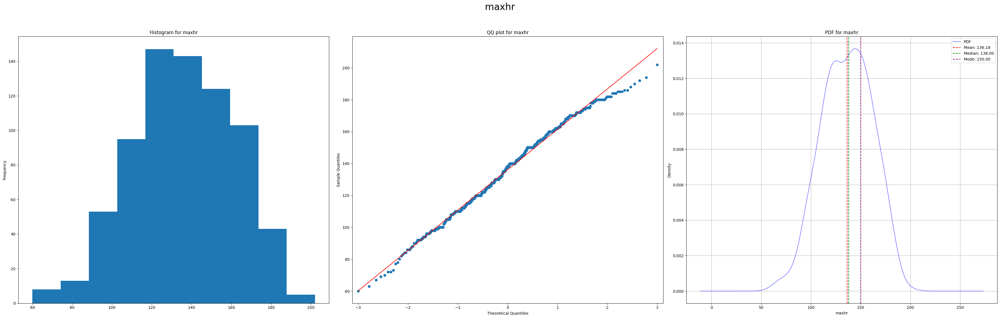

In [456]:
# Plot the distribution of the maxhr column
plot_qq_hist_column(X_train, 'maxhr')

In [457]:
# Get the skewness of the maxhr column
X_train['maxhr'].skew()

np.float64(-0.1648496224515407)

Number of outliers in maxhr: 1


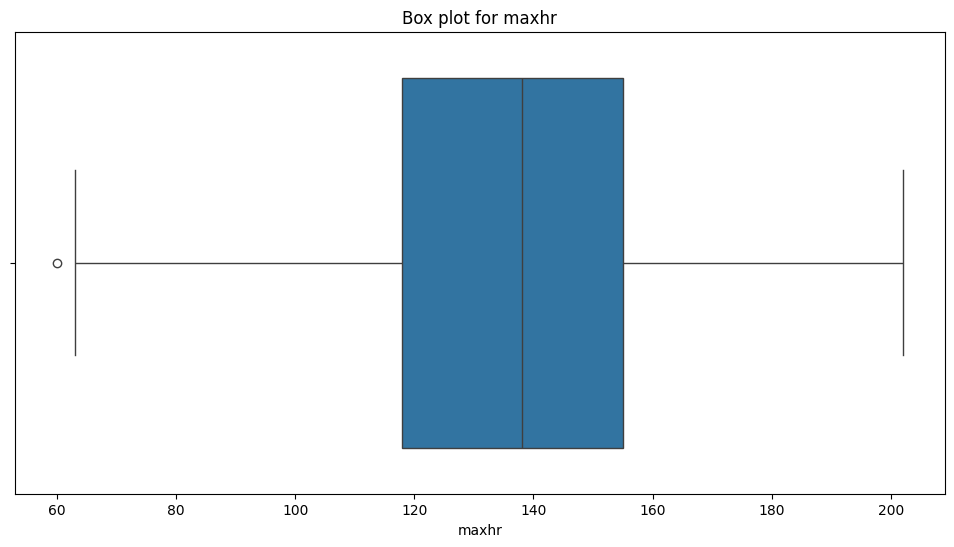

In [458]:
# Plot the box plot for the maxhr column
print_outliers_plot_box_column(X_train, 'maxhr')

To fix the data skewness and distribution we will try the following transformations:
1. `log transformation`
2. `sqrt transformation`
3. `box cox transformation`
4. `reciporical transformation`

##### Log Transformation

In [459]:
# Get the log transformation of the maxhr column
log_maxhr = np.log(X_train['maxhr'])

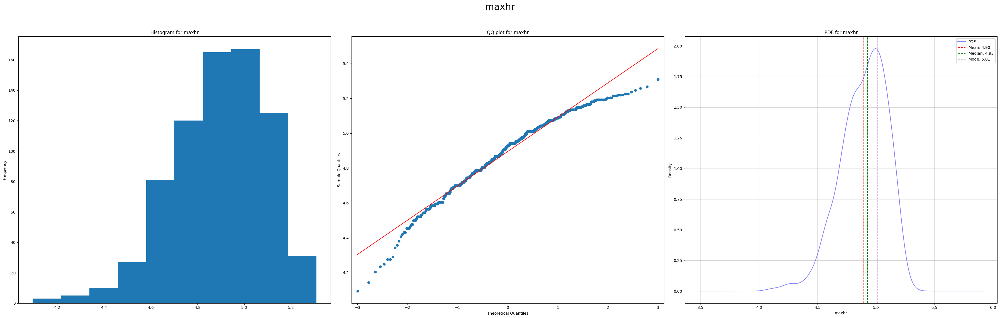

In [460]:
# Plot the distribution of the log transformed maxhr column
plot_qq_hist_column(pd.DataFrame(log_maxhr, columns=['maxhr']), 'maxhr')

In [461]:
# Get the skewness of the log transformed maxhr column
log_maxhr.skew()

np.float64(-0.6893884947243891)

Number of outliers in maxhr: 10


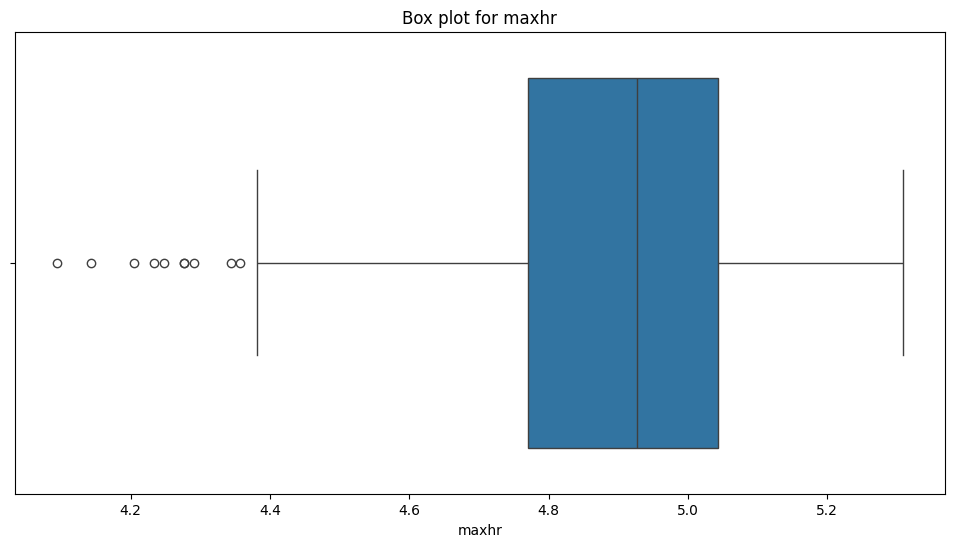

In [462]:
# Plot the box plot for the log transformed maxhr column
print_outliers_plot_box_column(pd.DataFrame(log_maxhr, columns=['maxhr']), 'maxhr')

Notes:
- Log transformation increased the magnitude of the skewness
- It increased the number of outliers to 10

##### Sqrt Transformation

In [463]:
# Get the square root transformation of the maxhr column
sqrt_maxhr = np.sqrt(X_train['maxhr'])

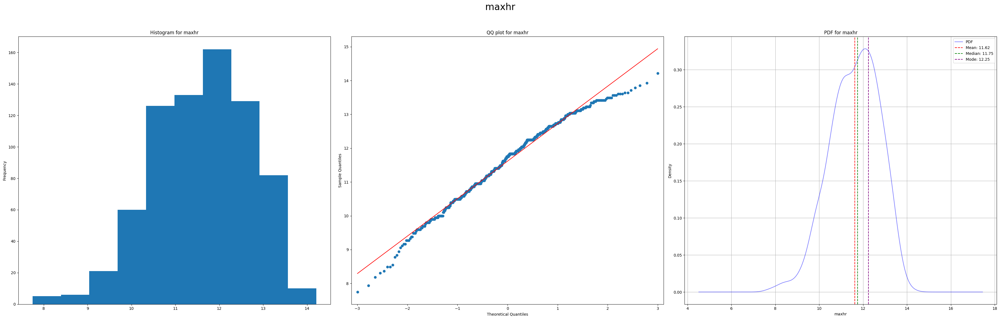

In [464]:
# Plot the distribution of the square root transformed maxhr column
plot_qq_hist_column(pd.DataFrame(sqrt_maxhr, columns=['maxhr']), 'maxhr')

In [465]:
# Get the skewness of the square root transformed maxhr column
sqrt_maxhr.skew()

np.float64(-0.4083868786064201)

Number of outliers in maxhr: 5


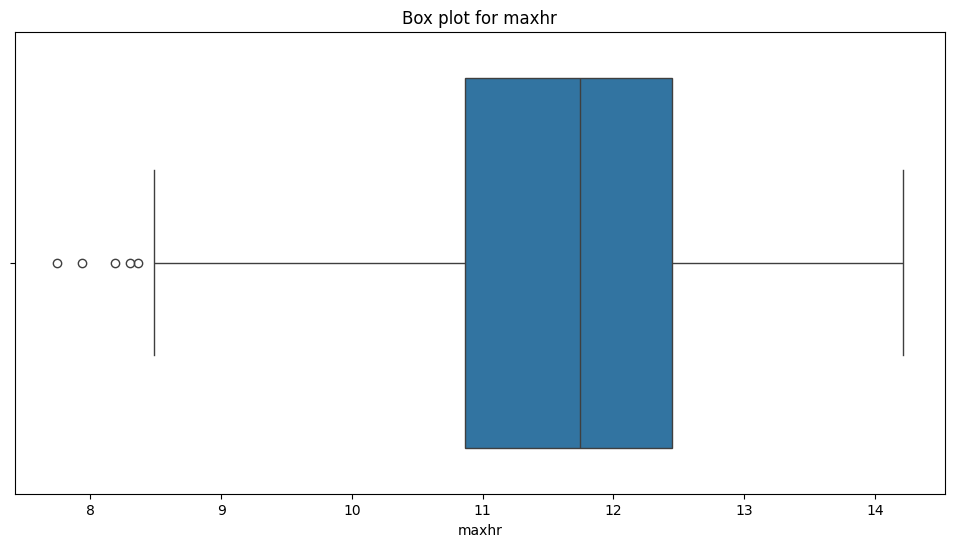

In [466]:
# Plot the box plot for the square root transformed maxhr column
print_outliers_plot_box_column(pd.DataFrame(sqrt_maxhr, columns=['maxhr']), 'maxhr')

Notes:
- The sqrt transformation increased the magnitude of skewness of the data but less than that of the log transformation
- It increased number of outliers to 5 which is less than that of the log transformation

##### Boxcox Transformation

In [467]:
# Get the boxcox transformation of the maxhr column
boxcox_maxhr, lambda_val = boxcox(X_train['maxhr'])

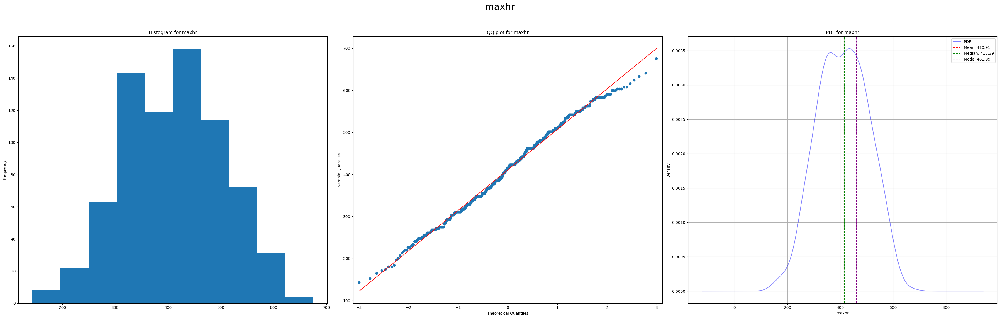

In [468]:
# Plot the distribution of the boxcox transformed maxhr column
plot_qq_hist_column(pd.DataFrame(boxcox_maxhr, columns=['maxhr']), 'maxhr')

In [469]:
# Get the skewness of the boxcox transformed maxhr column
pd.Series(boxcox_maxhr).skew()

np.float64(-0.0436230743966231)

Number of outliers in maxhr: 0


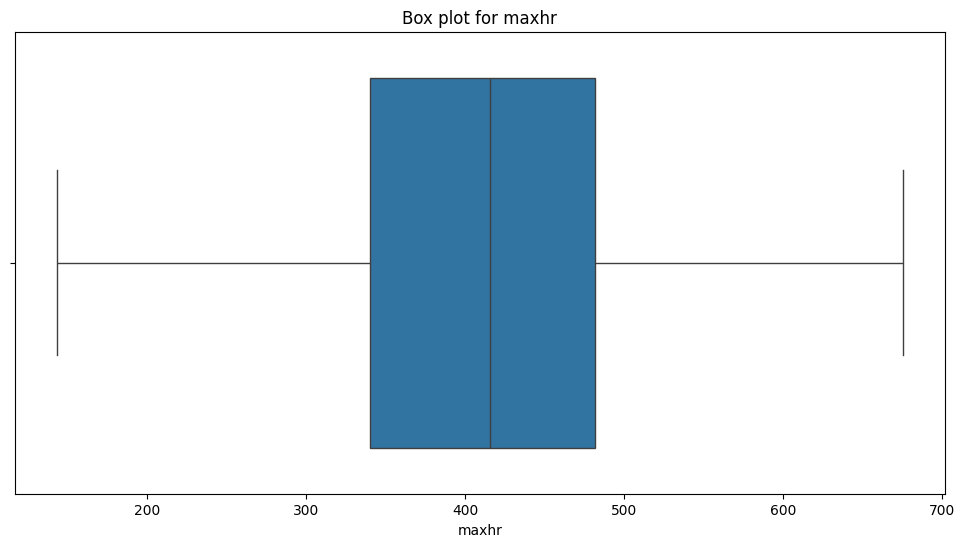

In [470]:
# Plot the box plot for the boxcox transformed maxhr column
print_outliers_plot_box_column(pd.DataFrame(boxcox_maxhr, columns=['maxhr']), 'maxhr')

Notes:
- The boxcox transformations is the only one that decreased the magnitude of the skewness of the data so far.
- Number of outliers decreased to 0

##### Reciporical Transformation

In [471]:
# Get the reciprocal transformation of the maxhr column
reciprocal_maxhr = 1 / X_train['maxhr']

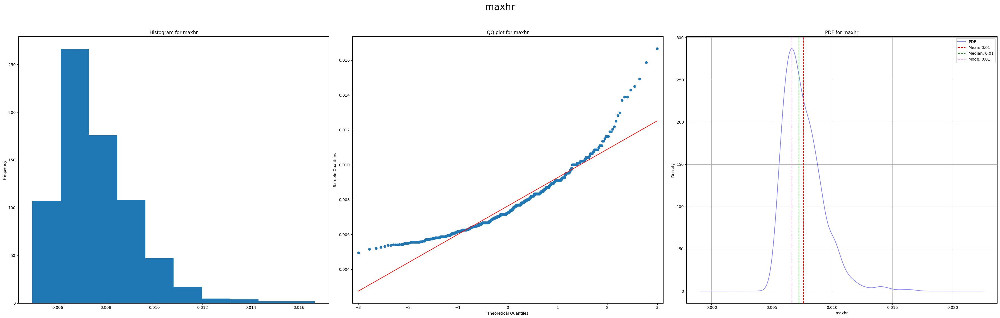

In [472]:
# Plot the distribution of the reciprocal transformed maxhr column
plot_qq_hist_column(pd.DataFrame(reciprocal_maxhr, columns=['maxhr']), 'maxhr')

In [473]:
# Get the skewness of the reciprocal transformed maxhr column
reciprocal_maxhr.skew()

np.float64(1.4241661083114536)

Number of outliers in maxhr: 18


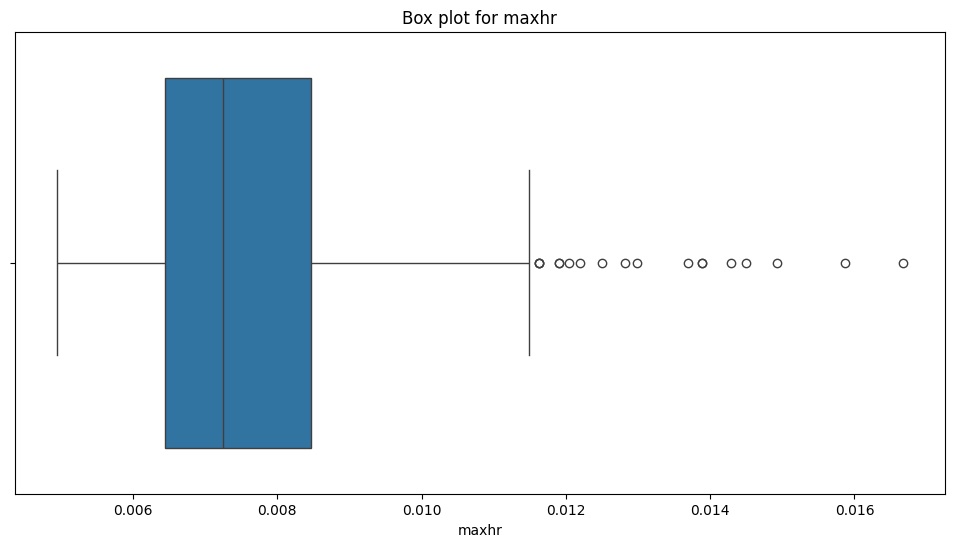

In [474]:
# Plot the box plot for the reciprocal transformed maxhr column
print_outliers_plot_box_column(pd.DataFrame(reciprocal_maxhr, columns=['maxhr']), 'maxhr')

Notes:
- The Recoprical Transformation increased the magnitude of the skewness of the data the most
- It also increased the number of outliers the most to 18

The boxcox transformation will be applied to the age column, this is because it is the one that improves the distribution the most.


In [475]:
# Apply the boxcox transformation to the maxhr column
X_train['maxhr'], lambda_val = boxcox(X_train['maxhr'])
X_test['maxhr'] = boxcox(X_test['maxhr'], lmbda=lambda_val)

##### Removing Outliers
No outliers seen above but check again for completness

In [476]:
# Viewing the percentage of outliers in the maxhr column after boxcox transformation
outliers, lower_bound, upper_bound = calculate_outliers_percentage(X_train['maxhr'])
print(f'Percentage of outliers in maxhr after boxcox transformation: {outliers.shape[0] / X_train.shape[0] * 100:.2f}%')

Percentage of outliers in maxhr after boxcox transformation: 0.00%


#### iii. Normalization

In [477]:
# Get the max, min, and mean of the maxhr column
X_train['maxhr'].max(), X_train['maxhr'].min(), X_train['maxhr'].mean()

(np.float64(675.1773201879504),
 np.float64(143.35516643315881),
 np.float64(410.90687956211616))

In [478]:
# Use min-max scaler to scale the maxhr column
scaler = MinMaxScaler()
X_train['maxhr'] = scaler.fit_transform(X_train[['maxhr']])
X_test['maxhr'] = scaler.transform(X_test[['maxhr']])

# Get the max, min, and mean of the maxhr column after scaling
X_train['maxhr'].max(), X_train['maxhr'].min(), X_train['maxhr'].mean()

(np.float64(1.0), np.float64(0.0), np.float64(0.5030849340140837))

### f. Sex

In [479]:
# Checking the unique values of the categorical columns
X_train['sex'].unique()

array(['M', 'F'], dtype=object)

So we have only 2 unique values for the `sex` column. So we can binary encode them where:
- `F` mapped to 0
- `M` mapped to 1

In [480]:
# Binary encode (Using the labelencoder) the sex column so that 0 represents F and 1 represents M
label_encoder = LabelEncoder()
X_train['sex'] = label_encoder.fit_transform(X_train['sex'])
X_test['sex'] = label_encoder.transform(X_test['sex'])
X_train['sex'].unique(), X_test['sex'].unique()

(array([1, 0]), array([0, 1]))

### g. ChestPaintType

In [481]:
# Checking the unique values of the chestpaintype column
X_train['chestpaintype'].unique(), X_test['chestpaintype'].unique()

(array(['NAP', 'ASY', 'TA', 'ATA'], dtype=object),
 array(['ATA', 'NAP', 'ASY', 'TA'], dtype=object))

The column will be one hot encoded, as they have an order where ASY is the lowest and TA is the largest but the relationship between them are not similar as we can't say the difference between TA and ATA is equal to the difference between ASY and NAP so it will be better to use one hot encoding

In [482]:
# One-hot encode the chestpaintype column
X_train = pd.get_dummies(X_train, columns=['chestpaintype']) 
X_test = pd.get_dummies(X_test, columns=['chestpaintype'])
X_train.columns, X_test.columns

(Index(['age', 'sex', 'restingbp', 'cholesterol', 'fastingbs', 'restingecg',
        'maxhr', 'exerciseangina', 'oldpeak', 'st_slope', 'chestpaintype_ASY',
        'chestpaintype_ATA', 'chestpaintype_NAP', 'chestpaintype_TA'],
       dtype='object'),
 Index(['age', 'sex', 'restingbp', 'cholesterol', 'fastingbs', 'restingecg',
        'maxhr', 'exerciseangina', 'oldpeak', 'st_slope', 'chestpaintype_ASY',
        'chestpaintype_ATA', 'chestpaintype_NAP', 'chestpaintype_TA'],
       dtype='object'))

### h. Fastingbs

In [483]:
# Check the unique values of the fastingbs column
X_train['fastingbs'].unique(), X_test['fastingbs'].unique()

(array([1, 0]), array([0, 1]))

The `fastingbs` is already label encoded.
- A fastingbs of 1 means that the fasting blood sugar is more than 120 mg/dl
- A fastingbs of 0 means that the fasting blood sugar is less than or equal to 120 mg/dl

In [484]:
# Checking the dtype of the fastingbs column
X_train['fastingbs'].dtype, X_test['fastingbs'].dtype

(dtype('int64'), dtype('int64'))

### i. RestingECG

In [485]:
# Checking the unique values of the restingecg column
X_train['restingecg'].unique(), X_test['restingecg'].unique()

(array(['Normal', 'LVH', 'ST'], dtype=object),
 array(['Normal', 'ST', 'LVH'], dtype=object))

We will use one-hot encoding for the **RestingECG** column because its categories (Normal, ST, LVH) don’t have any natural order. Each category represents a different type of ECG result, and one-hot encoding helps us treat them as separate and equal. This avoids any confusion that could happen if we used numbers, like thinking one category is bigger or smaller than another.

In [486]:
# One-hot encode the restingecg column
X_train = pd.get_dummies(X_train, columns=['restingecg'])
X_test = pd.get_dummies(X_test, columns=['restingecg'])
X_train.columns, X_test.columns

(Index(['age', 'sex', 'restingbp', 'cholesterol', 'fastingbs', 'maxhr',
        'exerciseangina', 'oldpeak', 'st_slope', 'chestpaintype_ASY',
        'chestpaintype_ATA', 'chestpaintype_NAP', 'chestpaintype_TA',
        'restingecg_LVH', 'restingecg_Normal', 'restingecg_ST'],
       dtype='object'),
 Index(['age', 'sex', 'restingbp', 'cholesterol', 'fastingbs', 'maxhr',
        'exerciseangina', 'oldpeak', 'st_slope', 'chestpaintype_ASY',
        'chestpaintype_ATA', 'chestpaintype_NAP', 'chestpaintype_TA',
        'restingecg_LVH', 'restingecg_Normal', 'restingecg_ST'],
       dtype='object'))

### j.ExerciseAngina

In [487]:
# Check the unique values of the exerciseangina column
X_train['exerciseangina'].unique(), X_test['exerciseangina'].unique()

(array(['N', 'Y'], dtype=object), array(['N', 'Y'], dtype=object))

We are using label encoding for the **ExerciseAngina** column because it has only two categories (Yes and No), making it a simple binary feature. Label encoding is efficient and allows the model to interpret the data directly without adding unnecessary complexity.

In [488]:
# Binary encode (Using the labelencoder) the exerciseangina column so that 0 represents No and 1 represents Yes
label_encoder = LabelEncoder()
X_train['exerciseangina'] = label_encoder.fit_transform(X_train['exerciseangina'])
X_test['exerciseangina'] = label_encoder.transform(X_test['exerciseangina'])
X_train['exerciseangina'].unique(), X_test['exerciseangina'].unique()

(array([0, 1]), array([0, 1]))

### k. ST_Slope

In [489]:
# Check the unique values of the st_slope column
X_train['st_slope'].unique(), X_test['st_slope'].unique()

(array(['Down', 'Up', 'Flat'], dtype=object),
 array(['Up', 'Flat', 'Down'], dtype=object))

We will use one-hot encoding for the ST_Slope column because, while its categories (Up, Flat, Down) reflect different heart responses to exercise, they should not be treated as strictly ordinal. Each category represents a distinct condition, and one-hot encoding ensures the model treats them as separate without assuming a numeric relationship. This is especially important for linear models, which might misinterpret label encoding as implying a fixed progression between the categories.

In [490]:
# One-hot encode the st_slope column
X_train = pd.get_dummies(X_train, columns=['st_slope'])
X_test = pd.get_dummies(X_test, columns=['st_slope'])
X_train.columns, X_test.columns

(Index(['age', 'sex', 'restingbp', 'cholesterol', 'fastingbs', 'maxhr',
        'exerciseangina', 'oldpeak', 'chestpaintype_ASY', 'chestpaintype_ATA',
        'chestpaintype_NAP', 'chestpaintype_TA', 'restingecg_LVH',
        'restingecg_Normal', 'restingecg_ST', 'st_slope_Down', 'st_slope_Flat',
        'st_slope_Up'],
       dtype='object'),
 Index(['age', 'sex', 'restingbp', 'cholesterol', 'fastingbs', 'maxhr',
        'exerciseangina', 'oldpeak', 'chestpaintype_ASY', 'chestpaintype_ATA',
        'chestpaintype_NAP', 'chestpaintype_TA', 'restingecg_LVH',
        'restingecg_Normal', 'restingecg_ST', 'st_slope_Down', 'st_slope_Flat',
        'st_slope_Up'],
       dtype='object'))

In [491]:
# Check the X_train after cleaning
X_train.head()

,age,sex,restingbp,cholesterol,fastingbs,maxhr,exerciseangina,oldpeak,chestpaintype_ASY,chestpaintype_ATA,chestpaintype_NAP,chestpaintype_TA,restingecg_LVH,restingecg_Normal,restingecg_ST,st_slope_Down,st_slope_Flat,st_slope_Up
795,0.238698,1,0.371976,0.495478,1,0.936269,0,0.483871,False,False,True,False,False,True,False,True,False,False
25,0.124919,1,0.507629,0.335345,0,0.810969,0,1.000000,False,False,True,False,False,True,False,False,False,True
84,0.524927,1,0.735349,0.357236,1,0.418900,1,0.419355,True,False,False,False,False,True,False,False,True,False
10,0.143474,0,0.507629,0.346340,0,0.540497,0,1.000000,False,False,True,False,False,True,False,False,False,True
344,0.419605,1,0.371976,0.480872,1,0.274879,0,1.000000,True,False,False,False,False,True,False,False,True,False


In [492]:
# Checking the shape of the X_train and X_test
X_train.shape, X_test.shape

((734, 18), (184, 18))

So after doing the data cleaning and processing we have 18 columns, which we will try and extract and select the different features from the data

## 4. Feature Extraction and Selection

Text(0.5, 1.0, 'Correlation Matrix')

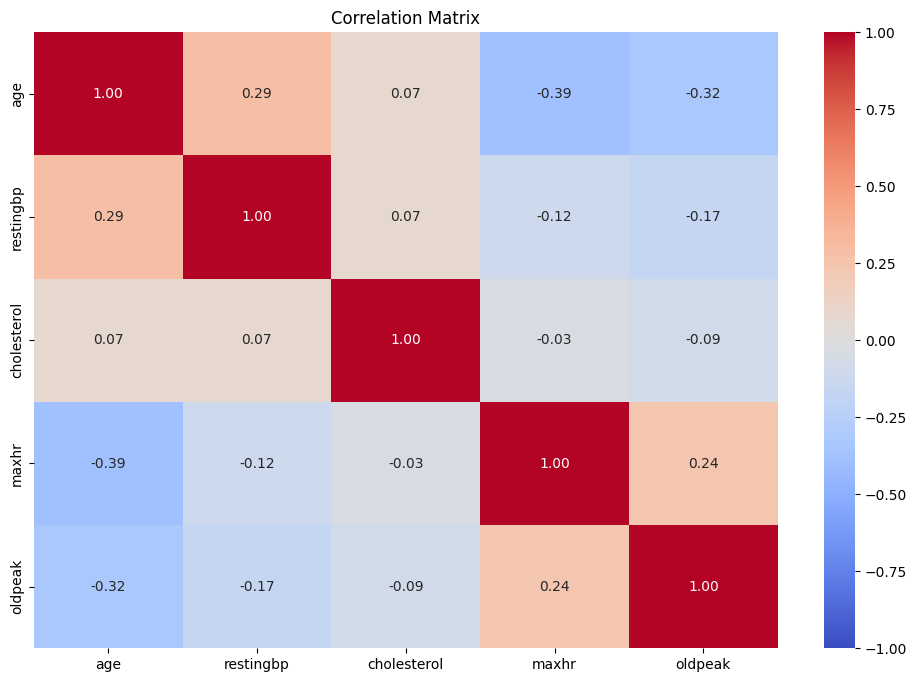

In [493]:
# Plotting the correlation matrix
plt.figure(figsize=(12, 8))

cols = [col for col in X_train.columns if 'chestpaintype' not in col and 'restingecg' not in col and 'st_slope' not in col and 'sex' not in col and 'exerciseangina' not in col and 'fastingbs' not in col]

# Compute the correlation matrix
corr = X_train[cols].corr(numeric_only=True)
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', center=0, vmin=-1, vmax=1)
plt.title("Correlation Matrix")

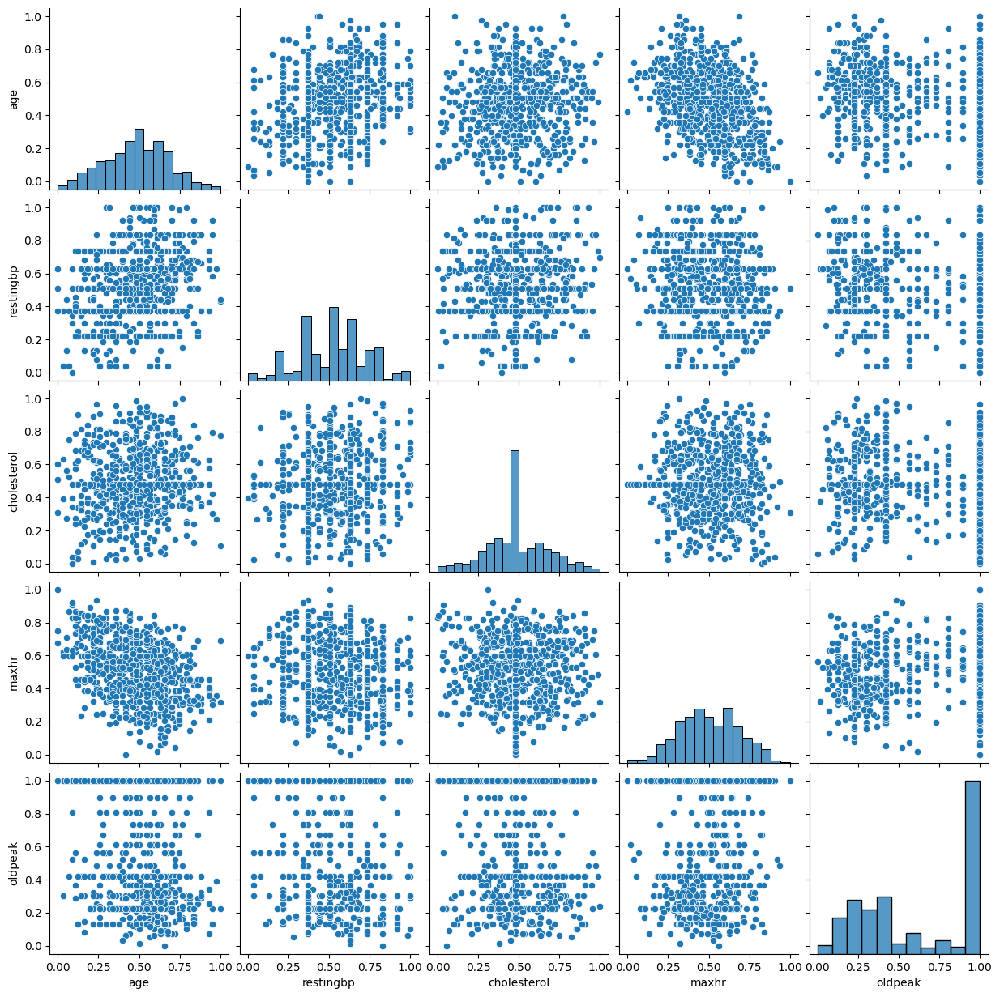

In [494]:
# Showing a pairplot of the features
sns.pairplot(X_train[cols])
plt.show()

From the previous 2 plots we can notice:
- No high correlation between any two features, as the max magnitude of correlation as seen from the correlation matrix is 0.39
- No pattern is visisble in the pair plot between the different features.

### Feature Selection

#### Dropping one of the columns for the onehot-encoded columns
We remove one column after one-hot encoding to avoid multicollinearity, where the columns are linearly dependent. This ensures the model remains stable and interpretable, with the dropped column acting as the reference category.

In [495]:
df['chestpaintype'].value_counts()

chestpaintype
ASY    496
NAP    203
ATA    173
TA      46
Name: count, dtype: int64

In [496]:
# Removing one of the columns from the chestpaintype columns (chestpaintype_TA)
X_train = X_train.drop('chestpaintype_TA', axis=1)
X_test = X_test.drop('chestpaintype_TA', axis=1)
X_train.shape, X_test.shape

((734, 17), (184, 17))

In [497]:
# Removing one of the columns from the restingecg columns (restingecg_ST)
X_train = X_train.drop('restingecg_ST', axis=1)
X_test = X_test.drop('restingecg_ST', axis=1)
X_train.shape, X_test.shape

((734, 16), (184, 16))

In [498]:
# Remove one of the columns from the st_slope columns (st_slope_Down)
X_train = X_train.drop('st_slope_Down', axis=1)
X_test = X_test.drop('st_slope_Down', axis=1)
X_train.shape, X_test.shape

((734, 15), (184, 15))

After researching online, we found researchers and practitioners (like the ones we found [here](https://www.ijert.org/a-study-on-heart-disease-prediction-using-different-classification-models-based-on-cross-validation-method)) use all features in the dataset to predict whether the person has heart disease or not. 

However, we tried feature selection algorithms like `forward selection` for each model type to see which features could result in better performance. This could be found in the [5. Model Training & Evaluation](#training) section

### Feature Extraction

In [499]:
# Do the PCA on the X_train data to have 2 components
pca = PCA(n_components=2, random_state=42)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [591]:
# Get the explained variance ratio for the first two components
variance_ratios = pca.explained_variance_ratio_

# Calculate the total variance explained by these components
total_variance_explained = variance_ratios.sum()

print("Explained variance ratio for each component:", variance_ratios)
print(f"Total variance explained by the first two components: "+str(np.round(total_variance_explained * 100,1)) + '%')

Explained variance ratio for each component: [0.31500286 0.14158522]
Total variance explained by the first two components: 45.7%


### KMeans

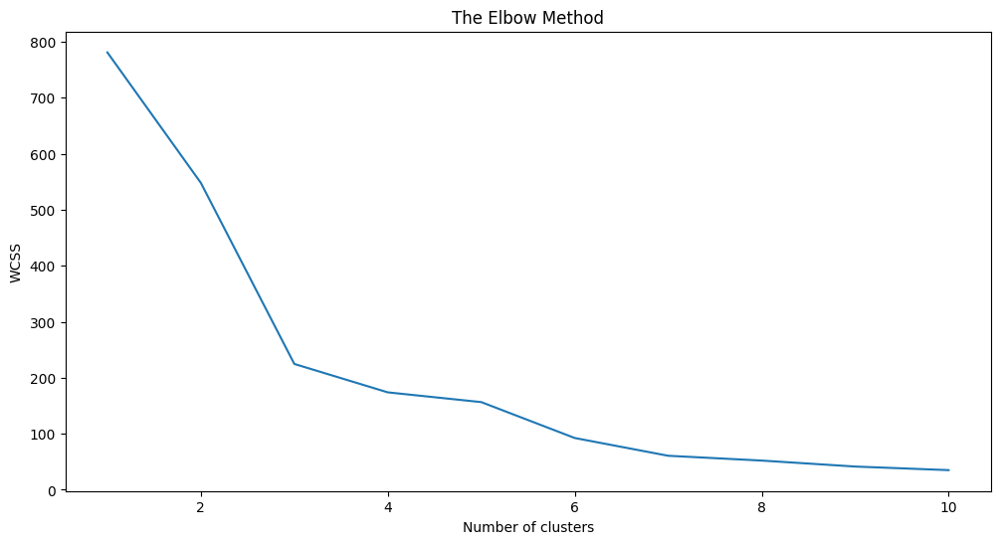

In [501]:
# Using the elbow method to find the optimal number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_train_pca)
    wcss.append(kmeans.inertia_)

# Plot the elbow method graph
plt.figure(figsize=(12, 6))
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Using the elbow method, we can say that the rate of decrease in the WCSS decreases significantly after the 3 cluster so we will use only 3 clusters for our data.

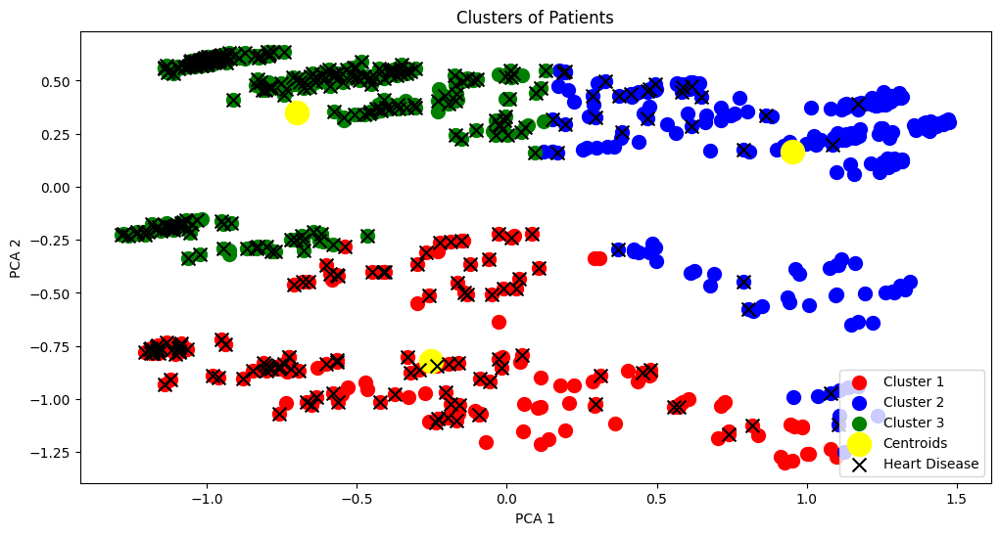

In [502]:
# Visualizing the clusters for KMenas clustering (3 clusters)
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
y_kmeans = kmeans.fit_predict(X_train_pca)


plt.figure(figsize=(12, 6))
plt.scatter(X_train_pca[y_kmeans == 0, 0], X_train_pca[y_kmeans == 0, 1], s=100, c='red', label='Cluster 1')
plt.scatter(X_train_pca[y_kmeans == 1, 0], X_train_pca[y_kmeans == 1, 1], s=100, c='blue', label='Cluster 2')
plt.scatter(X_train_pca[y_kmeans == 2, 0], X_train_pca[y_kmeans == 2, 1], s=100, c='green', label='Cluster 3')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label='Centroids')

# Mark the points where y_train == 1 with a cross
plt.scatter(X_train_pca[y_train == 1, 0], X_train_pca[y_train == 1, 1], s=100, c='black', marker='x', label='Heart Disease')

plt.title('Clusters of Patients')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend()
plt.show()


After using PCA with 3 clusters, we can see the following:
- The first cluster `Green Cluster` is dominated with people having a heart deseases (y_train = 1)
- The second cluster `Red Cluster` has a lot of people having a heart disease but also have a fair amount of people who don't have one
- The third cluster `Blue Cluster`is dominated with people who don't have a heart disease (y_train = 0)

### Hierarchical Clustering

We have 4 different linkage types for AgglomerativeClustering, which are:
- ward
- complete
- average
- single

We will try each one and compare their results to choose the optimal one

1. Ward:

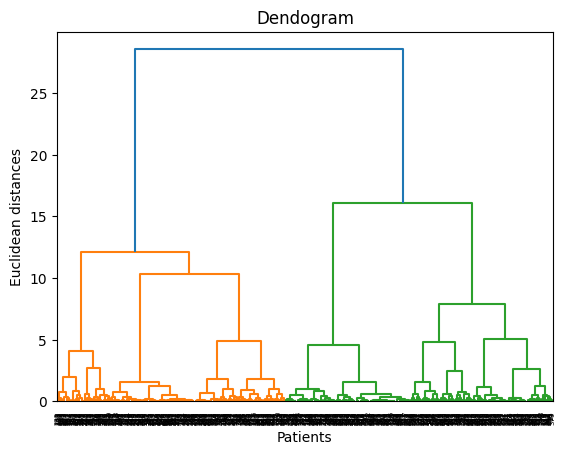

In [503]:
# Using the dendogram to find the optimal number of clusters
linkage_mat = linkage(X_train_pca, method='ward')
dendogram = dendrogram(linkage_mat)
plt.title('Dendogram')
plt.xlabel('Patients')
plt.ylabel('Euclidean distances')
plt.show()

As seen in the dendogram, the optimal number of clusters is 3, since when you prune the longest vertical distance you will have 3 clusters remaining hence why n=3.

In [504]:
# Fitting hierarchical clustering to the X_train data
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=3, linkage='ward')
y_hc = hc.fit_predict(X_train_pca)

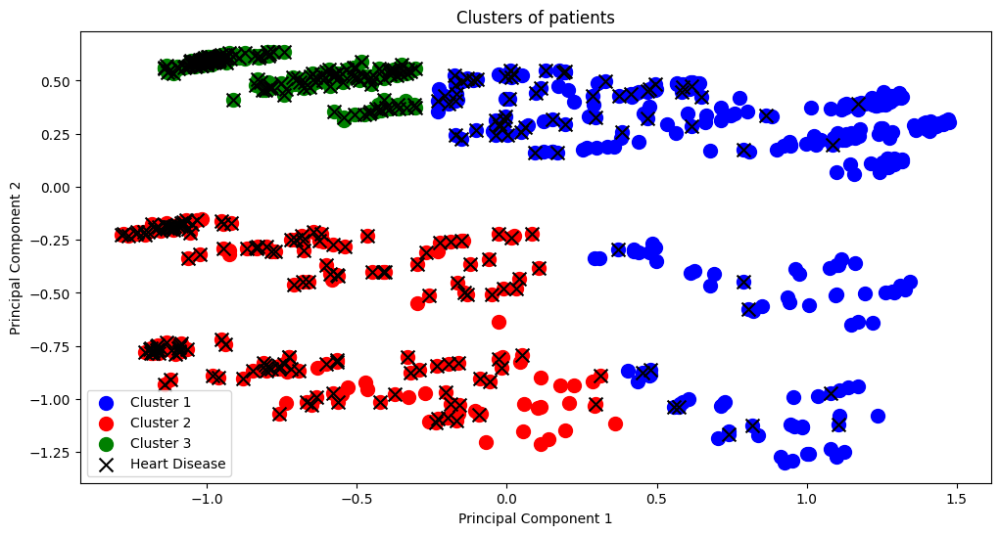

In [505]:
# Visualizing the clusters for Hierarchical clustering, 3 clusters
plt.figure(figsize=(12, 6))
plt.scatter(X_train_pca[y_hc == 0, 0], X_train_pca[y_hc == 0, 1], s = 100, c = 'blue', label = 'Cluster 1')
plt.scatter(X_train_pca[y_hc == 1, 0], X_train_pca[y_hc == 1, 1], s = 100, c = 'red', label = 'Cluster 2')
plt.scatter(X_train_pca[y_hc == 2, 0], X_train_pca[y_hc == 2, 1], s = 100, c = 'green', label = 'Cluster 3')

# Mark the points where y_train == 1 with a cross
plt.scatter(X_train_pca[y_train == 1, 0], X_train_pca[y_train == 1, 1], s=100, c='black', marker='x', label='Heart Disease')

plt.title('Clusters of patients')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

It can be noticed that the hierarchical clustering based on ward linkage had a similar result to KMeans for 3 clusters. Some points are assigned to different clusters but a similar idea that 
- The `Green Cluster` is dominated with heart disease patients
- The `Red Cluster` has a lot of heart disease patients but more health patientes compared to the `Green Cluster`
- The `Blue Cluster` is dominated by healthy patients

In [506]:
print(silhouette_score(X_train_pca, y_hc))

0.4727129339672391


Now we will repeat the training process for the different types using n = 3 for consistenty.

2. Complete

In [507]:
# Fitting hierarchical clustering to the X_train data
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=3, linkage='complete')
y_hc = hc.fit_predict(X_train_pca)

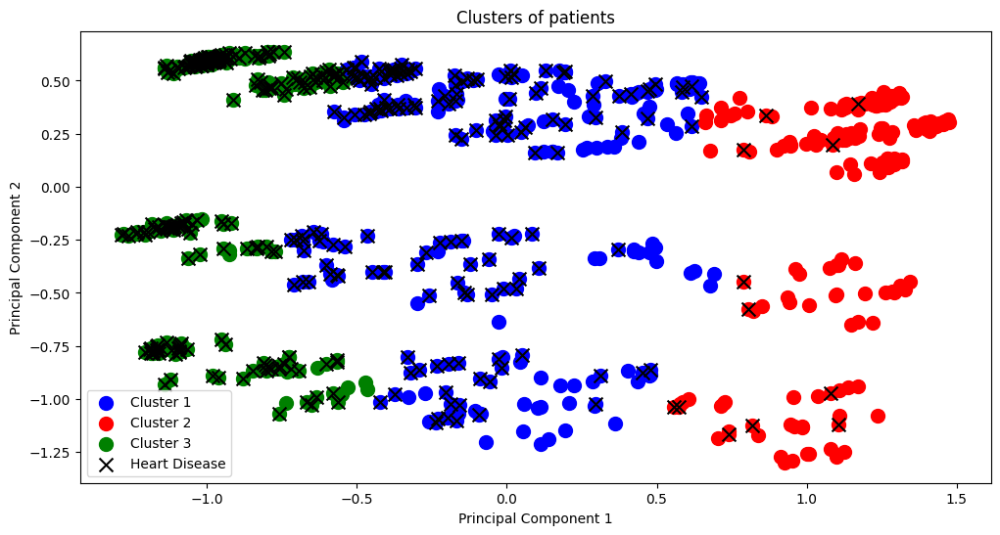

In [508]:
# Visualizing the clusters for Hierarchical clustering, 3 clusters
plt.figure(figsize=(12, 6))
plt.scatter(X_train_pca[y_hc == 0, 0], X_train_pca[y_hc == 0, 1], s = 100, c = 'blue', label = 'Cluster 1')
plt.scatter(X_train_pca[y_hc == 1, 0], X_train_pca[y_hc == 1, 1], s = 100, c = 'red', label = 'Cluster 2')
plt.scatter(X_train_pca[y_hc == 2, 0], X_train_pca[y_hc == 2, 1], s = 100, c = 'green', label = 'Cluster 3')

# Mark the points where y_train == 1 with a cross
plt.scatter(X_train_pca[y_train == 1, 0], X_train_pca[y_train == 1, 1], s=100, c='black', marker='x', label='Heart Disease')

plt.title('Clusters of patients')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

Some points are assigned to different clusters when compared to ward linkage but a similar idea that:
- The `Green Cluster` is dominated with heart disease patients

With the difference that:
- The `Blue Cluster` has a lot of heart disease patients but more health patientes compared to the `Green Cluster`
- The `Red Cluster` is dominated by healthy patients

In [509]:
print(silhouette_score(X_train_pca, y_hc))

0.33554772453918197


3. Average

In [510]:
# Fitting hierarchical clustering to the X_train data
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=3, linkage='average')
y_hc = hc.fit_predict(X_train_pca)

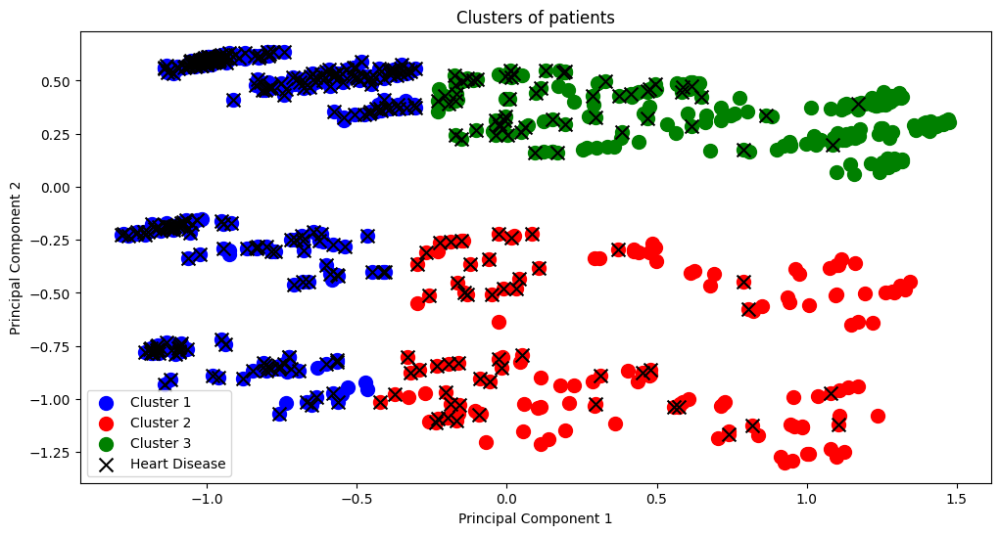

In [511]:
# Visualizing the clusters for Hierarchical clustering, 3 clusters
plt.figure(figsize=(12, 6))
plt.scatter(X_train_pca[y_hc == 0, 0], X_train_pca[y_hc == 0, 1], s = 100, c = 'blue', label = 'Cluster 1')
plt.scatter(X_train_pca[y_hc == 1, 0], X_train_pca[y_hc == 1, 1], s = 100, c = 'red', label = 'Cluster 2')
plt.scatter(X_train_pca[y_hc == 2, 0], X_train_pca[y_hc == 2, 1], s = 100, c = 'green', label = 'Cluster 3')

# Mark the points where y_train == 1 with a cross
plt.scatter(X_train_pca[y_train == 1, 0], X_train_pca[y_train == 1, 1], s=100, c='black', marker='x', label='Heart Disease')

plt.title('Clusters of patients')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

The point distribtution is different to both ward and complete, as follows:
- The `Blue Cluster` is dominated with heart disease patients

While:
- The `Green Cluster` has a lot of heart disease patients but more health patientes compared to the `Blue Cluster`
- The `Red Cluster` has more healthy patients than diseased

In [512]:
print(silhouette_score(X_train_pca, y_hc))

0.4573718243196897


4. Single

In [513]:
# Fitting hierarchical clustering to the X_train data
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=3, linkage='single')
y_hc = hc.fit_predict(X_train_pca)

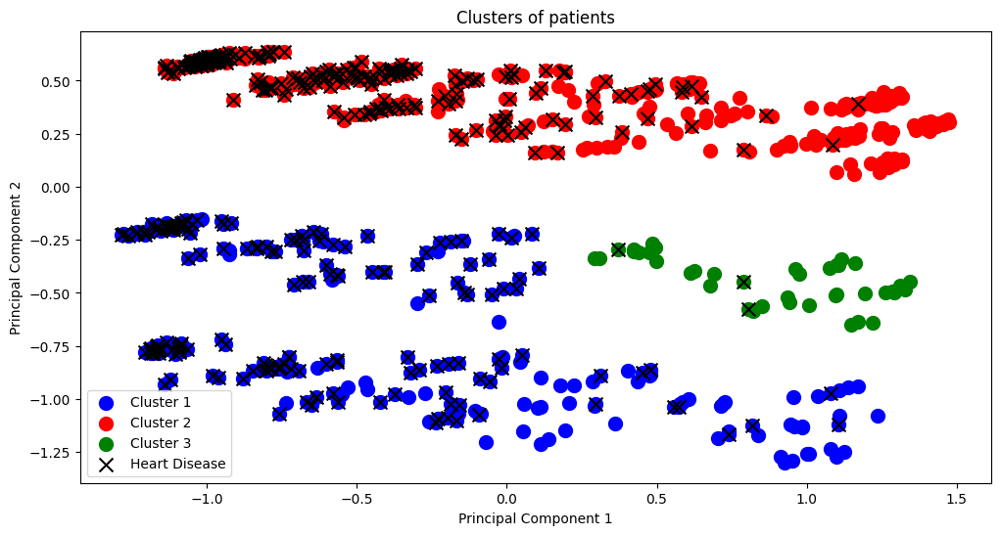

In [514]:
# Visualizing the clusters for Hierarchical clustering, 3 clusters
plt.figure(figsize=(12, 6))
plt.scatter(X_train_pca[y_hc == 0, 0], X_train_pca[y_hc == 0, 1], s = 100, c = 'blue', label = 'Cluster 1')
plt.scatter(X_train_pca[y_hc == 1, 0], X_train_pca[y_hc == 1, 1], s = 100, c = 'red', label = 'Cluster 2')
plt.scatter(X_train_pca[y_hc == 2, 0], X_train_pca[y_hc == 2, 1], s = 100, c = 'green', label = 'Cluster 3')

# Mark the points where y_train == 1 with a cross
plt.scatter(X_train_pca[y_train == 1, 0], X_train_pca[y_train == 1, 1], s=100, c='black', marker='x', label='Heart Disease')

plt.title('Clusters of patients')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

Some points are assigned to different clusters when compared to ward linkage but a similar idea that:
- The `Red Cluster` is dominated with heart disease patients

While the other two clusters:
- The `Blue Cluster` has a lot of heart disease patients but more health patientes compared to the `Red Cluster`
- The `Green Cluster` is dominated by healthy patients

In [515]:
print(silhouette_score(X_train_pca, y_hc))

0.17296653903902567


The ward linkage type produced the highest silhouette score, and the most rational visualization out of the linkage types tested.

<a id="training"></a>
## 5. Model Training & Evaluation




In this section, we will train different models: 
  - **Logisitic Regression**
  - **Decision Tree Classifier**
  - **Random Forest Classifier**
  - **Support Vector Classifier**
  - **XGBoost Classifier**
  
and we will evaluate mainly on the following metrics:
  - **Accuracy**
  - **Precision**
  - **Recall**
  - **F1-Score**
  - **AUC**
  
but we will mainly focus on `test recall` and `test f1` to choose our best models because of the following:
  -  `recall` is crucial for heart failure prediction because it minimizes `false negatives`, ensuring that high-risk patients are not overlooked. Missing a sick patient (`false negative`) can lead to life-threatening consequences, whereas falsely predicting illness (`false positive`) only results in additional testing or monitoring. Prioritizing recall aligns with the principle of "better safe than sorry" making it a vital metric in medical applications.
  
 - The `F1 score` is important because it balances `precision` and `recall`, ensuring the model effectively handles both `false positives` and `false negatives`. This balance is crucial in heart failure prediction to identify true high-risk patients while minimizing unnecessary false alarms, especially in imbalanced datasets.

### Helper Functions

#### 1. Evaluate Model Function
Helps in avoiding the redundant steps in training and evaluating the different models

In [516]:

# Evaluate model function
def evaluate_model(model: Union[LogisticRegression, RandomForestClassifier, DecisionTreeClassifier, SVC, XGBClassifier],
                   X_test: Union[pd.DataFrame, np.ndarray],
                   y_test: Union[pd.DataFrame, np.ndarray],
                   X_train: Union[pd.DataFrame, np.ndarray],
                   y_train: Union[pd.DataFrame, np.ndarray]) -> Dict[str, Union[float, str]]:
    """
    The `evaluate_model` function takes a trained model along with training and test datasets as inputs,
    and provides a comprehensive evaluation of the model's performance. Specifically, it:
        1. Predicts labels and prediction probabilities (or decision function scores for SVC)
           on both the training and test sets.
        2. Generates confusion matrices for both sets to visualize correct and incorrect predictions.
        3. Prints classification reports to display precision, recall, f1-score, and support for
           each class on both the training and test sets.
        4. Computes and prints the ROC AUC scores, indicating the model's discriminative ability.
        5. Plots the ROC curves for both training and testing data to visually assess the
           trade-off between the true positive rate and false positive rate across different thresholds.

    Args:
        model (ClassifierType):
            A trained machine learning model that implements `predict`, `predict_proba`
            (or `decision_function` if SVC), and is compatible with sklearn's evaluation metrics.
        X_test (array-like or pandas.DataFrame):
            The feature data used for testing the model. Should be of the same structure as the training features.
        y_test (array-like or pandas.Series):
            The true labels corresponding to the X_test data.
        X_train (array-like or pandas.DataFrame):
            The feature data the model was trained on, used here for evaluation on the training set.
        y_train (array-like or pandas.Series):
            The true labels corresponding to the X_train data.

    Returns:
       Dict[str, Union[float, str]]:
            A dictionary containing various evaluation metrics and intermediate results:
            - model_name: The name of the model class
            - confusion_matrix_train: Training confusion matrix
            - confusion_matrix_test: Testing confusion matrix
            - classification_report_train: Training classification report (as a dict)
            - classification_report_test: Testing classification report (as a dict)
            - roc_auc_train: Training ROC AUC score
            - roc_auc_test: Testing ROC AUC score
    """
    model_name = model.__class__.__name__
    print(f"Evaluating {model_name}")

    # Predictions and probabilities
    if model_name == 'SVC':
        y_pred_test = model.predict(X_test)
        y_pred_proba_test = model.decision_function(X_test)
        y_pred_train = model.predict(X_train)
        y_pred_proba_train = model.decision_function(X_train)
    else:
        y_pred_test = model.predict(X_test)
        y_pred_proba_test = model.predict_proba(X_test)[:, 1]
        y_pred_train = model.predict(X_train)
        y_pred_proba_train = model.predict_proba(X_train)[:, 1]

    # Confusion Matrices
    cm_train = confusion_matrix(y_train, y_pred_train)
    cm_test = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Training Confusion Matrix for {model_name}')

    plt.subplot(1, 2, 2)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(f'Testing Confusion Matrix for {model_name}')

    plt.show()

    # Classification Reports
    cr_train = classification_report(y_train, y_pred_train, output_dict=True)
    cr_test = classification_report(y_test, y_pred_test, output_dict=True)
    print(f"Training Classification Report: \n{classification_report(y_train, y_pred_train)}")
    print(f"Testing Classification Report: \n{classification_report(y_test, y_pred_test)}")

    # ROC AUC Scores
    roc_auc_train = roc_auc_score(y_train, y_pred_proba_train)
    roc_auc_test = roc_auc_score(y_test, y_pred_proba_test)
    print(f"Training ROC AUC Score: {roc_auc_train}")
    print(f"Testing ROC AUC Score: {roc_auc_test}")

    # ROC Curves
    fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_proba_train)
    fpr_test, tpr_test, _ = roc_curve(y_test, y_pred_proba_test)
    plt.figure(figsize=(10, 6))
    plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Training ROC curve (area = %0.2f)' % roc_auc_train)
    plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label='Testing ROC curve (area = %0.2f)' % roc_auc_test)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

    # Return metrics in a dictionary form
    results = {
        'model_name': model_name,
        'confusion_matrix_train': cm_train,
        'confusion_matrix_test': cm_test,
        'classification_report_train': cr_train,
        'classification_report_test': cr_test,
        'roc_auc_train': roc_auc_train,
        'roc_auc_test': roc_auc_test,
    }

    return results


#### 2. Expand Results
Returns the metrics of the models in the form of a dataframe

In [517]:
def expand_results(results_dict: Dict[str, Union[float, int, list, dict]], model_name:str) -> pd.DataFrame:
    """
    Expand the evaluation results returned by the evaluate_model function into a flattened DataFrame.

    This function assumes that the input is a dictionary with the following keys:
        - 'model_name'
        - 'confusion_matrix_train' (2x2 nested list)
        - 'confusion_matrix_test' (2x2 nested list)
        - 'classification_report_train' (nested dict from classification_report with output_dict=True)
        - 'classification_report_test'
        - 'roc_auc_train'
        - 'roc_auc_test'

    The function:
        - Converts the dictionary into a DataFrame.
        - Splits confusion matrices into separate TN, FP, FN, TP columns.
        - Normalizes (flattens) the classification reports into multiple columns.

    Args:
        results_dict (Dict[str, Union[float, int, list, dict]]): a dictionary represents the results from a model evaluation.

    Returns:
        pd.DataFrame: A DataFrame with flattened metrics, suitable for comparing multiple models.
    """
    # Convert the list of results into a DataFrame
    df = pd.DataFrame([results_dict])

    # Expand the confusion_matrix columns into separate columns
    df[['tn_train', 'fp_train', 'fn_train', 'tp_train']] = df['confusion_matrix_train'].apply(
        lambda cm: pd.Series([cm[0][0], cm[0][1], cm[1][0], cm[1][1]]))

    df[['tn_test', 'fp_test', 'fn_test', 'tp_test']] = df['confusion_matrix_test'].apply(
        lambda cm: pd.Series([cm[0][0], cm[0][1], cm[1][0], cm[1][1]]))

    # Drop original confusion matrix columns if no longer needed
    df.drop(columns=['confusion_matrix_train', 'confusion_matrix_test'], inplace=True)

    # Flatten the classification reports
    train_cr = pd.json_normalize(df['classification_report_train'])
    test_cr = pd.json_normalize(df['classification_report_test'])

    # Merge these expanded classification reports back into the main DataFrame
    df = pd.concat([df, train_cr.add_prefix('train_'), test_cr.add_prefix('test_')], axis=1)

    # Drop original classification report columns if no longer needed
    df.drop(columns=['classification_report_train', 'classification_report_test'], inplace=True)

    df['model_name'] = model_name
    result = df[['model_name', 'roc_auc_train', 'train_accuracy', 'train_1.precision','train_1.recall', 'train_1.f1-score', 'roc_auc_test', 'test_accuracy', 'test_1.precision', 'test_1.recall','test_1.f1-score']]
    result.columns = ['Model Name', 'ROC AUC Train', 'Accuracy Train', 'Precision Train', 'Recall Train', 'F1 Train', 'ROC AUC Test', 'Accuracy Test', 'Precision Test', 'Recall Test', 'F1 Test']
    return result


#### 3. Train & Evaluate Function
Trains the model on the given data and evaluate using the `evaluate_model` function

In [518]:
def apply_pca(X_train: np.ndarray, X_test: np.ndarray, n_components: int) -> np.ndarray:
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)
    return X_train_pca, X_test_pca

def train_and_evaluate(
        model: Union[LogisticRegression, RandomForestClassifier, DecisionTreeClassifier, SVC, XGBClassifier],
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        should_apply_pca: bool=False,
        n_components: int=2,
        model_name: str = None
    ) -> pd.DataFrame:
    """
    The `train_and_evaluate` function handles the entire workflow of optionally applying PCA for dimensionality
    reduction, training a given model on a provided training dataset, and then evaluating the model on a test
    dataset. It leverages the `evaluate_model` function to produce performance metrics and visualizations.

    Steps Performed:
    1. **Optional PCA Application:**
       If `should_apply_pca` is True, the function will apply Principal Component Analysis (PCA) to both the
       training and test feature sets, reducing them to `n_components` principal components. This can help
       with dimensionality reduction, noise reduction, and potentially improve the model's performance and
       interpretability.

    2. **Model Training:**
       The provided `model` is fitted using the transformed (or original) training data, learning the
       underlying patterns from the feature set (`X_train`) and target labels (`y_train`).

    3. **Model Evaluation:**
       After training, the `evaluate_model` function is called to:
       - Generate predictions and probabilities on both the training and test sets.
       - Plot confusion matrices to visualize correct and incorrect classifications.
       - Print classification reports (precision, recall, f1-score, and support).
       - Compute and display ROC AUC scores.
       - Plot ROC curves to assess the trade-off between true positive and false positive rates.

    Args:
        model (ClassifierType):
            A scikit-learn compatible model instance that supports `fit`, `predict`, and `predict_proba` (or
            `decision_function` in the case of SVC). Examples include LogisticRegression, RandomForestClassifier,
            or SVC.
        X_train (pd.DataFrame):
            The training features. Each column represents a feature, and each row represents a data sample.
        y_train (pd.Series):
            The training labels or target values corresponding to the samples in `X_train`.
        X_test (pd.DataFrame):
            The test features, used for out-of-sample evaluation. Should be in the same format and structure
            as `X_train`.
        y_test (pd.Series):
            The test labels or target values corresponding to the samples in `X_test`.
        should_apply_pca (bool, optional):
            Indicates whether PCA should be applied to the feature sets. Defaults to `False`.
        n_components (int, optional):
            The number of principal components to retain if PCA is applied. Defaults to `2`.
    Returns:
        pd.DataFrame:
            A dataframe containing various evaluation metrics and intermediate results for the model.

    Notes:
        - Before calling this function, ensure the data is properly cleaned and that all columns in
          `X_train` and `X_test` are numeric if PCA is applied.
        - The model should be an instance of a fitted (or at least instantiable) estimator from scikit-learn
          or a compatible library.
    """
    if should_apply_pca:
        print(f"Applied pca with {n_components} components")
        X_train, X_test = apply_pca(X_train=X_train, X_test=X_test, n_components=n_components)

    model.fit(X_train, y_train)
    results = evaluate_model(model, X_test=X_test, y_test=y_test, X_train=X_train, y_train=y_train)
    curr_results_df = expand_results(results, model_name=model_name)
    return curr_results_df

#### 4. Grid Search & Evaluate
Perform grid search to get the best hyperparameters for each model

In [519]:
from sklearn.base import clone

def grid_search_and_evaluate(
    model: Union[LogisticRegression, RandomForestClassifier, DecisionTreeClassifier, SVC, XGBClassifier],
    param_grid: Dict[str, List[Union[float, int, str]]],
    X_train: pd.DataFrame,
    y_train: pd.DataFrame,
    X_test: pd.DataFrame,
    y_test: pd.DataFrame,
    should_apply_pca: bool=False,
    n_components: int=2,
    scoring: str='accuracy',
    cv: int=5,
    n_jobs: int=-1,
    refit: bool=True,
    model_name: str = None
) -> pd.DataFrame:
    """
    The `grid_search_and_evaluate` function performs a grid search for hyperparameter tuning on a given model and
    parameter grid, optionally applies PCA for dimensionality reduction, trains the best found model, and evaluates
    it on the test set. It uses the `evaluate_model` and `expand_results` functions to produce and store
    comprehensive performance metrics.

    Steps Performed:
    1. **Optional PCA Application:**
       If `should_apply_pca` is True, the function will apply Principal Component Analysis (PCA) to both the
       training and test feature sets, reducing them to `n_components` principal components. This can help
       with dimensionality reduction, noise reduction, and potentially improve the model's performance and
       interpretability.

    2. **Grid Search:**
       A `GridSearchCV` is performed using the provided parameter grid. The best set of hyperparameters is
       determined based on the specified `scoring` metric using `cv`-fold cross-validation. If `refit` is True,
       the best estimator is automatically refitted on the entire training dataset.

    3. **Model Training & Evaluation:**
       After finding the best hyperparameters and refitting (if enabled), the resulting best estimator is
       evaluated on the training and test sets using `evaluate_model`. This includes:
       - Generating predictions and probabilities.
       - Plotting confusion matrices.
       - Printing classification reports.
       - Computing and printing ROC AUC scores.
       - Plotting ROC curves.

    4. **Result Aggregation:**
       The returned metrics from `evaluate_model` are flattened and returned.

    Args:
        model (ClassifierType):
            A scikit-learn compatible model instance (unfitted). Examples: LogisticRegression(), RandomForestClassifier(), etc.
        param_grid (dict):
            Dictionary of parameter grids to search over. Keys are parameter names and values are lists of
            parameter settings to try.
        X_train (pd.DataFrame):
            The training features. Each column represents a feature, and each row represents a data sample.
        y_train (pd.Series):
            The training labels or target values corresponding to the samples in `X_train`.
        X_test (pd.DataFrame):
            The test features, used for out-of-sample evaluation. Should be in the same format and structure
            as `X_train`.
        y_test (pd.Series):
            The test labels or target values corresponding to the samples in `X_test`.
        should_apply_pca (bool, optional):
            Indicates whether PCA should be applied to the feature sets. Defaults to `False`.
        n_components (int, optional):
            The number of principal components to retain if PCA is applied. Defaults to `2`.
        scoring (str, optional):
            A scikit-learn compatible scoring metric (e.g., 'accuracy', 'f1', 'roc_auc'). Defaults to 'accuracy'.
        cv (int, optional):
            Number of cross-validation folds to use in GridSearchCV. Defaults to 5.
        n_jobs (int, optional):
            Number of parallel jobs to run in GridSearchCV. -1 means using all processors. Defaults to -1.
        refit (bool, optional):
            If True, refit the best estimator on the entire training set after parameter search. Defaults to True.

    Returns:
        pd.DataFrame:
            A DataFrame containing various evaluation metrics and intermediate results for the best model found.

    Notes:
        - Before calling this function, ensure the data is properly cleaned and that all columns in
          `X_train` and `X_test` are numeric if PCA is applied.
        - If `refit` is False, the best_estimator_ will not be refitted automatically. In this case,
          you can retrieve `grid_search.best_params_` and instantiate a new model. But this function
          expects a fitted model to evaluate, so we strongly recommend keeping `refit=True`.
    """
    # Apply PCA if requested
    if should_apply_pca:
        print(f"Applied PCA with {n_components} components")
        X_train, X_test = apply_pca(X_train=X_train, X_test=X_test, n_components=n_components)

    # Perform grid search
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring=scoring,
        cv=cv,
        n_jobs=n_jobs,
        refit=refit
    )

    grid_search.fit(X_train, y_train)

    best_model = clone(grid_search.best_estimator_)
    print(f"Best parameters found: {grid_search.best_params_}")
    print(f"Best cross-validation score: {grid_search.best_score_}")
    best_model.fit(X_train, y_train)

    results = evaluate_model(best_model, X_test=X_test, y_test=y_test, X_train=X_train, y_train=y_train)
    curr_results_df = expand_results(results, model_name=model_name)
    return curr_results_df, best_model


#### 5. Draw Decsion Boundary Function

In [520]:
# A function that gives a model draw the decision boundary of the model
def draw_decision_boundary(model: Union[LogisticRegression, RandomForestClassifier, DecisionTreeClassifier, SVC, XGBClassifier], 
                           X_pca: pd.DataFrame, 
                           y: pd.DataFrame, 
                           title: str="Decision Boundary"):
    """
    Plot the decision boundary of a trained classification model on a 2D feature space.

    This function projects the data onto two principal components (or any two features),
    then uses the provided model to predict class labels for a mesh grid of points spanning
    the range of these two features. It then visualizes the resulting decision boundary 
    alongside the original data points.

    Args:
        model (ClassifierType):
            A trained model instance that follows the scikit-learn API, i.e., it has a 
            `predict` method. This model is used to predict class labels on the generated grid.
        X_pca (pd.DataFrame):
            A pandas DataFrame of shape `(n_samples, 2)` containing the 2D-reduced features 
            (e.g., principal components). The first and second columns represent the 
            two dimensions for the visualization.
        y (pd.DataFrame or pd.Series):
            A pandas object containing the true labels or classes corresponding to each sample 
            in `X_pca`.
        title (str, optional):
            The title of the plot. Defaults to "Decision Boundary".

    Returns:
        None:
            The function directly displays a matplotlib figure with the decision boundary 
            and does not return any object.

    """
    h = 0.02

    feature_1, feature_2 = X_pca[:, 0], X_pca[:, 1]
    x_min, x_max = feature_1.min() - 1, feature_1.max() + 1
    y_min, y_max = feature_2.min() - 1, feature_2.max() + 1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.figure(figsize=(12, 6))
    plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)

    plt.scatter(feature_1, feature_2, c=y, cmap=plt.cm.coolwarm, s=20)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title(title)
    plt.xlabel("Principal Component 1")
    plt.ylabel("Prinicpal Component 2")
    plt.show()

#### 6. Forward/Backward Selection

In [521]:
def train_sfs_and_evaluate(model: Union[LogisticRegression, RandomForestClassifier, DecisionTreeClassifier, SVC, XGBClassifier], 
                           X_train: pd.DataFrame, 
                           y_train: pd.DataFrame, 
                           X_test: pd.DataFrame, 
                           y_test: pd.DataFrame,
                           model_name: str, 
                           **sfs_kwargs):
    """
    Perform Sequential Forward Selection (SFS) on the given model, train it on the selected features, 
    and evaluate it using the provided evaluation function.
    
    Args:
        model: A scikit-learn compatible model to be used for training and evaluation.
        X_train (pd.DataFrame or np.ndarray): Training feature matrix.
        y_train (pd.Series or np.ndarray): Training target variable.
        X_test (pd.DataFrame or np.ndarray): Test feature matrix.
        y_test (pd.Series or np.ndarray): Test target variable.
        model_name (str): Name of the model to be used in the evaluation results
        **sfs_kwargs: Additional keyword arguments to pass to the SFS object.

    Returns:
        dict: Results including selected feature indices, names (if available), and evaluation results.
    """
    model_clone = clone(model)

    sfs = SFS(model_clone, **sfs_kwargs)
    
    sfs = sfs.fit(X_train, y_train)
    
    selected_features = list(sfs.k_feature_idx_)
    print(f"Selected Features (Indices): {selected_features}")
    
    feature_names = None
    if isinstance(X_train, pd.DataFrame):
        feature_names = [X_train.columns[i] for i in selected_features]
        print(f"Selected Features (Names): {feature_names}")
    
    model_clone.fit(X_train.iloc[:, selected_features], y_train)
    
    evaluation_results = evaluate_model(
        model_clone,
        X_test=X_test.iloc[:, selected_features],
        y_test=y_test,
        X_train=X_train.iloc[:, selected_features],
        y_train=y_train
    )
    curr_results_df = expand_results(evaluation_results, model_name=model_name)
    return {
        'selected_features_indices': selected_features,
        'selected_features_names': feature_names,
        'evaluation_results': curr_results_df
    }

In [522]:
# Training Kwargs
normal_kwargs = {
    "X_train": X_train,
    "y_train": y_train,
    "X_test": X_test,
    "y_test": y_test,
    "should_apply_pca": False,
    "n_components": None,
}

pca_kwargs = {
    "X_train": X_train_pca,
    "y_train": y_train,
    "X_test": X_test_pca,
    "y_test": y_test,
    "should_apply_pca": False,
    "n_components": None,
}

grid_search_kwargs = {
    "X_train": X_train,
    "y_train": y_train,
    "X_test": X_test,
    "y_test": y_test,
    "should_apply_pca": False,
    "n_components": None,
    "scoring":'f1',
    "cv":5,
    "n_jobs":-1,
    "refit":True
}

pca_grid_search_kwargs = {
    "X_train": X_train_pca,
    "y_train": y_train,
    "X_test": X_test_pca,
    "y_test": y_test,
    "should_apply_pca": False,
    "n_components": None,
    "scoring":'f1',
    "cv":5,
    "n_jobs":-1,
    "refit":True
}

sfs_kwargs = {
    "X_train": X_train,
    "y_train": y_train,
    "X_test": X_test,
    "y_test": y_test,
    "k_features":'best',  
    "forward":True,        
    "floating":False,      
    "scoring":'accuracy', 
    "cv":5,                
    "n_jobs":-1 
}


### Logistic Regression

#### 1. Without PCA

##### Vanilla Model

Evaluating LogisticRegression


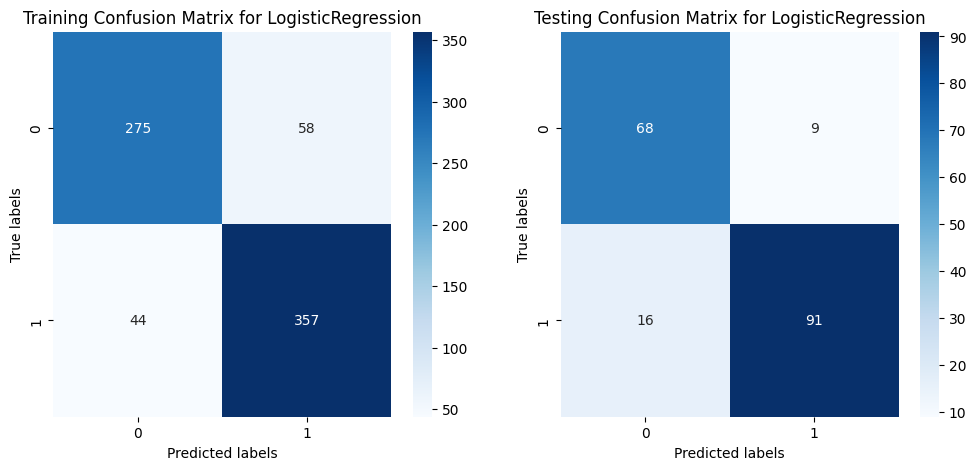

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.86      0.83      0.84       333
           1       0.86      0.89      0.88       401

    accuracy                           0.86       734
   macro avg       0.86      0.86      0.86       734
weighted avg       0.86      0.86      0.86       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.88      0.84        77
           1       0.91      0.85      0.88       107

    accuracy                           0.86       184
   macro avg       0.86      0.87      0.86       184
weighted avg       0.87      0.86      0.86       184

Training ROC AUC Score: 0.9281151475665191
Testing ROC AUC Score: 0.9302099769389488


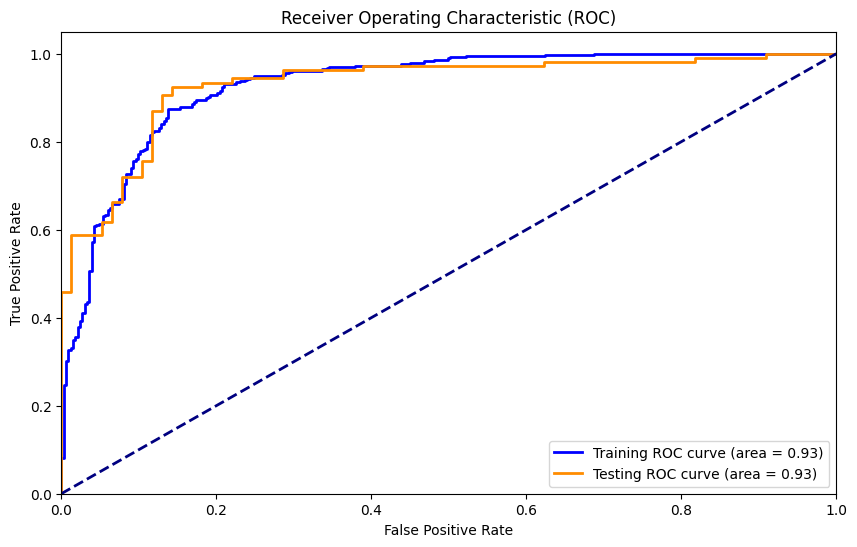

In [523]:
# Train and evaluate the logistic regression model
logistic_regression_without_pca = LogisticRegression(random_state=42)
kwargs = {**normal_kwargs}
kwargs['model'] = logistic_regression_without_pca
kwargs['model_name'] = 'Logistic Regression'
lr_output = train_and_evaluate(**kwargs)

In [524]:
lr_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Logistic Regression,0.928115,0.861035,0.860241,0.890274,0.875,0.93021,0.86413,0.91,0.850467,0.879227


The Logistic Regression performs well across the different metrics achieving 

##### Grid Search

Best parameters found: {'C': 0.1, 'l1_ratio': 0.5, 'max_iter': 100, 'penalty': 'elasticnet', 'solver': 'saga'}
Best cross-validation score: 0.8797909064585013
Evaluating LogisticRegression


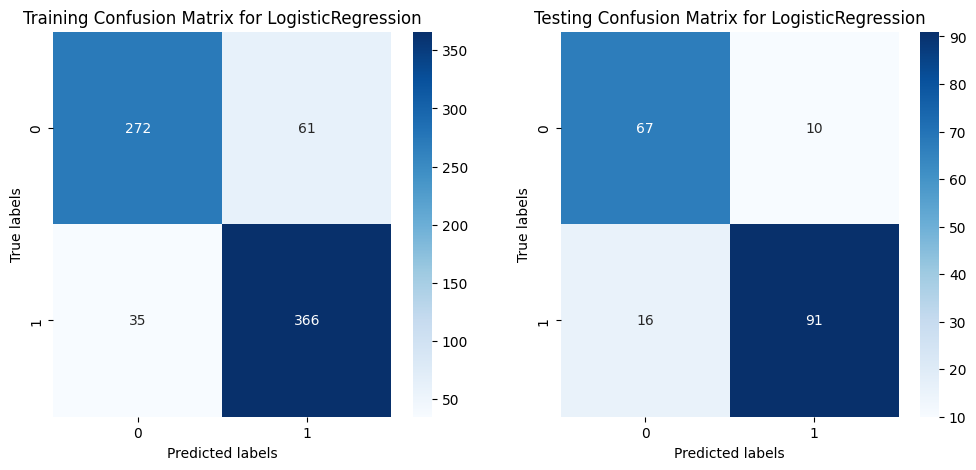

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.89      0.82      0.85       333
           1       0.86      0.91      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.86      0.87       734
weighted avg       0.87      0.87      0.87       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.87      0.84        77
           1       0.90      0.85      0.88       107

    accuracy                           0.86       184
   macro avg       0.85      0.86      0.86       184
weighted avg       0.86      0.86      0.86       184

Training ROC AUC Score: 0.9243482884380639
Testing ROC AUC Score: 0.9226847918436704


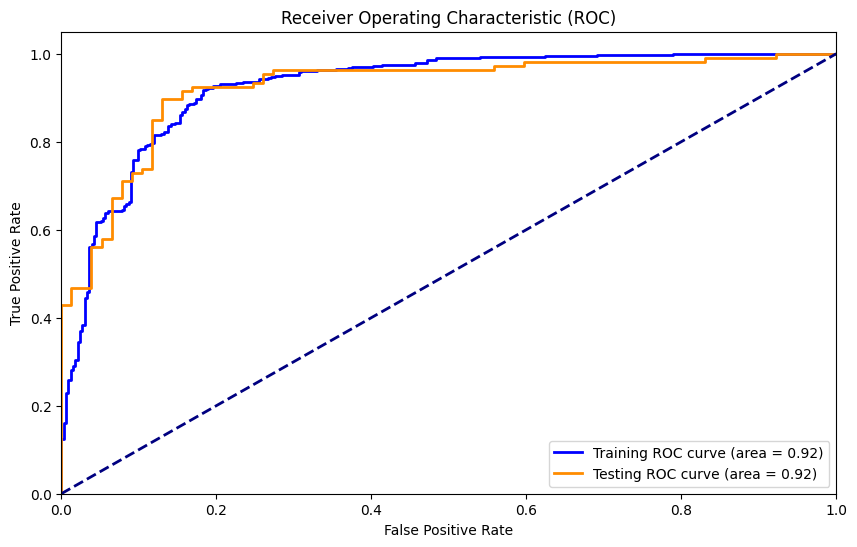

In [525]:
# Trying to tune the hyperparameters of the logistic regression model
logistic_regression_grid_without_pca = LogisticRegression(random_state=42)
kwargs = {**grid_search_kwargs}
kwargs['model'] = logistic_regression_grid_without_pca
kwargs['model_name'] = 'Logistic Regression (Grid Search)'
param_grid_lr = [
    # For lbfgs solver: only 'l2' or None allowed
    {
        'solver': ['lbfgs'],
        'penalty': ['l2', None],
        'C': [0, 0.01, 0.1, 1, 10],
        'max_iter': [100, 200, 500]
    },
    # For saga solver: l1, l2, and elasticnet allowed, but elasticnet requires l1_ratio
    {
        'solver': ['saga'],
        'penalty': ['l1', 'l2', 'elasticnet'],
        'C': [0, 0.01, 0.1, 1, 10],
        'max_iter': [100, 200, 500],
        'l1_ratio': [0.5]  # required if 'elasticnet' is chosen
    }
]
kwargs["param_grid"] = param_grid_lr
lr_grid_output, logistic_regression_grid_without_pca = grid_search_and_evaluate(**kwargs)

In [526]:
# View the results of the logistic regression model
lr_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Logistic Regression (Grid Search),0.924348,0.86921,0.857143,0.912718,0.884058,0.922685,0.858696,0.90099,0.850467,0.875


#### 2. With PCA

##### PCA Only

Evaluating LogisticRegression


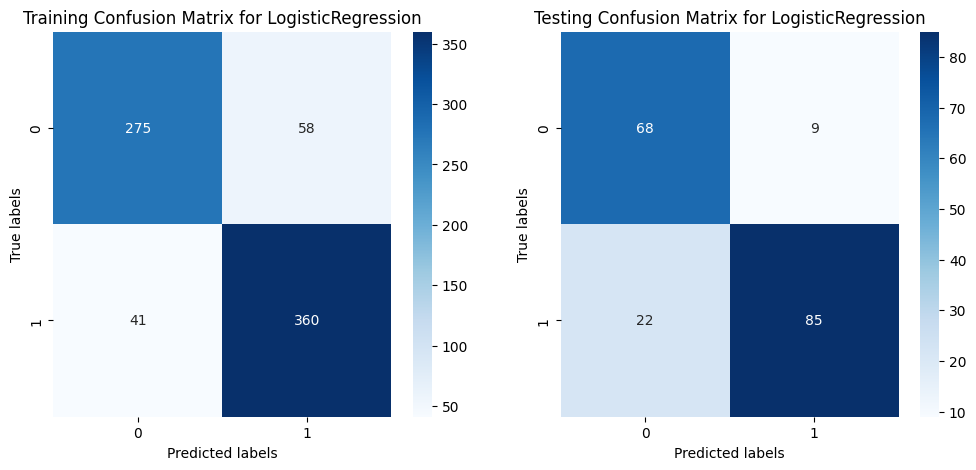

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.87      0.83      0.85       333
           1       0.86      0.90      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.86      0.86       734
weighted avg       0.87      0.87      0.86       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.88      0.81        77
           1       0.90      0.79      0.85       107

    accuracy                           0.83       184
   macro avg       0.83      0.84      0.83       184
weighted avg       0.84      0.83      0.83       184

Training ROC AUC Score: 0.9188664974201133
Testing ROC AUC Score: 0.916494720233038


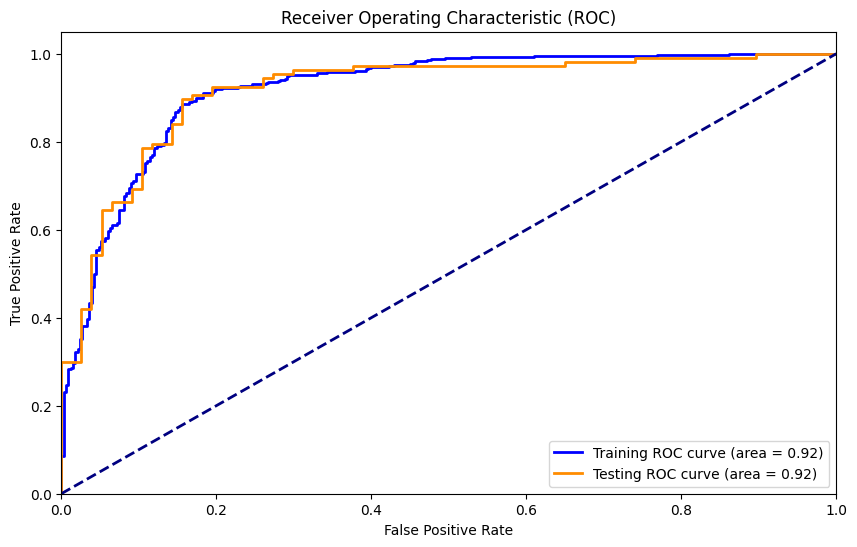

In [527]:
# Train and evaluate logistic regression model with PCA
logistic_regression_with_pca = LogisticRegression(random_state=42)
kwargs = {**pca_kwargs}
kwargs['model'] = logistic_regression_with_pca
kwargs['model_name'] = 'Logistic Regression (PCA)'
lr_pca_output = train_and_evaluate(**kwargs)

In [528]:
# View the results of the logistic regression model with PCA
lr_pca_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Logistic Regression (PCA),0.918866,0.865123,0.861244,0.897756,0.879121,0.916495,0.831522,0.904255,0.794393,0.845771


##### PCA + Grid Search

Best parameters found: {'C': 0.1, 'l1_ratio': 0.5, 'max_iter': 100, 'penalty': 'elasticnet', 'solver': 'saga'}
Best cross-validation score: 0.8811665597317507
Evaluating LogisticRegression


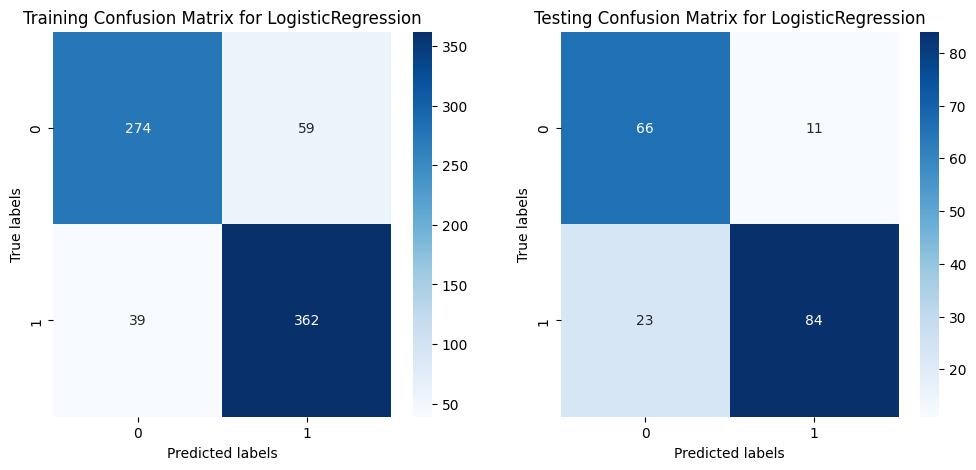

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.88      0.82      0.85       333
           1       0.86      0.90      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.86      0.86       734
weighted avg       0.87      0.87      0.87       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.74      0.86      0.80        77
           1       0.88      0.79      0.83       107

    accuracy                           0.82       184
   macro avg       0.81      0.82      0.81       184
weighted avg       0.82      0.82      0.82       184

Training ROC AUC Score: 0.9182224618633597
Testing ROC AUC Score: 0.9183153295302829


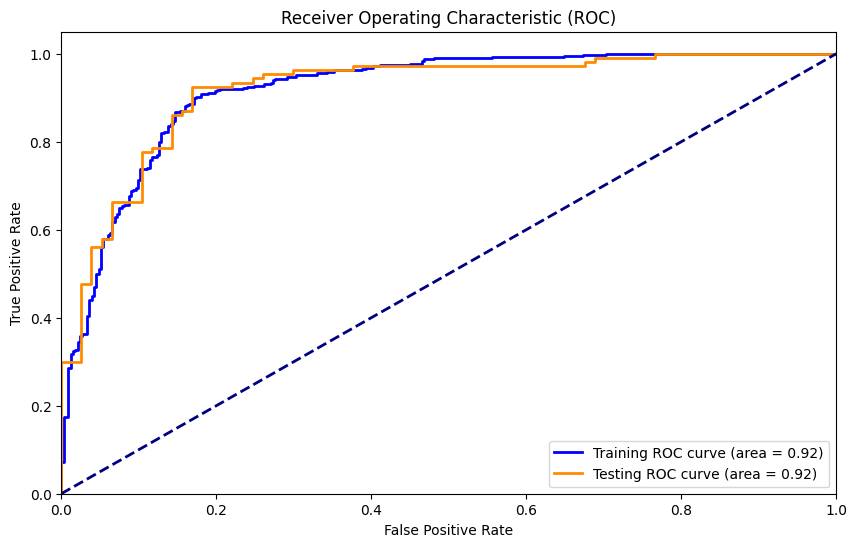

In [529]:
# Train and evaluate PCA and logistic regression model with grid search
logistic_regression_grid_with_pca = LogisticRegression(random_state=42)
kwargs = {**pca_grid_search_kwargs}
kwargs['model'] = logistic_regression_grid_with_pca
kwargs['model_name'] = 'Logistic Regression (PCA, Grid Search)'
param_grid_lr = [
    # For lbfgs solver: only 'l2' or None allowed
    {
        'solver': ['lbfgs'],
        'penalty': ['l2', None],
        'C': [0, 0.01, 0.1, 1, 10],
        'max_iter': [100, 200, 500]
    },
    # For saga solver: l1, l2, and elasticnet allowed, but elasticnet requires l1_ratio
    {
        'solver': ['saga'],
        'penalty': ['l1', 'l2', 'elasticnet'],
        'C': [0, 0.01, 0.1, 1, 10],
        'max_iter': [100, 200, 500],
        'l1_ratio': [0.5]  # required if 'elasticnet' is chosen
    }
]
kwargs["param_grid"] = param_grid_lr
lr_pca_grid_output, logistic_regression_grid_with_pca = grid_search_and_evaluate(**kwargs)


In [530]:
# View the results of the logistic regression model with PCA and grid search
lr_pca_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"Logistic Regression (PCA, Grid Search)",0.918222,0.866485,0.859857,0.902743,0.880779,0.918315,0.815217,0.884211,0.785047,0.831683


#### Visualizing Decision Boundary

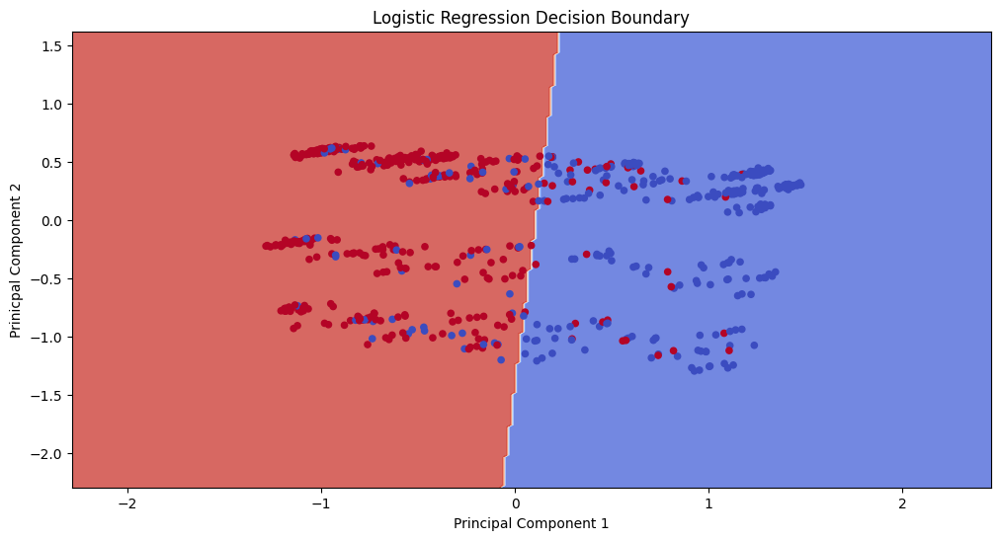

In [531]:
# Visualizing the decision boundary of the logistic regression model
draw_decision_boundary(logistic_regression_grid_with_pca, X_train_pca, y_train, "Logistic Regression Decision Boundary")

#### Forward Selection

We will use the vanilla logistic regression model for the forward selection as it yielded the best results in the previous experiments.

Selected Features (Indices): [0, 1, 2, 6, 8, 9, 12, 14]
Selected Features (Names): ['age', 'sex', 'restingbp', 'exerciseangina', 'chestpaintype_ASY', 'chestpaintype_ATA', 'restingecg_Normal', 'st_slope_Up']
Evaluating LogisticRegression


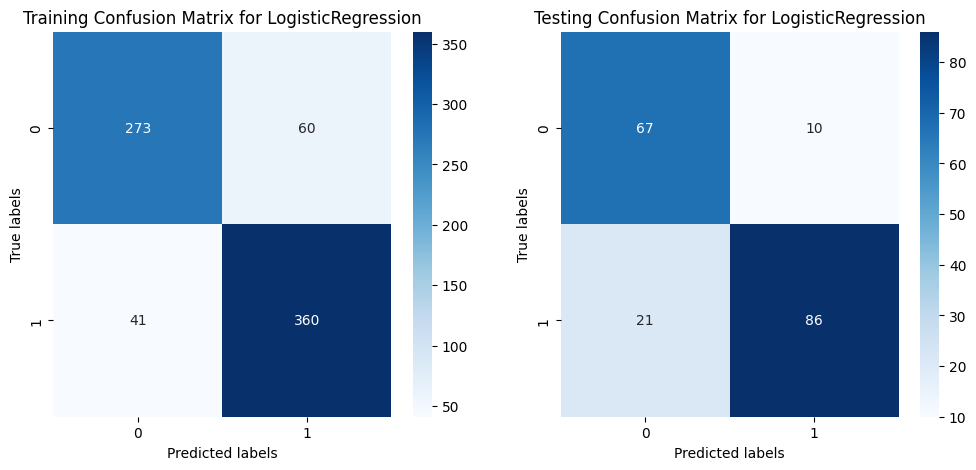

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.87      0.82      0.84       333
           1       0.86      0.90      0.88       401

    accuracy                           0.86       734
   macro avg       0.86      0.86      0.86       734
weighted avg       0.86      0.86      0.86       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.87      0.81        77
           1       0.90      0.80      0.85       107

    accuracy                           0.83       184
   macro avg       0.83      0.84      0.83       184
weighted avg       0.84      0.83      0.83       184

Training ROC AUC Score: 0.9197913624347539
Testing ROC AUC Score: 0.9209855564995753


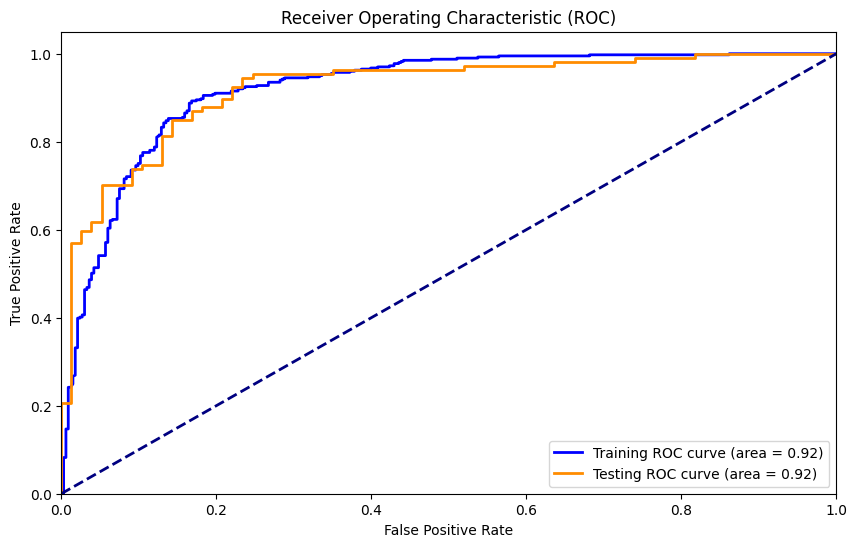

In [532]:
# Train and evaluate the logistic regression model
logistic_regression_sfs = LogisticRegression(random_state=42)
kwargs = {**sfs_kwargs}
kwargs['model'] = logistic_regression_sfs
kwargs['model_name'] = 'Logistic Regression (Vanilla, Forward Selection)'
lr_vanilla_forward_selection_output = train_sfs_and_evaluate(**kwargs)

In [533]:
lr_vanilla_forward_selection_output['evaluation_results']

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"Logistic Regression (Vanilla, Forward Selection)",0.919791,0.862398,0.857143,0.897756,0.876979,0.920986,0.831522,0.895833,0.803738,0.847291


In [534]:
all_lr_outputs = pd.concat([
    lr_output, 
    lr_grid_output,
    lr_pca_output, 
    lr_pca_grid_output, 
    lr_vanilla_forward_selection_output['evaluation_results']]
)
all_lr_outputs

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Logistic Regression,0.928115,0.861035,0.860241,0.890274,0.875000,0.930210,0.864130,0.910000,0.850467,0.879227
0,Logistic Regression (Grid Search),0.924348,0.869210,0.857143,0.912718,0.884058,0.922685,0.858696,0.900990,0.850467,0.875000
0,Logistic Regression (PCA),0.918866,0.865123,0.861244,0.897756,0.879121,0.916495,0.831522,0.904255,0.794393,0.845771
0,"Logistic Regression (PCA, Grid Search)",0.918222,0.866485,0.859857,0.902743,0.880779,0.918315,0.815217,0.884211,0.785047,0.831683
0,"Logistic Regression (Vanilla, Forward Selection)",0.919791,0.862398,0.857143,0.897756,0.876979,0.920986,0.831522,0.895833,0.803738,0.847291


1. Logistic Regression:

    - Strong performance overall with balanced train and test metrics.
    - Test ROC AUC (0.930) is slightly better than train ROC AUC (0.928), indicating good generalization.
    - High test precision (0.910) but a slight dip in test recall (0.850), suggesting a bias toward correctly identifying positive cases while missing some.

2. Logistic Regression (Grid Search):

    - Similar ROC AUC on both train (0.924) and test (0.923) compared to the base model.
    - Similar test recall (0.850) but slightly lower precision (0.901) compared to the base logistic regression, suggesting minimal improvement from hyperparameter tuning.

3. Logistic Regression (PCA):

    - Train metrics are slightly lower than the base model, indicating some loss of information due to dimensionality reduction.
    - Test metrics drop noticeably, especially accuracy (0.832) and recall (0.794), implying poorer generalization and higher false negatives.

4. Logistic Regression (PCA, Grid Search):

    - Similar train metrics to Logistic Regression (PCA), with only slight variations.
    - Test performance further drops, with accuracy (0.815) and recall (0.785) taking significant hits.
    - Overall, PCA with Grid Search does not improve performance and leads to poorer generalization.

5. Logistic Regression (Vanilla, Forward Selection):

    - Train metrics are slightly improved compared to PCA-based models but do not outperform the base logistic regression.
    - Test metrics (accuracy: 0.832, recall: 0.804) show better balance compared to PCA-based models but still lag behind the base model.
    - Forward selection does not provide a clear advantage over the base logistic regression model.

- Best Model: The base Logistic Regression model achieves the best balance between train and test performance.
- PCA Impact: PCA-based models show a noticeable performance decline, likely due to loss of important information.
- Grid Search: Minimal improvement from hyperparameter tuning, suggesting the default hyperparameters are already near optimal for this dataset.

### Decision Tree

#### 1. Without PCA

##### Vanilla Model

Evaluating DecisionTreeClassifier


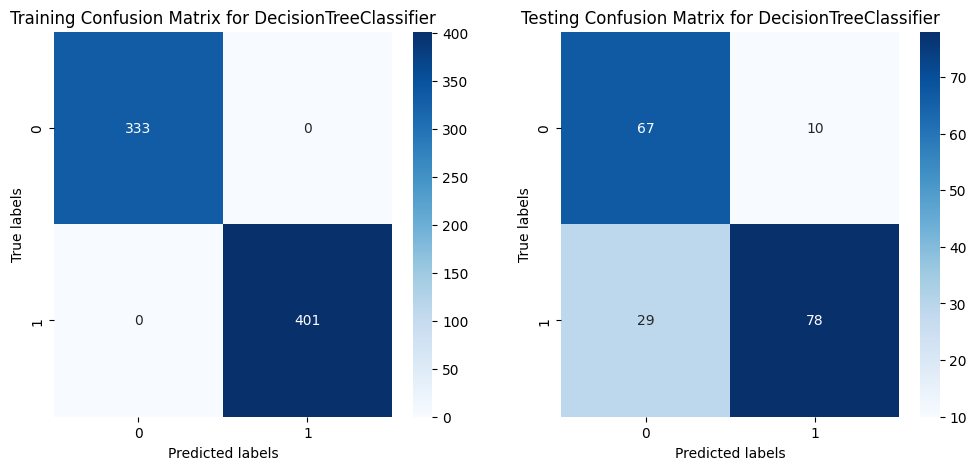

Training Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       333
           1       1.00      1.00      1.00       401

    accuracy                           1.00       734
   macro avg       1.00      1.00      1.00       734
weighted avg       1.00      1.00      1.00       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.70      0.87      0.77        77
           1       0.89      0.73      0.80       107

    accuracy                           0.79       184
   macro avg       0.79      0.80      0.79       184
weighted avg       0.81      0.79      0.79       184

Training ROC AUC Score: 1.0
Testing ROC AUC Score: 0.7995509163733462


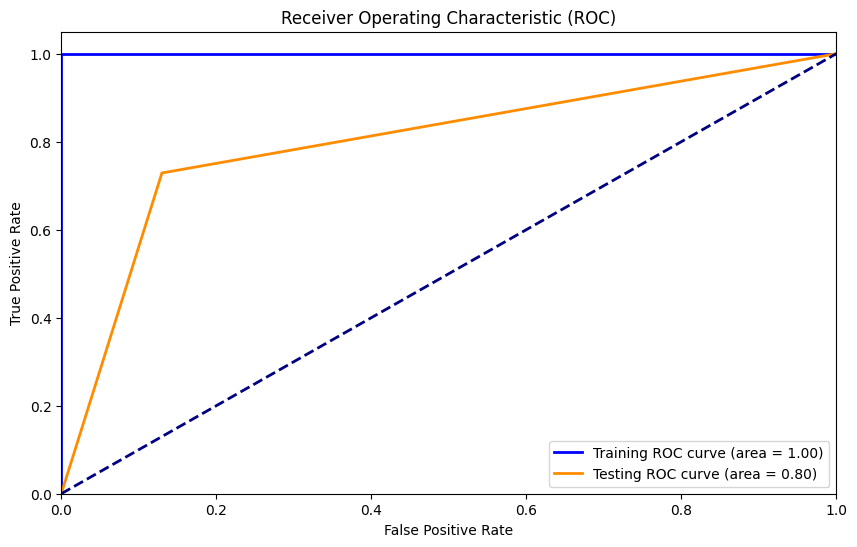

In [535]:
# Train and evaluate the decision tree model
decision_tree_without_pca = DecisionTreeClassifier(random_state=42)
kwargs = {**normal_kwargs}
kwargs['model'] = decision_tree_without_pca
kwargs['model_name'] = 'Decision Tree'
dt_output = train_and_evaluate(**kwargs)


In [536]:
# View the results of the decision tree model
dt_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Decision Tree,1.0,1.0,1.0,1.0,1.0,0.799551,0.788043,0.886364,0.728972,0.8


##### Grid Search

Best parameters found: {'ccp_alpha': 0.01, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5}
Best cross-validation score: 0.8456931669358102
Evaluating DecisionTreeClassifier


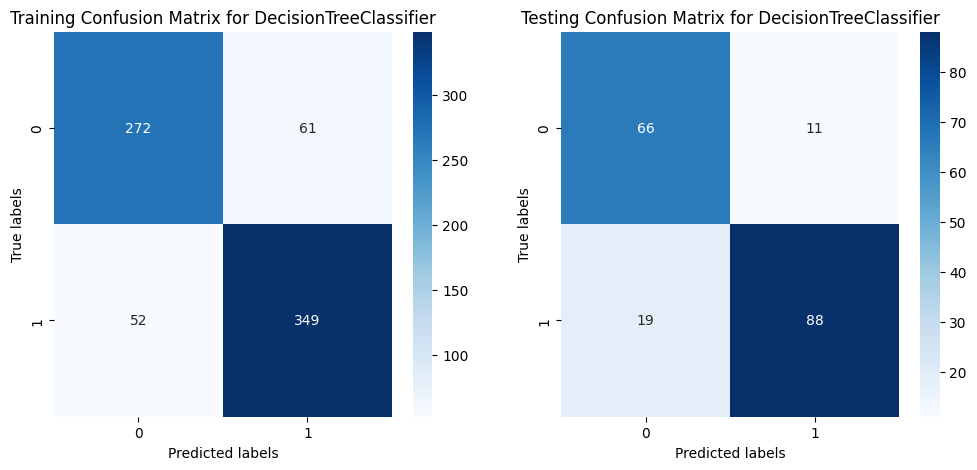

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       333
           1       0.85      0.87      0.86       401

    accuracy                           0.85       734
   macro avg       0.85      0.84      0.84       734
weighted avg       0.85      0.85      0.85       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.86      0.81        77
           1       0.89      0.82      0.85       107

    accuracy                           0.84       184
   macro avg       0.83      0.84      0.83       184
weighted avg       0.84      0.84      0.84       184

Training ROC AUC Score: 0.8988414848763976
Testing ROC AUC Score: 0.8642432334021118


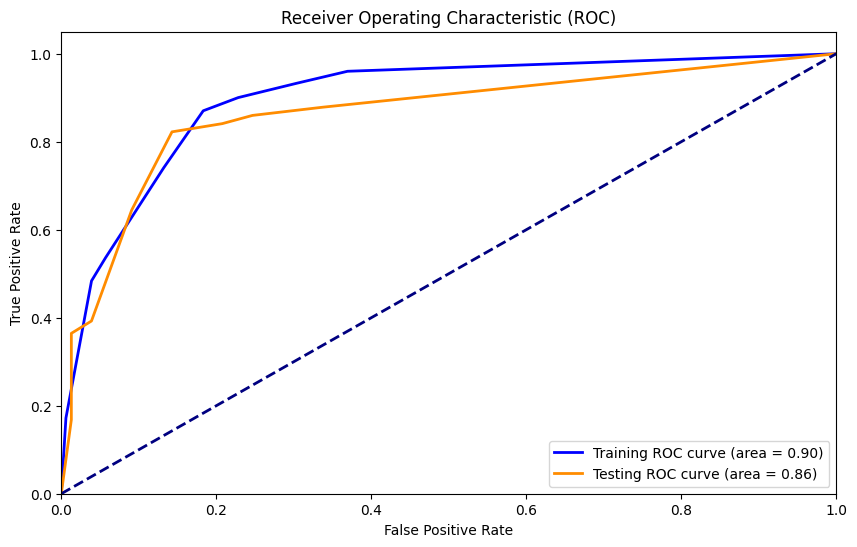

In [537]:
# Trying to prune the decision tree model
decision_tree_grid_without_pca = DecisionTreeClassifier(random_state=42)
kwargs = {**grid_search_kwargs}
kwargs['model'] = decision_tree_grid_without_pca
kwargs['model_name'] = 'Decision Tree (Grid Search)'
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'ccp_alpha': [0, 0.01, 0.1, 1, 10]
}
kwargs["param_grid"] = param_grid_dt
dt_grid_output, decision_tree_grid_without_pca = grid_search_and_evaluate(**kwargs)

In [538]:
dt_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Decision Tree (Grid Search),0.898841,0.846049,0.85122,0.870324,0.860666,0.864243,0.836957,0.888889,0.82243,0.854369


#### 2. With PCA

##### PCA Only

Evaluating DecisionTreeClassifier


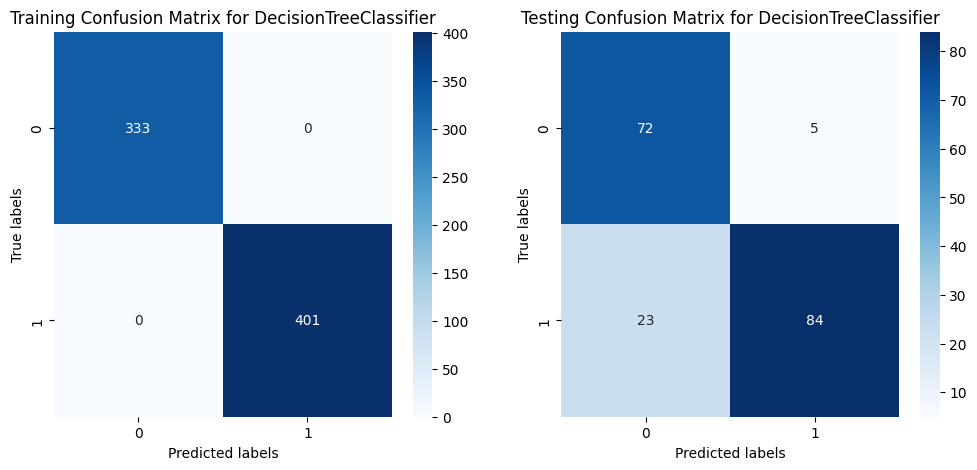

Training Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       333
           1       1.00      1.00      1.00       401

    accuracy                           1.00       734
   macro avg       1.00      1.00      1.00       734
weighted avg       1.00      1.00      1.00       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.94      0.84        77
           1       0.94      0.79      0.86       107

    accuracy                           0.85       184
   macro avg       0.85      0.86      0.85       184
weighted avg       0.87      0.85      0.85       184

Training ROC AUC Score: 1.0
Testing ROC AUC Score: 0.8600558320184489


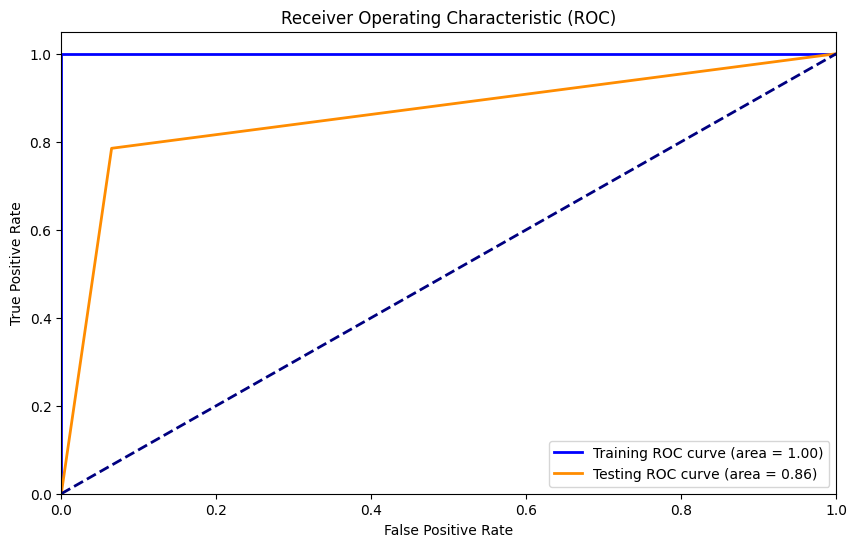

In [539]:
# Train and evaluate the decision tree model with PCA
decision_tree_with_pca = DecisionTreeClassifier(random_state=42)
kwargs = {**pca_kwargs}
kwargs['model'] = decision_tree_with_pca
kwargs['model_name'] = 'Decision Tree (PCA)'
dt_pca_output = train_and_evaluate(**kwargs)

In [540]:
# View the results of the decision tree model with PCA
dt_pca_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Decision Tree (PCA),1.0,1.0,1.0,1.0,1.0,0.860056,0.847826,0.94382,0.785047,0.857143


##### PCA + Grid Search

Best parameters found: {'ccp_alpha': 0.01, 'criterion': 'entropy', 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5}
Best cross-validation score: 0.8730466978067112
Evaluating DecisionTreeClassifier


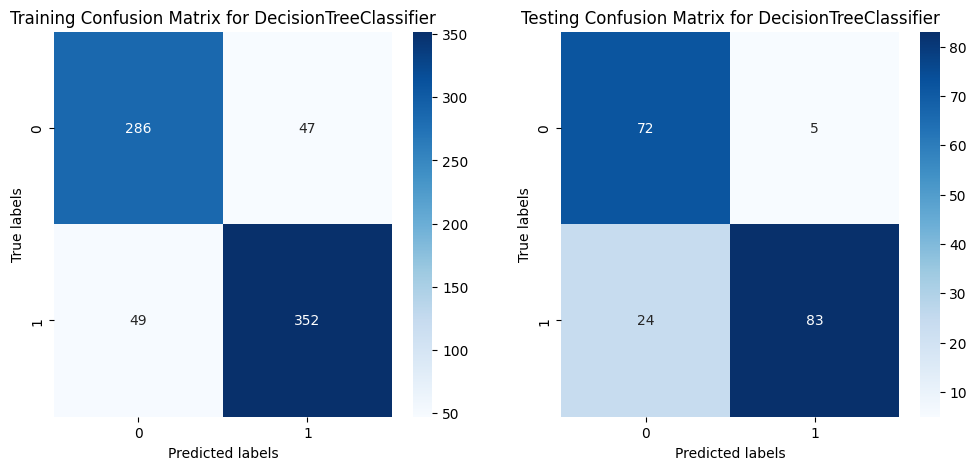

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.85      0.86      0.86       333
           1       0.88      0.88      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.87      0.87       734
weighted avg       0.87      0.87      0.87       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.75      0.94      0.83        77
           1       0.94      0.78      0.85       107

    accuracy                           0.84       184
   macro avg       0.85      0.86      0.84       184
weighted avg       0.86      0.84      0.84       184

Training ROC AUC Score: 0.9133322849033573
Testing ROC AUC Score: 0.9078164825828376


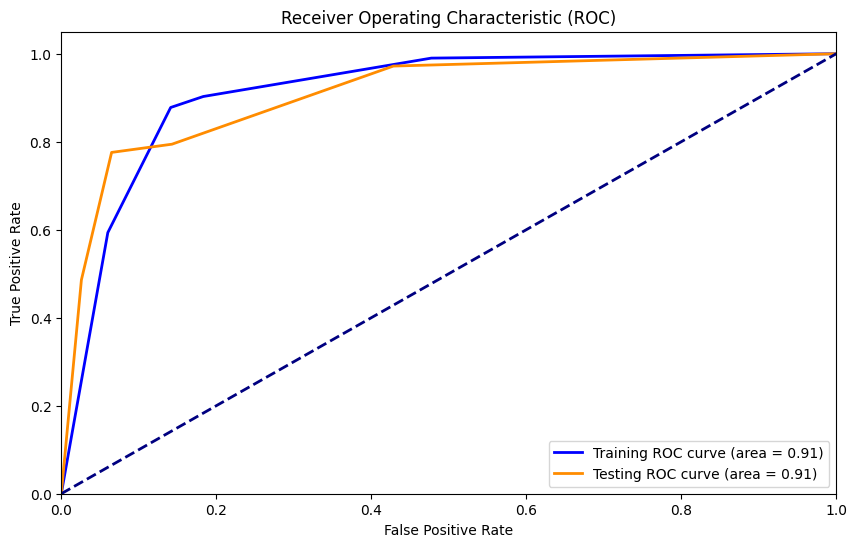

In [541]:
# Train and evaluate PCA and decision tree model with grid search
decision_tree_grid_with_pca = DecisionTreeClassifier(random_state=42)
kwargs = {**pca_grid_search_kwargs}
kwargs['model'] = decision_tree_grid_with_pca
kwargs['model_name'] = 'Decision Tree (PCA, Grid Search)'
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'ccp_alpha': [0, 0.01, 0.1, 1, 10]
}
kwargs["param_grid"] = param_grid_dt
dt_pca_grid_output, decision_tree_grid_with_pca = grid_search_and_evaluate(**kwargs)

In [542]:
# View the results of the decision tree model with PCA and grid search
dt_pca_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"Decision Tree (PCA, Grid Search)",0.913332,0.86921,0.882206,0.877805,0.88,0.907816,0.842391,0.943182,0.775701,0.851282


#### Visualizing Decision Boundary

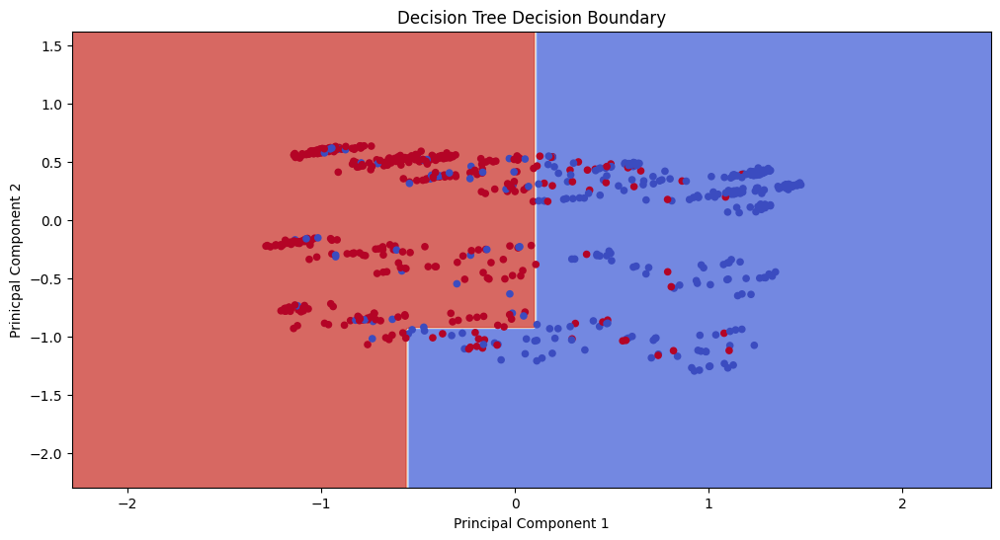

In [543]:
# Visualizing the decision boundary of the decision tree model
draw_decision_boundary(decision_tree_grid_with_pca, X_train_pca, y_train, "Decision Tree Decision Boundary")

#### Forward Selection

We will use the decision tree model obtained using grid search for the forward selection as it yielded the best results in the previous experiments.

Selected Features (Indices): [1, 6, 8, 14]
Selected Features (Names): ['sex', 'exerciseangina', 'chestpaintype_ASY', 'st_slope_Up']
Evaluating DecisionTreeClassifier


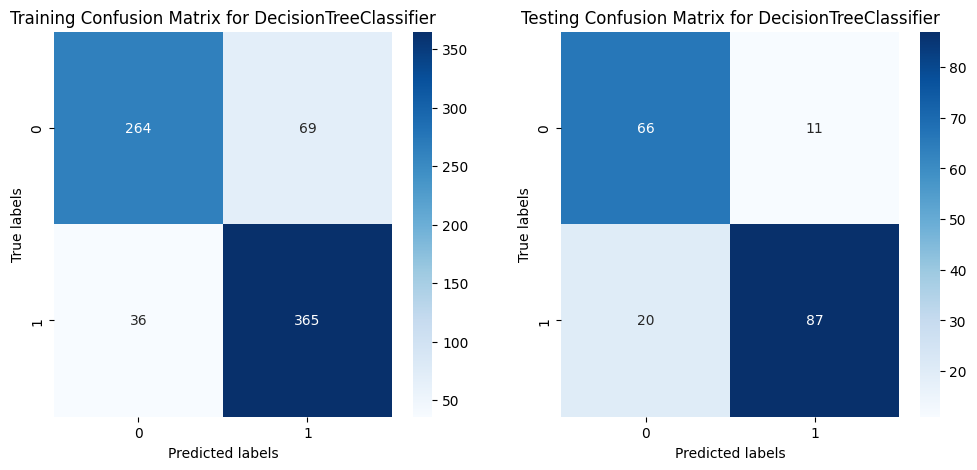

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.88      0.79      0.83       333
           1       0.84      0.91      0.87       401

    accuracy                           0.86       734
   macro avg       0.86      0.85      0.85       734
weighted avg       0.86      0.86      0.86       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.86      0.81        77
           1       0.89      0.81      0.85       107

    accuracy                           0.83       184
   macro avg       0.83      0.84      0.83       184
weighted avg       0.84      0.83      0.83       184

Training ROC AUC Score: 0.9011143312888948
Testing ROC AUC Score: 0.9012622891127564


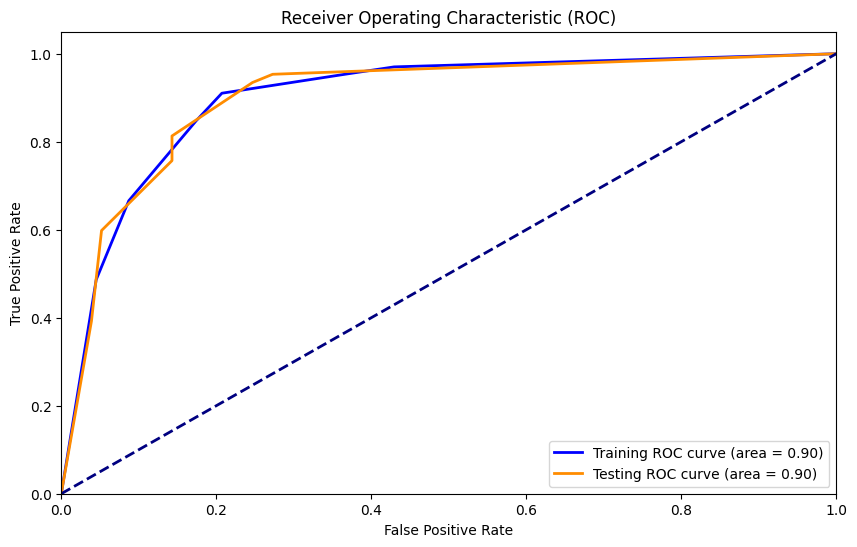

In [544]:
# Train and evaluate the decision tree model
dt_sfs = clone(decision_tree_grid_without_pca)
kwargs = {**sfs_kwargs}
kwargs['model'] = dt_sfs
kwargs['model_name'] = 'Decision Tree (Grid Search, Forward Selection)'
dt_grid_forward_selection_output = train_sfs_and_evaluate(**kwargs)

In [545]:
dt_grid_forward_selection_output['evaluation_results']

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"Decision Tree (Grid Search, Forward Selection)",0.901114,0.856948,0.841014,0.910224,0.874251,0.901262,0.831522,0.887755,0.813084,0.84878


In [546]:
all_dt_outputs = pd.concat([
    dt_output,
    dt_grid_output,
    dt_pca_output,
    dt_pca_grid_output,
    dt_grid_forward_selection_output['evaluation_results']
])
all_dt_outputs

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Decision Tree,1.000000,1.000000,1.000000,1.000000,1.000000,0.799551,0.788043,0.886364,0.728972,0.800000
0,Decision Tree (Grid Search),0.898841,0.846049,0.851220,0.870324,0.860666,0.864243,0.836957,0.888889,0.822430,0.854369
0,Decision Tree (PCA),1.000000,1.000000,1.000000,1.000000,1.000000,0.860056,0.847826,0.943820,0.785047,0.857143
0,"Decision Tree (PCA, Grid Search)",0.913332,0.869210,0.882206,0.877805,0.880000,0.907816,0.842391,0.943182,0.775701,0.851282
0,"Decision Tree (Grid Search, Forward Selection)",0.901114,0.856948,0.841014,0.910224,0.874251,0.901262,0.831522,0.887755,0.813084,0.848780


**Decision Tree**
- **Train Metrics**: Perfect scores (ROC AUC, accuracy, precision, recall, F1 = 1.0) indicate severe overfitting.
- **Test Metrics**: 
  - ROC AUC: 0.800 
  - Recall: 0.729 — significantly lower, highlighting the model's inability to generalize.
- **Other Metrics**: Precision (0.886) is decent, but the low recall indicates it misses a substantial number of true positives.
- **Overall**: Poor generalization and unbalanced performance make this model unsuitable when recall is a priority.

**Decision Tree (Grid Search)**
- **Train Metrics**: ROC AUC (0.899) and recall (0.870) show reduced overfitting compared to the base model.
- **Test Metrics**: 
  - ROC AUC: 0.864 
  - Recall: 0.822 — marked improvement with better balance and it is the highest among all decision tree models, making it the a good option when recall is prioritized.
- **Other Metrics**: Precision (0.889) and F1 (0.854) indicate strong performance across metrics.
- **Overall**: A robust model with good generalization and balance between precision and recall.

**Decision Tree (PCA)**
- **Train Metrics**: Perfect scores (ROC AUC, accuracy, recall, etc.) confirm overfitting even with dimensionality reduction.
- **Test Metrics**: 
  - Recall: 0.785 — an improvement over the base model but still lower than desired.
- **Other Metrics**: Precision (0.944) is very high, leading to a strong F1 score (0.857), but the trade-off is missing true positives (low recall).
- **Overall**: Improved test metrics compared to the base model but still not ideal for recall-prioritized tasks.

**Decision Tree (PCA, Grid Search)**
- **Train Metrics**: ROC AUC (0.913) and recall (0.878) indicate a better balance between fit and generalization.
- **Test Metrics**: 
  - Recall: 0.776 — lower than desired, despite improved ROC AUC (0.908) and F1 score (0.851).
- **Other Metrics**: Precision (0.943) remains strong, but recall struggles, making this model less suitable for recall-focused tasks.
- **Overall**: Generalizes well across metrics but still falls short on recall.

**Decision Tree (Grid Search, Forward Selection)**
- **Train Metrics**: ROC AUC (0.901) and recall (0.910) suggest a strong ability to capture true positives.
- **Test Metrics**: 
  - Recall: 0.813 — the 2nd highest among all decision tree models, making it the a good option when recall is prioritized.
- **Other Metrics**: Precision (0.888) and F1 (0.849) show a good balance across metrics.
- **Overall**: Achieves a high recall while maintaining balanced performance across other metrics.


**Best Model for Recall**: **Decision Tree (Grid Search)** achieves the highest test recall (0.822), making it the best choice for recall-prioritized tasks.

### Random Forest

#### 1. Without PCA

##### Vanilla Model

Evaluating RandomForestClassifier


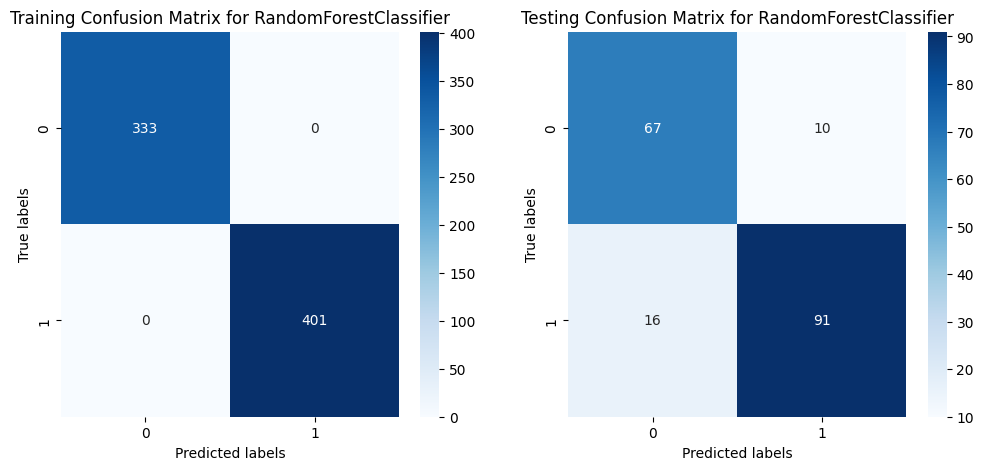

Training Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       333
           1       1.00      1.00      1.00       401

    accuracy                           1.00       734
   macro avg       1.00      1.00      1.00       734
weighted avg       1.00      1.00      1.00       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.87      0.84        77
           1       0.90      0.85      0.88       107

    accuracy                           0.86       184
   macro avg       0.85      0.86      0.86       184
weighted avg       0.86      0.86      0.86       184

Training ROC AUC Score: 1.0
Testing ROC AUC Score: 0.9307561597281223


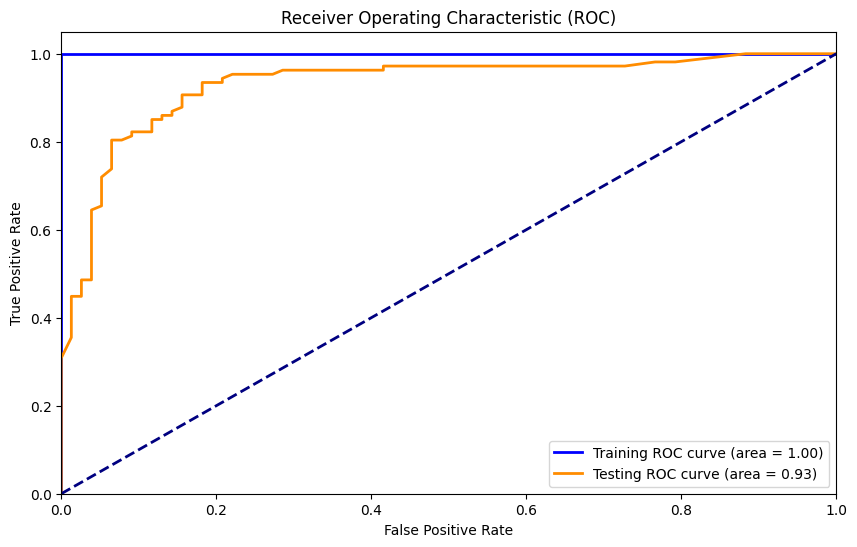

In [547]:
# Train and evaluate the random forest model
random_forest_without_pca = RandomForestClassifier(random_state=42)
kwargs = {**normal_kwargs}
kwargs['model'] = random_forest_without_pca
kwargs['model_name'] = 'Random Forest'
rf_output = train_and_evaluate(**kwargs)

In [548]:
# View the results of the random forest model
rf_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Random Forest,1.0,1.0,1.0,1.0,1.0,0.930756,0.858696,0.90099,0.850467,0.875


##### Grid Search

Best parameters found: {'ccp_alpha': 0, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Best cross-validation score: 0.8857818512577387
Evaluating RandomForestClassifier


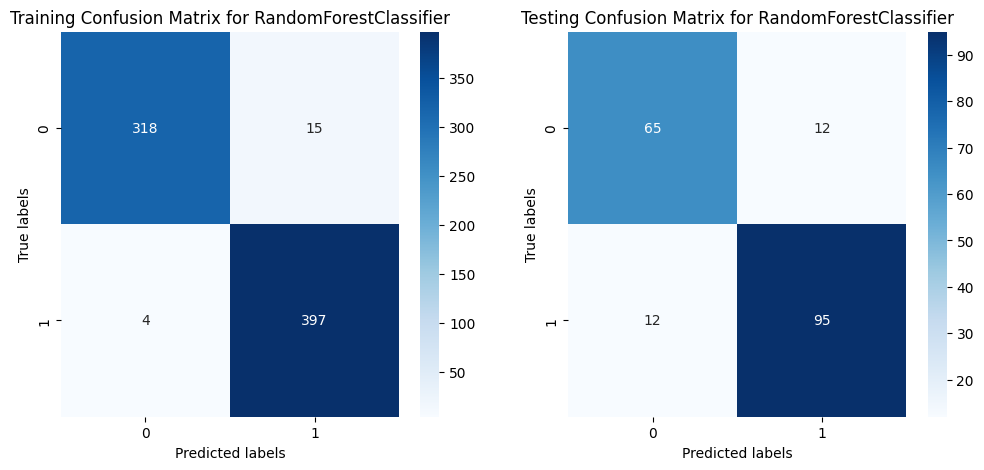

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.99      0.95      0.97       333
           1       0.96      0.99      0.98       401

    accuracy                           0.97       734
   macro avg       0.98      0.97      0.97       734
weighted avg       0.97      0.97      0.97       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.84      0.84        77
           1       0.89      0.89      0.89       107

    accuracy                           0.87       184
   macro avg       0.87      0.87      0.87       184
weighted avg       0.87      0.87      0.87       184

Training ROC AUC Score: 0.9980229606164768
Testing ROC AUC Score: 0.9281466197354047


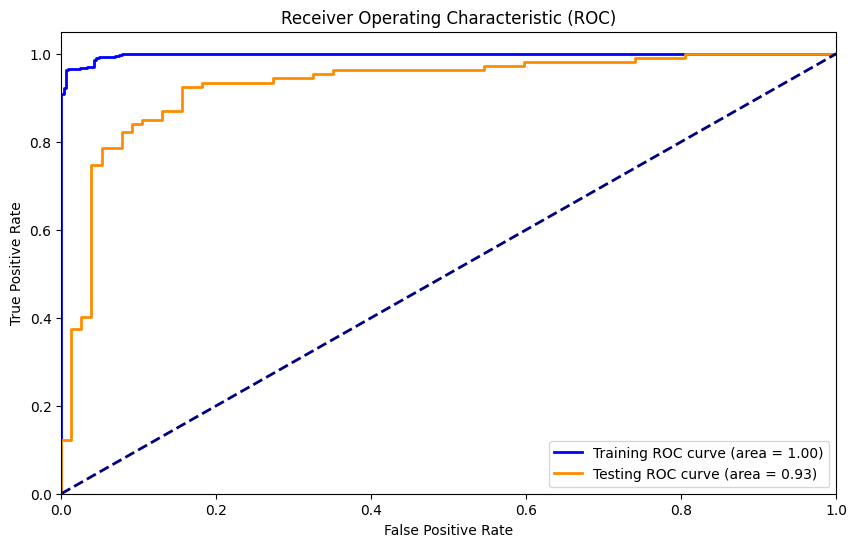

In [549]:
# Trying to tune the hyperparameters of the random forest model
random_forest_grid_without_pca = RandomForestClassifier(random_state=42)
param_grid_rf = {
    'n_estimators': [100],
    'max_depth': [5, 10, 20],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'ccp_alpha': [0, 0.01, 0.1, 1, 10]
}
kwargs = {**grid_search_kwargs}
kwargs['model'] = random_forest_grid_without_pca
kwargs['model_name'] = 'Random Forest (Grid Search)'
kwargs["param_grid"] = param_grid_rf
rf_grid_output, random_forest_grid_without_pca = grid_search_and_evaluate(**kwargs)

In [550]:
# View the results of the random forest model with grid search
rf_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Random Forest (Grid Search),0.998023,0.974114,0.963592,0.990025,0.97663,0.928147,0.869565,0.88785,0.88785,0.88785


#### 2. With PCA

##### PCA Only

Evaluating RandomForestClassifier


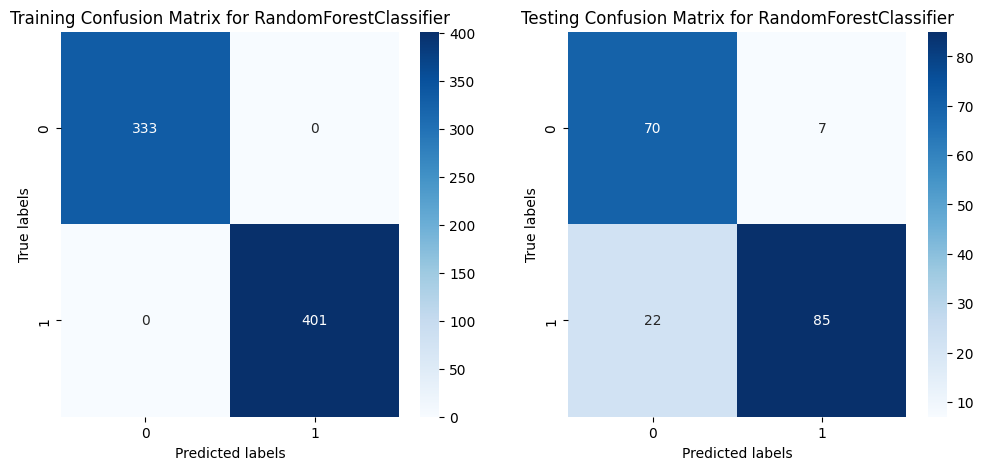

Training Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       333
           1       1.00      1.00      1.00       401

    accuracy                           1.00       734
   macro avg       1.00      1.00      1.00       734
weighted avg       1.00      1.00      1.00       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.91      0.83        77
           1       0.92      0.79      0.85       107

    accuracy                           0.84       184
   macro avg       0.84      0.85      0.84       184
weighted avg       0.86      0.84      0.84       184

Training ROC AUC Score: 1.0
Testing ROC AUC Score: 0.9271756281102076


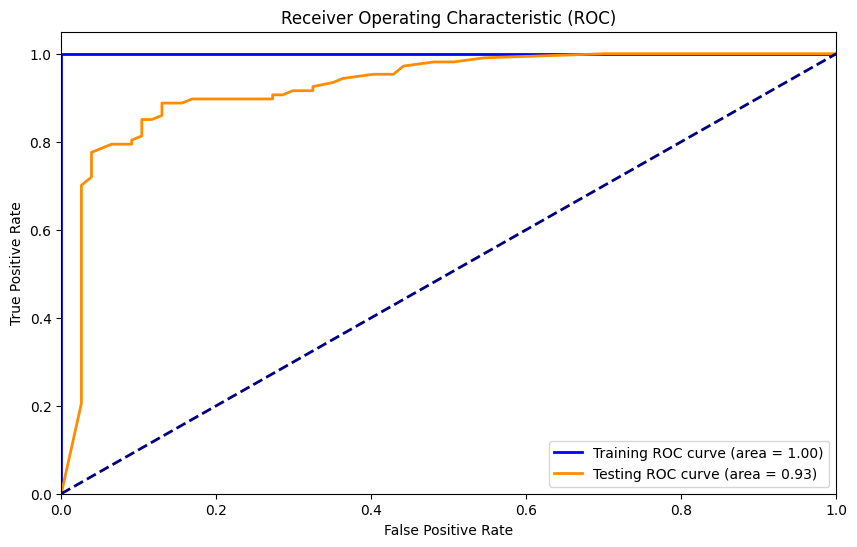

In [551]:
# Train and evaluate the random forest model with PCA
random_forest_with_pca = RandomForestClassifier(random_state=42)
kwargs = {**pca_kwargs}
kwargs['model'] = random_forest_with_pca
kwargs['model_name'] = 'Random Forest (PCA)'
rf_pca_output = train_and_evaluate(**kwargs)

In [552]:
# View the results of the random forest model with PCA
rf_pca_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Random Forest (PCA),1.0,1.0,1.0,1.0,1.0,0.927176,0.842391,0.923913,0.794393,0.854271


##### PCA + Grid Search

Best parameters found: {'ccp_alpha': 0.01, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 100}
Best cross-validation score: 0.8816391804148331
Evaluating RandomForestClassifier


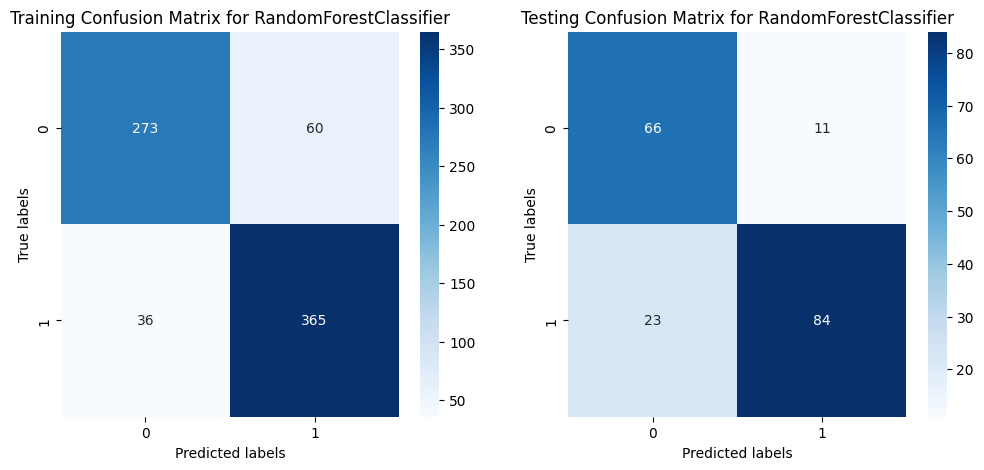

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.88      0.82      0.85       333
           1       0.86      0.91      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.87      0.87       734
weighted avg       0.87      0.87      0.87       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.74      0.86      0.80        77
           1       0.88      0.79      0.83       107

    accuracy                           0.82       184
   macro avg       0.81      0.82      0.81       184
weighted avg       0.82      0.82      0.82       184

Training ROC AUC Score: 0.9261830408962579
Testing ROC AUC Score: 0.9317878383298943


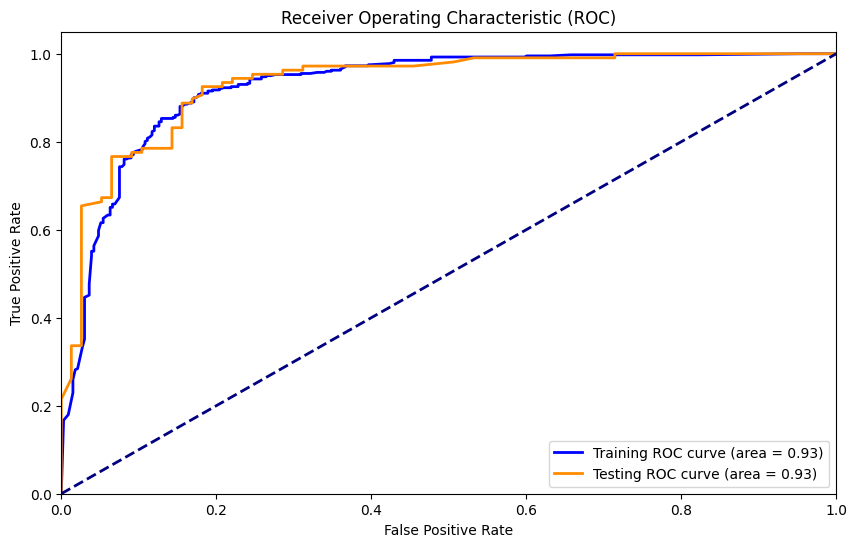

In [553]:
# Train and evaluate PCA and random forest model with grid search
random_forest_grid_with_pca = RandomForestClassifier(random_state=42)
kwargs = {**pca_grid_search_kwargs}
kwargs['model'] = random_forest_grid_with_pca
kwargs['model_name'] = 'Random Forest (PCA, Grid Search)'
kwargs["param_grid"] = param_grid_rf
rf_pca_grid_output, random_forest_grid_with_pca = grid_search_and_evaluate(**kwargs)

In [554]:
# View the results of the random forest model with PCA and grid search
rf_pca_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"Random Forest (PCA, Grid Search)",0.926183,0.86921,0.858824,0.910224,0.883777,0.931788,0.815217,0.884211,0.785047,0.831683


#### Visualizing Decision Boundary

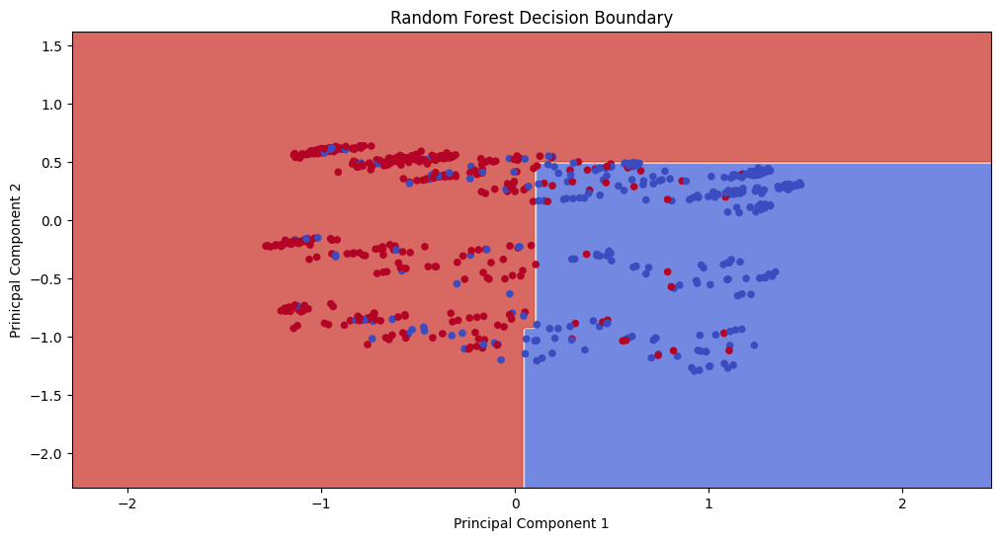

In [555]:
# Visualizing the decision boundary of the random forest model
draw_decision_boundary(random_forest_grid_with_pca, X_train_pca, y_train, "Random Forest Decision Boundary")

#### Forward Selection

We will use the random forest model obtained using grid search for the forward selection as it yielded the best results in the previous experiments.

Selected Features (Indices): [0, 1, 2, 4, 6, 7, 8, 9, 11, 12, 13, 14]
Selected Features (Names): ['age', 'sex', 'restingbp', 'fastingbs', 'exerciseangina', 'oldpeak', 'chestpaintype_ASY', 'chestpaintype_ATA', 'restingecg_LVH', 'restingecg_Normal', 'st_slope_Flat', 'st_slope_Up']
Evaluating RandomForestClassifier


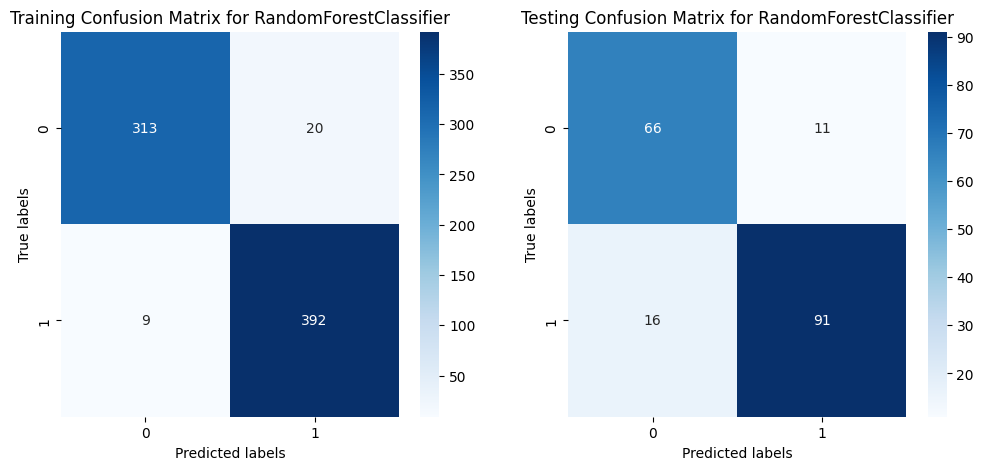

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.97      0.94      0.96       333
           1       0.95      0.98      0.96       401

    accuracy                           0.96       734
   macro avg       0.96      0.96      0.96       734
weighted avg       0.96      0.96      0.96       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.80      0.86      0.83        77
           1       0.89      0.85      0.87       107

    accuracy                           0.85       184
   macro avg       0.85      0.85      0.85       184
weighted avg       0.86      0.85      0.85       184

Training ROC AUC Score: 0.9962256520860012
Testing ROC AUC Score: 0.9220172351013473


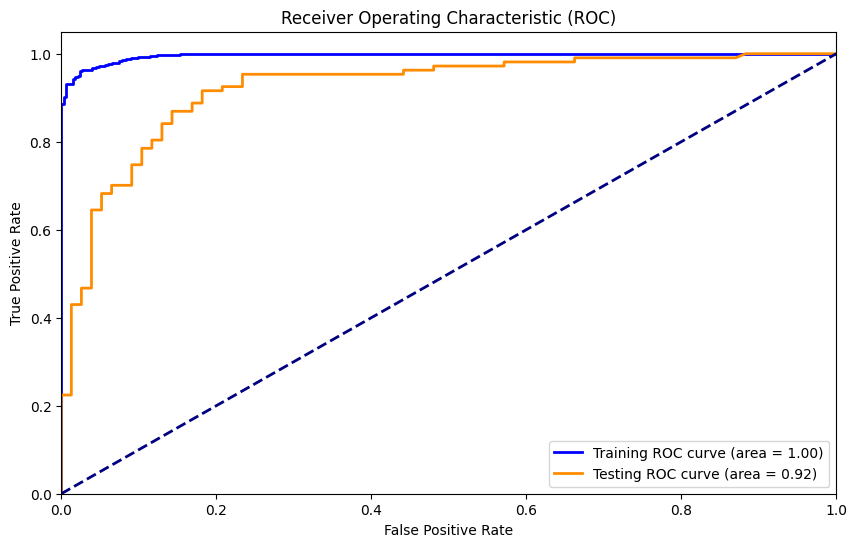

In [556]:
# Train and evaluate the random forest model
rf_sfs = clone(random_forest_grid_without_pca)
kwargs = {**sfs_kwargs}
kwargs['model'] = rf_sfs
kwargs['model_name'] = 'Random Forest (Grid Search, Forward Selection)'
rf_grid_forward_selection_output = train_sfs_and_evaluate(**kwargs)

In [557]:
rf_grid_forward_selection_output['evaluation_results']

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"Random Forest (Grid Search, Forward Selection)",0.996226,0.96049,0.951456,0.977556,0.96433,0.922017,0.853261,0.892157,0.850467,0.870813


In [558]:
all_rf_outputs = pd.concat([
    rf_output,
    rf_grid_output,
    rf_pca_output,
    rf_pca_grid_output,
    rf_grid_forward_selection_output['evaluation_results']
])
all_rf_outputs

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Random Forest,1.000000,1.000000,1.000000,1.000000,1.000000,0.930756,0.858696,0.900990,0.850467,0.875000
0,Random Forest (Grid Search),0.998023,0.974114,0.963592,0.990025,0.976630,0.928147,0.869565,0.887850,0.887850,0.887850
0,Random Forest (PCA),1.000000,1.000000,1.000000,1.000000,1.000000,0.927176,0.842391,0.923913,0.794393,0.854271
0,"Random Forest (PCA, Grid Search)",0.926183,0.869210,0.858824,0.910224,0.883777,0.931788,0.815217,0.884211,0.785047,0.831683
0,"Random Forest (Grid Search, Forward Selection)",0.996226,0.960490,0.951456,0.977556,0.964330,0.922017,0.853261,0.892157,0.850467,0.870813


**Random Forest**
- **Train Metrics**: Perfect scores (ROC AUC, accuracy, precision, recall, F1 = 1.0), indicating overfitting.
- **Test Metrics**: ROC AUC (0.931) and recall (0.850) are decent, but overfitting limits generalization. 
- **Overall**: Good baseline, but overfitting reduces reliability.

**Random Forest (Grid Search)**
- **Train Metrics**: Reduced overfitting a bit with Precision (0.964) and F1 (0.977).
- **Test Metrics**: Balanced metrics, with recall (0.888) matching precision and F1.
- **Overall**: Strong generalization with consistent performance across metrics.

**Random Forest (PCA)**
- **Train Metrics**: Perfect scores again, showing severe overfitting.
- **Test Metrics**: ROC AUC (0.927) and recall (0.794) drop significantly, with high precision (0.924).
- **Overall**: Poor recall makes it unsuitable for recall-prioritized tasks.

**Random Forest (PCA, Grid Search)**
- **Train Metrics**: Controlled overfitting (ROC AUC: 0.926, recall: 0.910).
- **Test Metrics**: Low recall (0.785) and reduced performance overall.
- **Overall**: Not effective when recall is the priority.

**Random Forest (Grid Search, Forward Selection)**
- **Train Metrics**: Good balance, with ROC AUC (0.996) and recall (0.978).
- **Test Metrics**: Balanced metrics with recall (0.850) and F1 (0.871).
- **Overall**: Reliable model with balanced performance but slightly lower recall compared to the Grid Search-only model.


**Best Model for Recall**: **Random Forest (Grid Search)** achieves the highest test recall (0.888) and consistent performance across metrics.



### Support Vector Classifier (SVC)

#### 1. Without PCA

##### Vanilla Model

Evaluating SVC


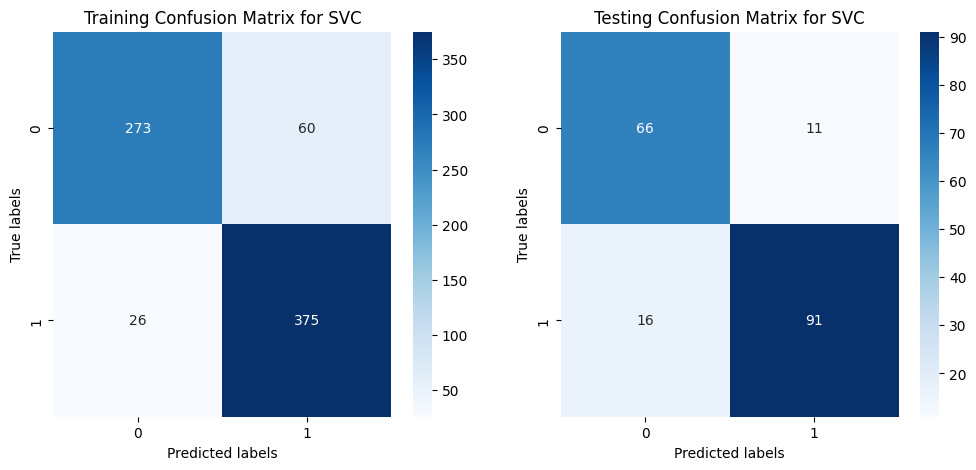

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.91      0.82      0.86       333
           1       0.86      0.94      0.90       401

    accuracy                           0.88       734
   macro avg       0.89      0.88      0.88       734
weighted avg       0.89      0.88      0.88       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.80      0.86      0.83        77
           1       0.89      0.85      0.87       107

    accuracy                           0.85       184
   macro avg       0.85      0.85      0.85       184
weighted avg       0.86      0.85      0.85       184

Training ROC AUC Score: 0.9534721754173126
Testing ROC AUC Score: 0.9225634178905208


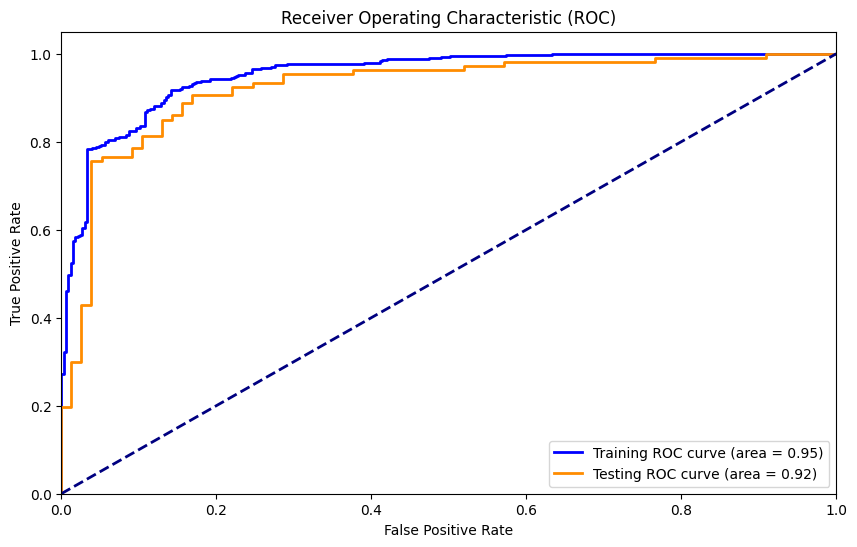

In [559]:
# Train and evaluate the support vector machine model
svm_without_pca = SVC(random_state=42, probability=True)
kwargs = {**normal_kwargs}
kwargs['model'] = svm_without_pca
kwargs['model_name'] = 'SVC'
svm_output = train_and_evaluate(**kwargs)

In [560]:
# View the results of the support vector machine model
svm_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,SVC,0.953472,0.882834,0.862069,0.935162,0.897129,0.922563,0.853261,0.892157,0.850467,0.870813


##### Grid Search

Best parameters found: {'C': 0.1, 'coef0': 0.0, 'degree': 2, 'gamma': 'auto', 'kernel': 'poly'}
Best cross-validation score: 0.8826251301501851
Evaluating SVC


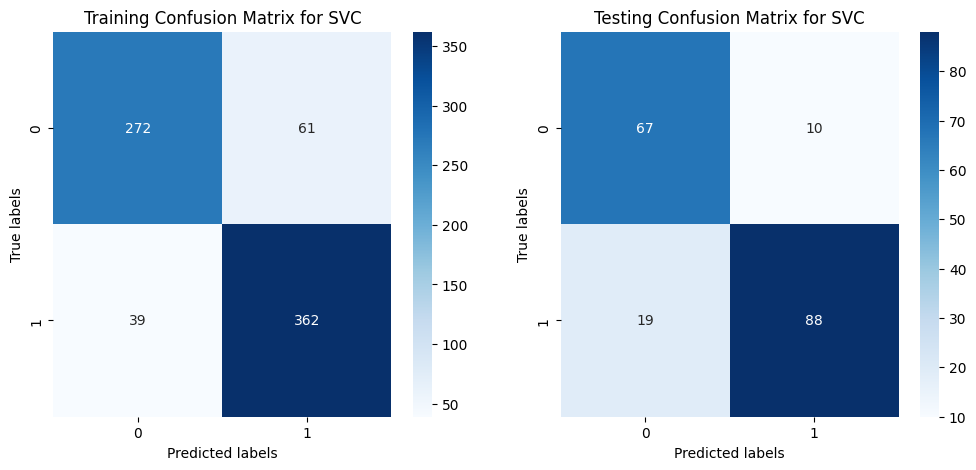

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.87      0.82      0.84       333
           1       0.86      0.90      0.88       401

    accuracy                           0.86       734
   macro avg       0.87      0.86      0.86       734
weighted avg       0.86      0.86      0.86       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.78      0.87      0.82        77
           1       0.90      0.82      0.86       107

    accuracy                           0.84       184
   macro avg       0.84      0.85      0.84       184
weighted avg       0.85      0.84      0.84       184

Training ROC AUC Score: 0.9223937154111719
Testing ROC AUC Score: 0.9248695230003642


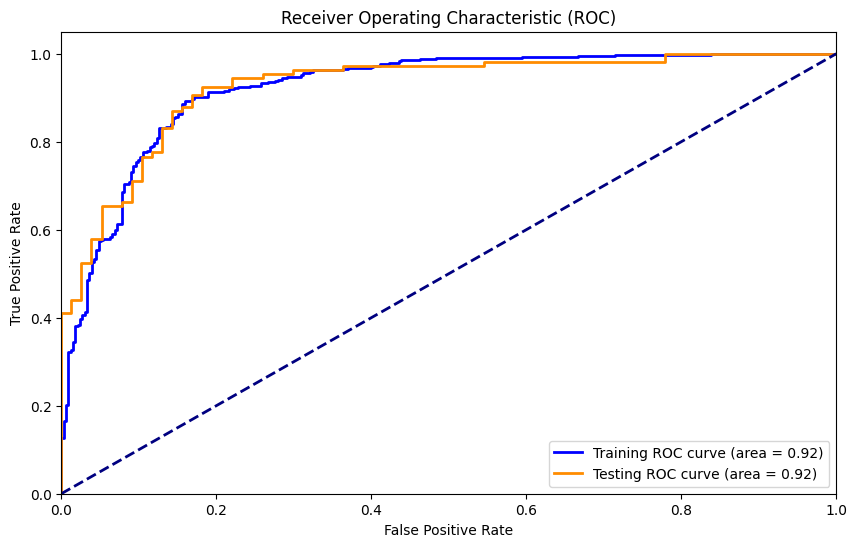

In [561]:
# Trying to tune the hyperparameters of the support vector machine model
svm_grid_without_pca = SVC(random_state=42, probability=True)
param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [2, 3, 4],
    'gamma': ['scale', 'auto'],
    'coef0': [0.0, 0.1, 0.5]
}
kwargs = {**grid_search_kwargs}
kwargs['model'] = svm_grid_without_pca
kwargs['model_name'] = 'SVC (Grid Search)'
kwargs["param_grid"] = param_grid_svm
svm_grid_output, svm_grid_without_pca = grid_search_and_evaluate(**kwargs)

In [562]:
# View the results of the support vector machine model with grid search
svm_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,SVC (Grid Search),0.922394,0.86376,0.855792,0.902743,0.878641,0.92487,0.842391,0.897959,0.82243,0.858537


#### 2. With PCA

##### PCA Only

Evaluating SVC


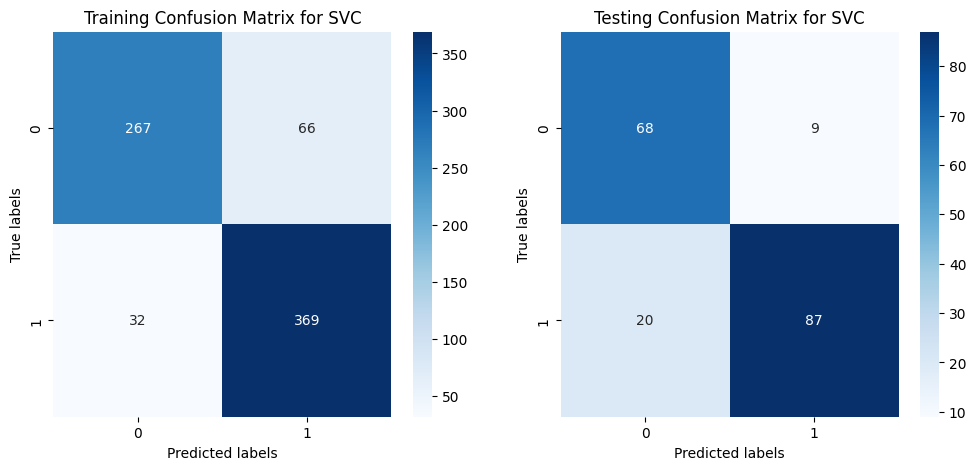

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.89      0.80      0.84       333
           1       0.85      0.92      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.86      0.86       734
weighted avg       0.87      0.87      0.87       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.88      0.82        77
           1       0.91      0.81      0.86       107

    accuracy                           0.84       184
   macro avg       0.84      0.85      0.84       184
weighted avg       0.85      0.84      0.84       184

Training ROC AUC Score: 0.893232384504205
Testing ROC AUC Score: 0.9144313630294939


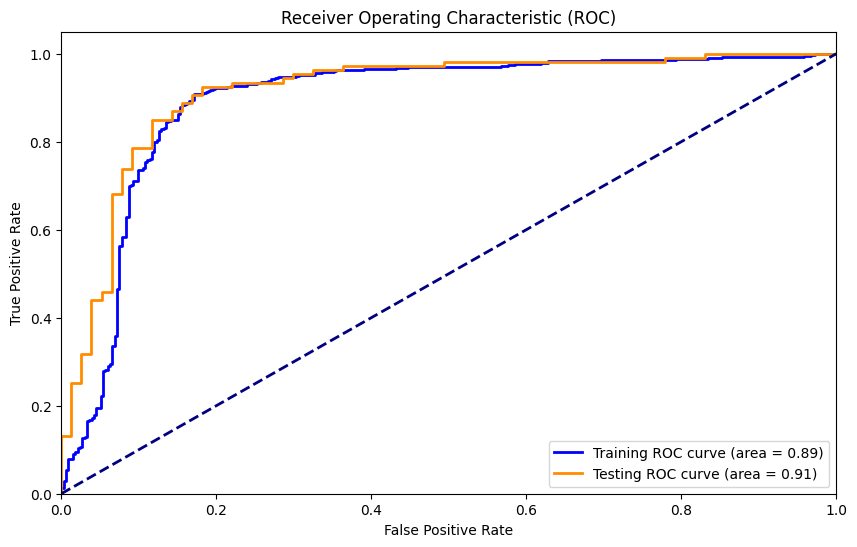

In [563]:
# Train and evaluate the support vector machine model with PCA
svm_with_pca = SVC(random_state=42, probability=True)
kwargs = {**pca_kwargs}
kwargs['model'] = svm_with_pca
kwargs['model_name'] = 'SVC (PCA)'
svm_pca_output = train_and_evaluate(**kwargs)

In [564]:
# View the results of the support vector machine model with PCA
svm_pca_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,SVC (PCA),0.893232,0.866485,0.848276,0.9202,0.882775,0.914431,0.842391,0.90625,0.813084,0.857143


##### PCA + Grid Search

Best parameters found: {'C': 0.1, 'coef0': 0.0, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}
Best cross-validation score: 0.8823582466907516
Evaluating SVC


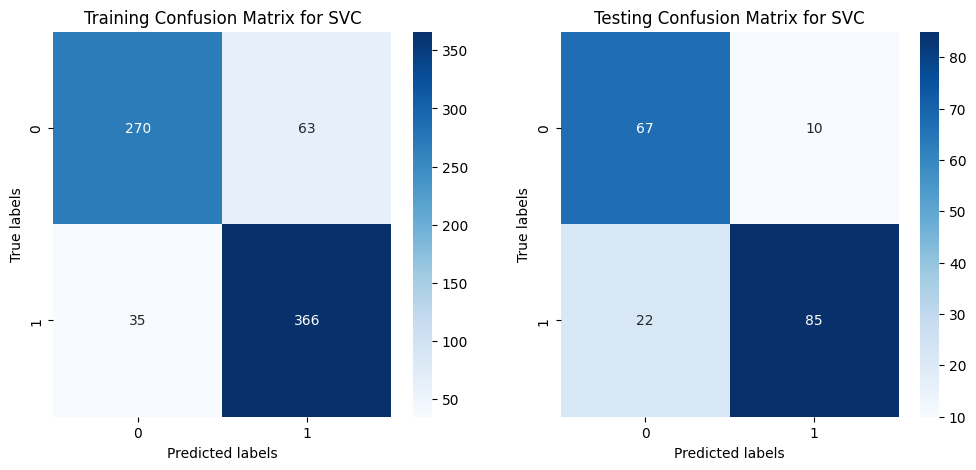

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.89      0.81      0.85       333
           1       0.85      0.91      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.86      0.86       734
weighted avg       0.87      0.87      0.87       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.75      0.87      0.81        77
           1       0.89      0.79      0.84       107

    accuracy                           0.83       184
   macro avg       0.82      0.83      0.82       184
weighted avg       0.84      0.83      0.83       184

Training ROC AUC Score: 0.8980551623943145
Testing ROC AUC Score: 0.9084840393251609


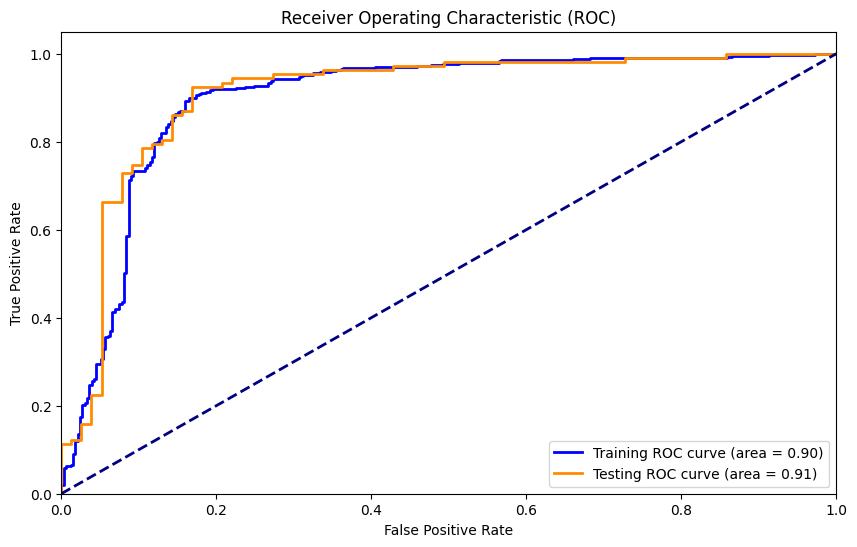

In [565]:
# Train and evaluate PCA and support vector machine model with grid search
svm_grid_with_pca = SVC(random_state=42, probability=True)
kwargs = {**pca_grid_search_kwargs}
kwargs['model'] = svm_grid_with_pca
kwargs["model_name"] = 'SVC (PCA, Grid Search)'
kwargs["param_grid"] = param_grid_svm
svm_pca_grid_output, svm_grid_with_pca = grid_search_and_evaluate(**kwargs)

In [566]:
# View the results of the support vector machine model with PCA and grid search 
svm_pca_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"SVC (PCA, Grid Search)",0.898055,0.866485,0.853147,0.912718,0.881928,0.908484,0.826087,0.894737,0.794393,0.841584


#### Visualizing Decision Boundary

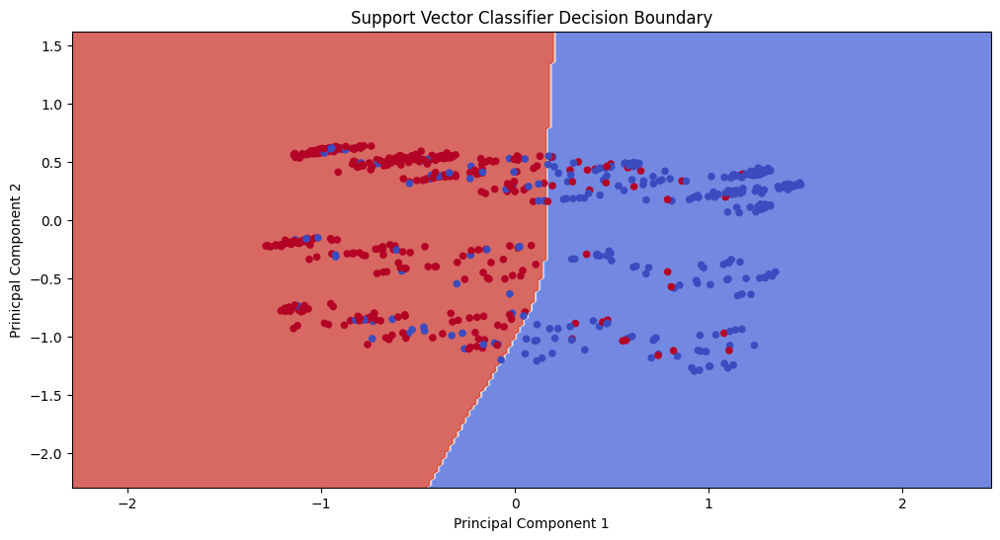

In [567]:
# Visualizing the decision boundary of the SVC model
draw_decision_boundary(svm_grid_with_pca, X_train_pca, y_train, "Support Vector Classifier Decision Boundary")

#### Forward Selection

We will use the vanilla svc model for the forward selection as it yielded the best results in the previous experiments.

Selected Features (Indices): [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14]
Selected Features (Names): ['age', 'sex', 'restingbp', 'cholesterol', 'fastingbs', 'maxhr', 'exerciseangina', 'oldpeak', 'chestpaintype_ASY', 'chestpaintype_NAP', 'restingecg_LVH', 'restingecg_Normal', 'st_slope_Flat', 'st_slope_Up']
Evaluating SVC


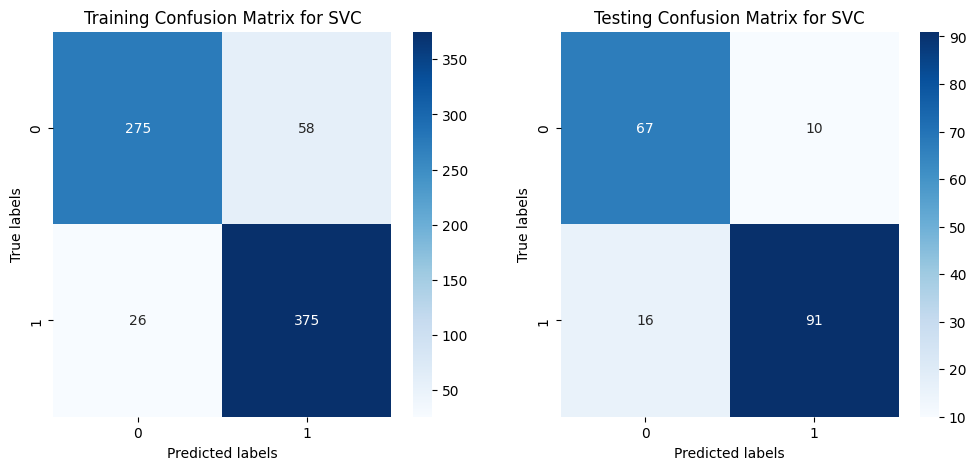

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.91      0.83      0.87       333
           1       0.87      0.94      0.90       401

    accuracy                           0.89       734
   macro avg       0.89      0.88      0.88       734
weighted avg       0.89      0.89      0.88       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.87      0.84        77
           1       0.90      0.85      0.88       107

    accuracy                           0.86       184
   macro avg       0.85      0.86      0.86       184
weighted avg       0.86      0.86      0.86       184

Training ROC AUC Score: 0.9527008305063167
Testing ROC AUC Score: 0.9209855564995751


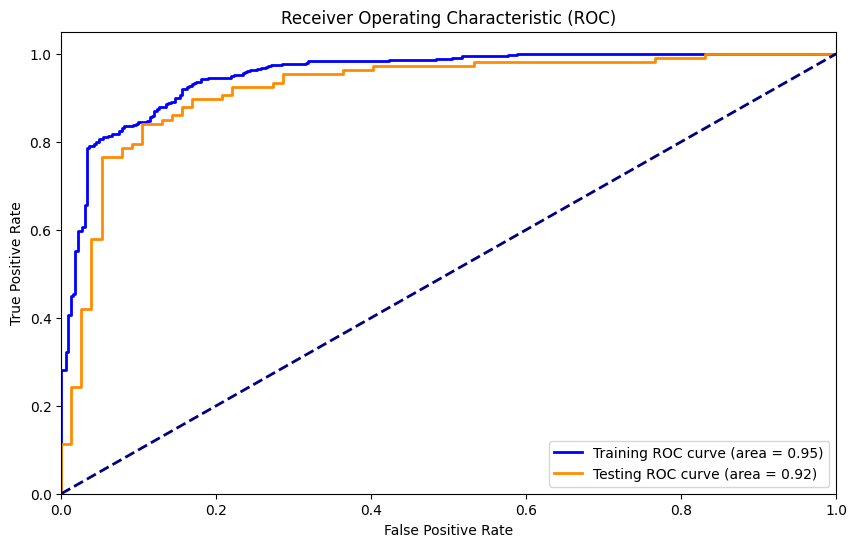

In [568]:
# Train and evaluate the SVC model
svc_sfs = clone(svm_without_pca)
kwargs = {**sfs_kwargs}
kwargs['model'] = svc_sfs
kwargs['model_name'] = 'SVC (Vanilla, Forward Selection)'
svm_vanilla_forward_selection_output = train_sfs_and_evaluate(**kwargs)

In [569]:
svm_vanilla_forward_selection_output['evaluation_results']

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"SVC (Vanilla, Forward Selection)",0.952701,0.885559,0.866051,0.935162,0.899281,0.920986,0.858696,0.90099,0.850467,0.875


In [570]:
all_svm_outputs = pd.concat([
    svm_output,
    svm_grid_output,
    svm_pca_output,
    svm_pca_grid_output,
    svm_vanilla_forward_selection_output['evaluation_results']
])
all_svm_outputs

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,SVC,0.953472,0.882834,0.862069,0.935162,0.897129,0.922563,0.853261,0.892157,0.850467,0.870813
0,SVC (Grid Search),0.922394,0.863760,0.855792,0.902743,0.878641,0.924870,0.842391,0.897959,0.822430,0.858537
0,SVC (PCA),0.893232,0.866485,0.848276,0.920200,0.882775,0.914431,0.842391,0.906250,0.813084,0.857143
0,"SVC (PCA, Grid Search)",0.898055,0.866485,0.853147,0.912718,0.881928,0.908484,0.826087,0.894737,0.794393,0.841584
0,"SVC (Vanilla, Forward Selection)",0.952701,0.885559,0.866051,0.935162,0.899281,0.920986,0.858696,0.900990,0.850467,0.875000


**SVC**
- **Train Metrics**: Strong performance with ROC AUC (0.953) and recall (0.935), indicating good fit.
- **Test Metrics**: Balanced metrics, with recall (0.850) and F1 (0.871) consistent with precision.
- **Overall**: A reliable model with a good balance between recall and other metrics but still there is a bit of overfitting because of the big difference between train and test recall metric.

**SVC (Grid Search)**
- **Train Metrics**: Slightly reduced performance (ROC AUC: 0.922, recall: 0.903) compared to base SVC.
- **Test Metrics**: Recall (0.822) drops slightly, with F1 (0.859) remaining competitive.
- **Overall**: Marginally worse than base SVC for recall-prioritized tasks.

**SVC (PCA)**
- **Train Metrics**: ROC AUC (0.893) and recall (0.920) indicate good fit after dimensionality reduction.
- **Test Metrics**: Recall (0.813) is lower, but precision (0.906) leads to a strong F1 score (0.857).
- **Overall**: Decent performance but suboptimal for recall-focused tasks.

**SVC (PCA, Grid Search)**
- **Train Metrics**: ROC AUC (0.898) and recall (0.913) indicate good fit after dimensionality reduction.
- **Test Metrics**: Recall (0.794) is the lowest among SVC models, with balanced precision (0.895).
- **Overall**: PCA combined with grid search struggles to prioritize recall effectively.

**SVC (Vanilla, Forward Selection)**
- **Train Metrics**: Strong performance with ROC AUC (0.953) and recall (0.935), matching the base SVC.
- **Test Metrics**: Recall (0.850) and F1 (0.875) mirror the base SVC, showing consistency.
- **Overall**: Performs similarly to the base SVC, making it a reliable choice.


**Best Model for Recall**: **SVC** and **SVC (Vanilla, Forward Selection)** both achieve the highest test recall (0.850) with balanced metrics.


### XGBoost

#### 1. Without PCA

##### Vanilla Model

Evaluating XGBClassifier


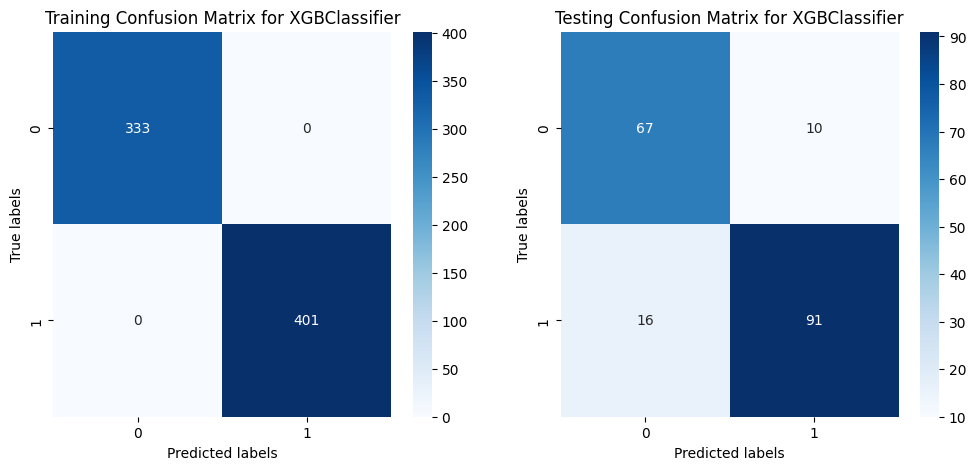

Training Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       333
           1       1.00      1.00      1.00       401

    accuracy                           1.00       734
   macro avg       1.00      1.00      1.00       734
weighted avg       1.00      1.00      1.00       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.81      0.87      0.84        77
           1       0.90      0.85      0.88       107

    accuracy                           0.86       184
   macro avg       0.85      0.86      0.86       184
weighted avg       0.86      0.86      0.86       184

Training ROC AUC Score: 1.0
Testing ROC AUC Score: 0.9305740987983978


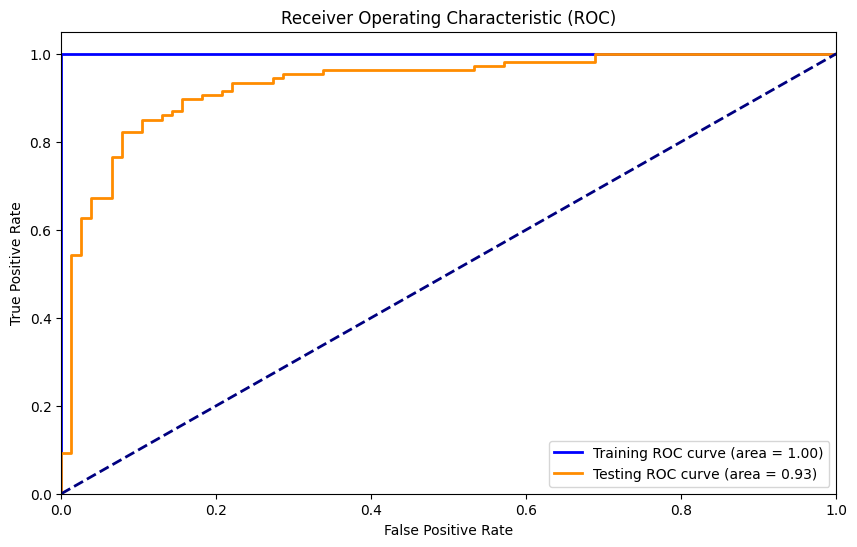

In [571]:
# Train and evaluate the xgboost model
xgboost_without_pca = XGBClassifier(random_state=42)
kwargs = {**normal_kwargs}
kwargs['model'] = xgboost_without_pca
kwargs['model_name'] = 'XGBoost'
xgboost_output = train_and_evaluate(**kwargs)

In [572]:
# View the results of the xgboost model
xgboost_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,XGBoost,1.0,1.0,1.0,1.0,1.0,0.930574,0.858696,0.90099,0.850467,0.875


##### Grid Search

Best parameters found: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.8}
Best cross-validation score: 0.8780647664148381
Evaluating XGBClassifier


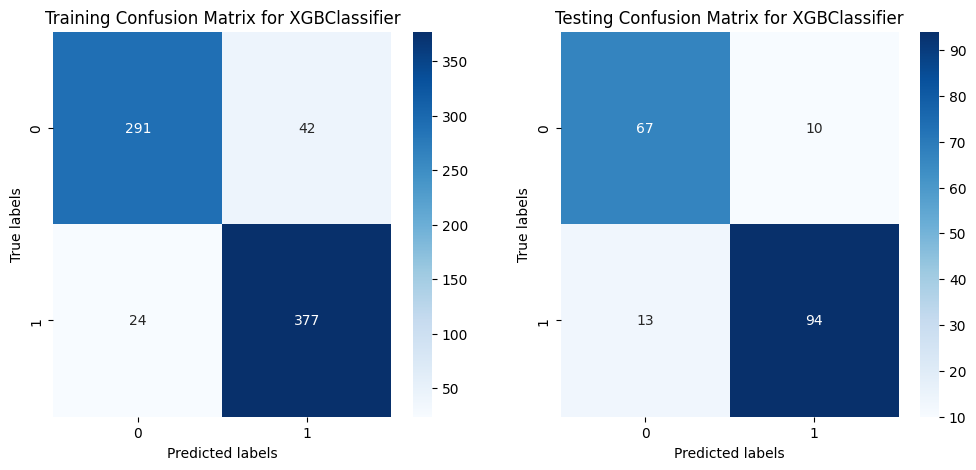

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.87      0.90       333
           1       0.90      0.94      0.92       401

    accuracy                           0.91       734
   macro avg       0.91      0.91      0.91       734
weighted avg       0.91      0.91      0.91       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.84      0.87      0.85        77
           1       0.90      0.88      0.89       107

    accuracy                           0.88       184
   macro avg       0.87      0.87      0.87       184
weighted avg       0.88      0.88      0.88       184

Training ROC AUC Score: 0.9685321231455895
Testing ROC AUC Score: 0.9383420317999758


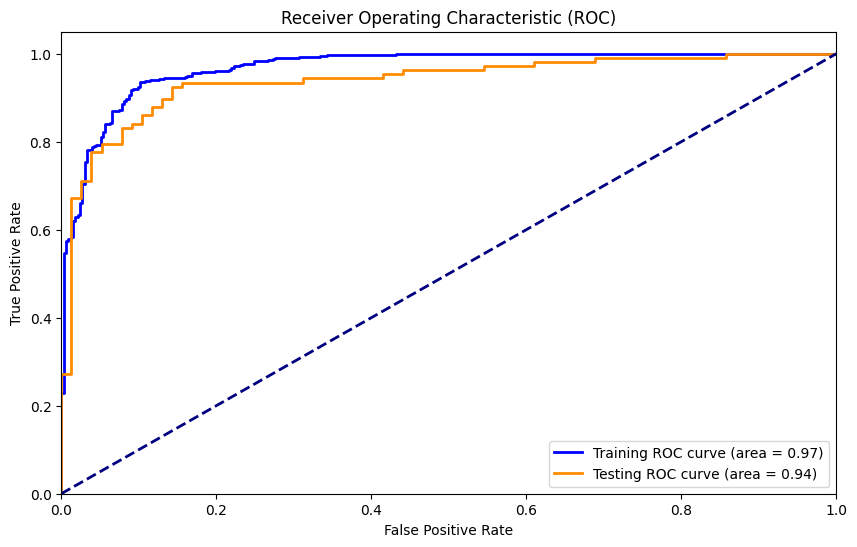

In [573]:
# Trying to tune the hyperparameters of the xgboost model
xgboost_grid_without_pca = XGBClassifier(random_state=42)
param_grid_xgb = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}
kwargs = {**grid_search_kwargs}
kwargs['model'] = xgboost_grid_without_pca
kwargs['model_name'] = 'XGBoost (Grid Search)'
kwargs["param_grid"] = param_grid_xgb
xgboost_grid_output, xgboost_grid_without_pca = grid_search_and_evaluate(**kwargs)

In [574]:
# View the results of the xgboostt model with grid search
xgboost_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,XGBoost (Grid Search),0.968532,0.910082,0.899761,0.94015,0.919512,0.938342,0.875,0.903846,0.878505,0.890995


#### 2. With PCA

##### PCA Only

Evaluating XGBClassifier


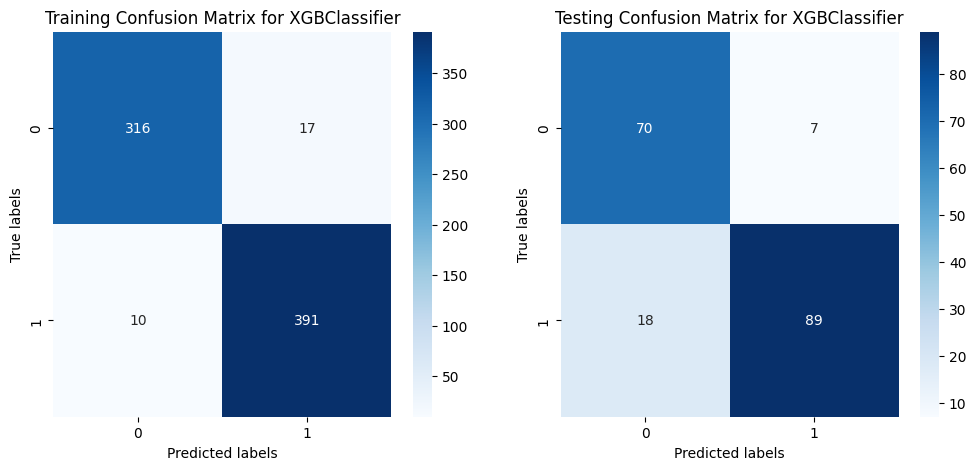

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       333
           1       0.96      0.98      0.97       401

    accuracy                           0.96       734
   macro avg       0.96      0.96      0.96       734
weighted avg       0.96      0.96      0.96       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.80      0.91      0.85        77
           1       0.93      0.83      0.88       107

    accuracy                           0.86       184
   macro avg       0.86      0.87      0.86       184
weighted avg       0.87      0.86      0.86       184

Training ROC AUC Score: 0.9964578044378543
Testing ROC AUC Score: 0.917890520694259


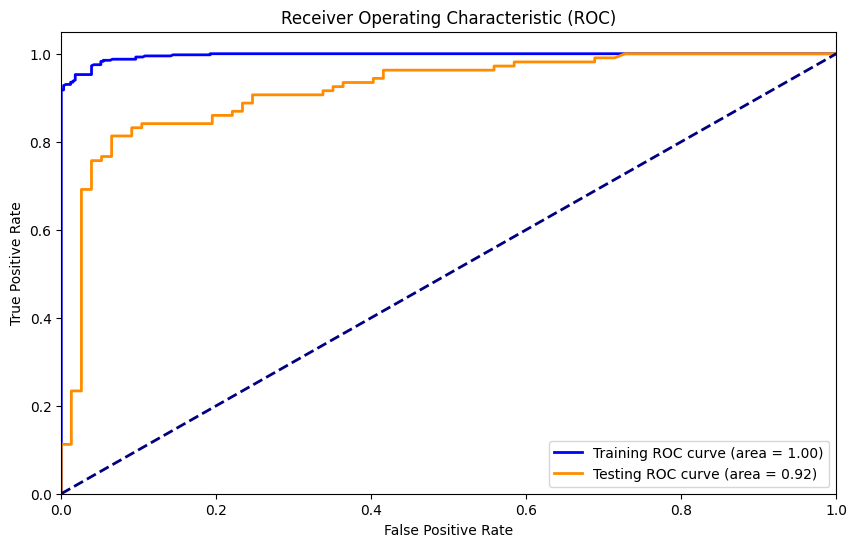

In [575]:
# Train and evaluate the xgboost model with PCA
xgboost_with_pca = XGBClassifier(random_state=42)
kwargs = {**pca_kwargs}
kwargs['model'] = xgboost_with_pca
kwargs['model_name'] = 'XGBoost (PCA)'
xgboost_pca_output = train_and_evaluate(**kwargs)

In [576]:
# View the results of the xgboost model with PCA
xgboost_pca_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,XGBoost (PCA),0.996458,0.963215,0.958333,0.975062,0.966625,0.917891,0.86413,0.927083,0.831776,0.876847


##### PCA + Grid Search

Best parameters found: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}
Best cross-validation score: 0.8745378350062545
Evaluating XGBClassifier


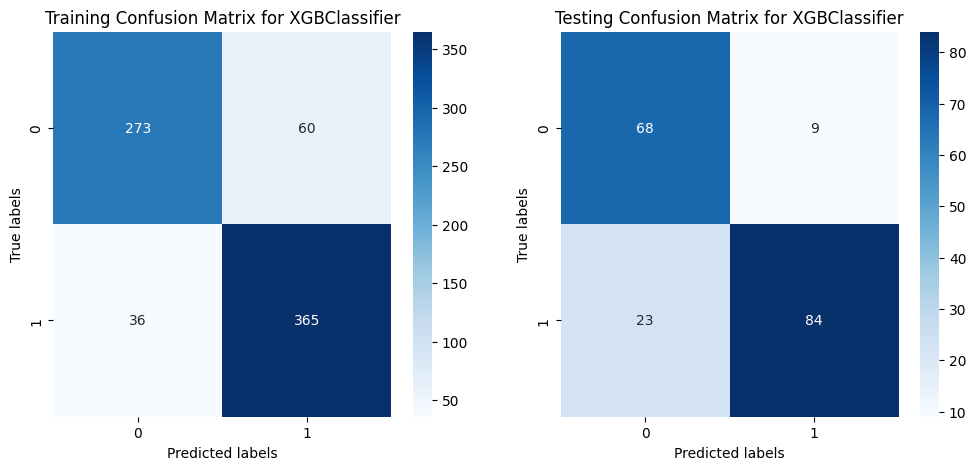

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.88      0.82      0.85       333
           1       0.86      0.91      0.88       401

    accuracy                           0.87       734
   macro avg       0.87      0.87      0.87       734
weighted avg       0.87      0.87      0.87       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.75      0.88      0.81        77
           1       0.90      0.79      0.84       107

    accuracy                           0.83       184
   macro avg       0.83      0.83      0.82       184
weighted avg       0.84      0.83      0.83       184

Training ROC AUC Score: 0.9333835081964759
Testing ROC AUC Score: 0.9206214346401261


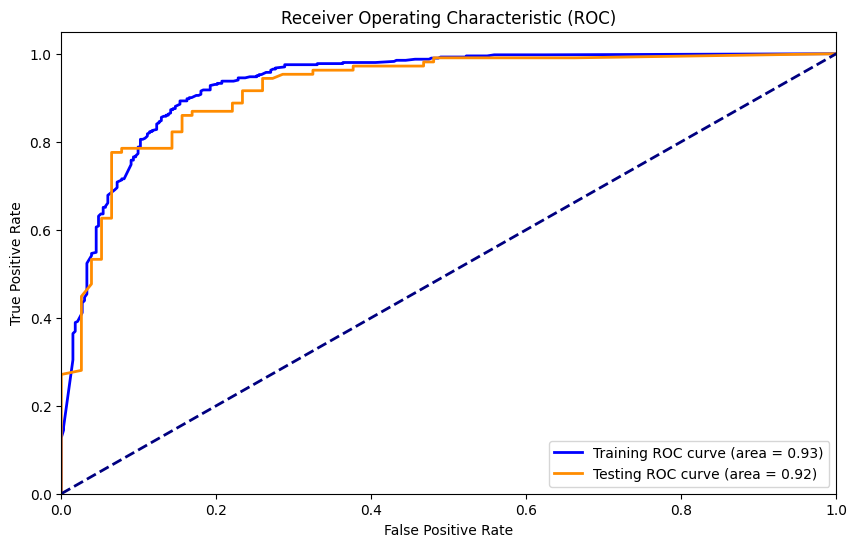

In [577]:
# Train and evaluate PCA and xgboost model with grid search
xgboost_grid_with_pca = XGBClassifier(random_state=42)
kwargs = {**pca_grid_search_kwargs}
kwargs['model'] = xgboost_grid_with_pca
kwargs["model_name"] = 'XGBoost (PCA, Grid Search)'
kwargs["param_grid"] = param_grid_xgb
xgboost_pca_grid_output, xgboost_grid_with_pca = grid_search_and_evaluate(**kwargs)

In [578]:
# View the results of the xgboost model with PCA and grid search 
xgboost_pca_grid_output

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"XGBoost (PCA, Grid Search)",0.933384,0.86921,0.858824,0.910224,0.883777,0.920621,0.826087,0.903226,0.785047,0.84


#### Visualizing Decision Boundary

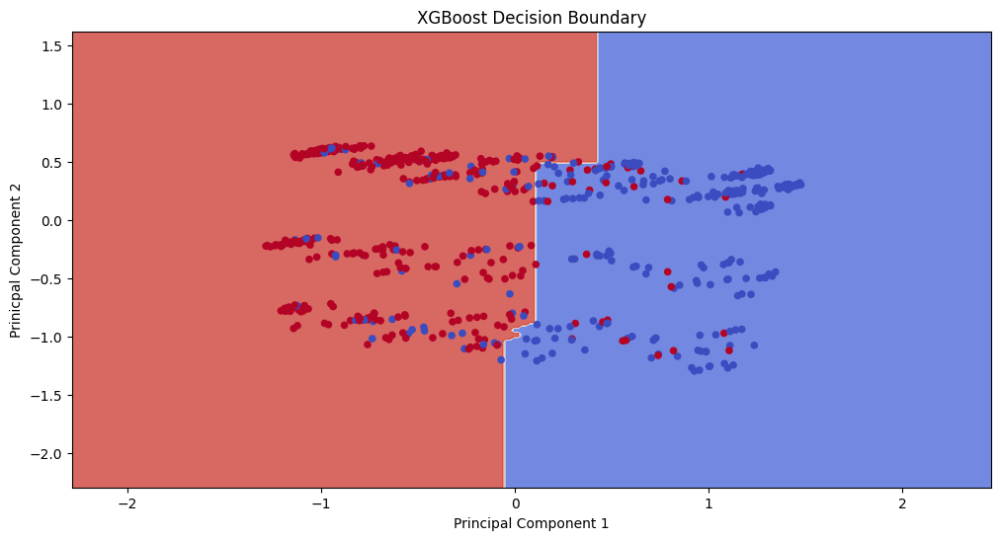

In [579]:
# Visualizing the decision boundary of the decision tree model
draw_decision_boundary(xgboost_grid_with_pca, X_train_pca, y_train, "XGBoost Decision Boundary")

#### Forward Selection

We will use the XGBoost model obtained using grid search for the forward selection as it yielded the best results in the previous experiments.

Selected Features (Indices): [0, 1, 2, 4, 6, 7, 11, 12, 13, 14]
Selected Features (Names): ['age', 'sex', 'restingbp', 'fastingbs', 'exerciseangina', 'oldpeak', 'restingecg_LVH', 'restingecg_Normal', 'st_slope_Flat', 'st_slope_Up']
Evaluating XGBClassifier


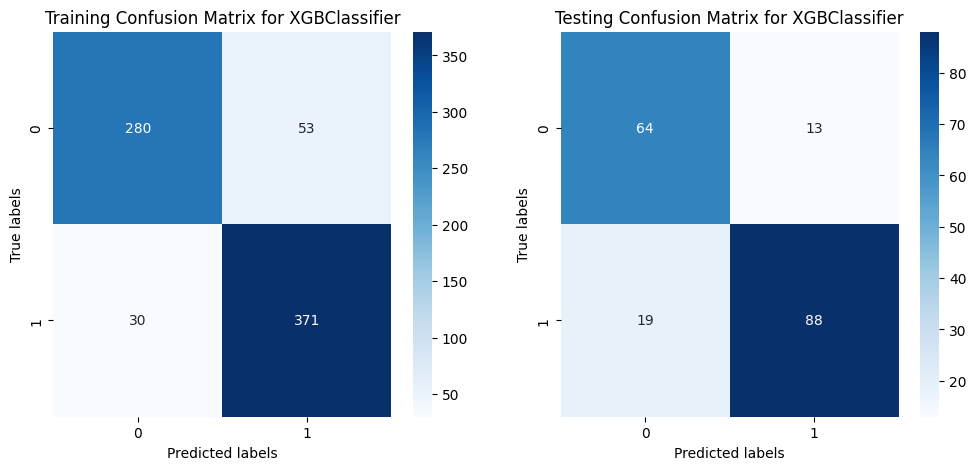

Training Classification Report: 
              precision    recall  f1-score   support

           0       0.90      0.84      0.87       333
           1       0.88      0.93      0.90       401

    accuracy                           0.89       734
   macro avg       0.89      0.88      0.89       734
weighted avg       0.89      0.89      0.89       734

Testing Classification Report: 
              precision    recall  f1-score   support

           0       0.77      0.83      0.80        77
           1       0.87      0.82      0.85       107

    accuracy                           0.83       184
   macro avg       0.82      0.83      0.82       184
weighted avg       0.83      0.83      0.83       184

Training ROC AUC Score: 0.95642275692151
Testing ROC AUC Score: 0.8981672533074403


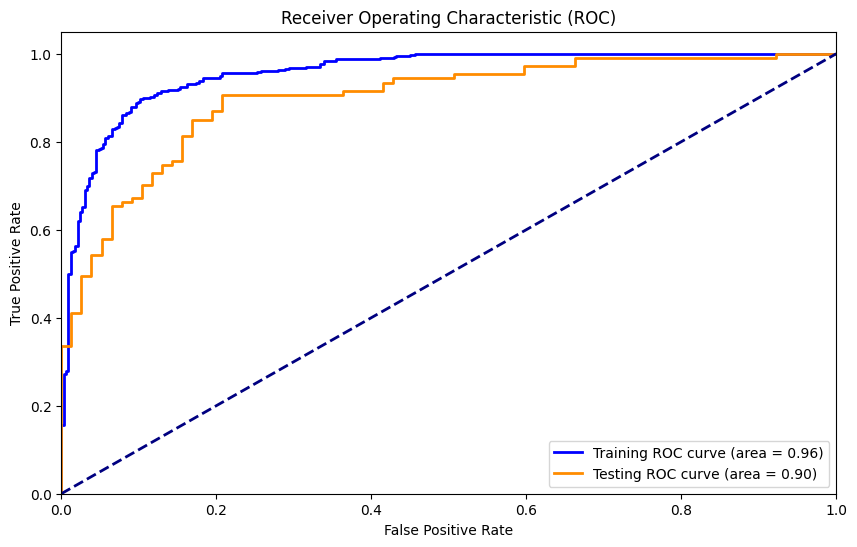

In [580]:
# Train and evaluate the random forest model
xgboost_sfs = clone(xgboost_grid_without_pca)
kwargs = {**sfs_kwargs}
kwargs['model'] = xgboost_sfs
kwargs['model_name'] = 'XGBoost (Grid Search, Forward Selection)'
xgboost_grid_forward_selection_output = train_sfs_and_evaluate(**kwargs)

In [581]:
xgboost_grid_forward_selection_output['evaluation_results']

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,"XGBoost (Grid Search, Forward Selection)",0.956423,0.886921,0.875,0.925187,0.899394,0.898167,0.826087,0.871287,0.82243,0.846154


In [582]:
all_xgboost_outputs = pd.concat([
    xgboost_output,
    xgboost_grid_output,
    xgboost_pca_output,
    xgboost_pca_grid_output,
    xgboost_grid_forward_selection_output['evaluation_results']
])
all_xgboost_outputs

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000,0.930574,0.858696,0.900990,0.850467,0.875000
0,XGBoost (Grid Search),0.968532,0.910082,0.899761,0.940150,0.919512,0.938342,0.875000,0.903846,0.878505,0.890995
0,XGBoost (PCA),0.996458,0.963215,0.958333,0.975062,0.966625,0.917891,0.864130,0.927083,0.831776,0.876847
0,"XGBoost (PCA, Grid Search)",0.933384,0.869210,0.858824,0.910224,0.883777,0.920621,0.826087,0.903226,0.785047,0.840000
0,"XGBoost (Grid Search, Forward Selection)",0.956423,0.886921,0.875000,0.925187,0.899394,0.898167,0.826087,0.871287,0.822430,0.846154


**XGBoost**
- **Train Metrics**: Perfect scores (ROC AUC, accuracy, precision, recall, F1 = 1.0), indicating severe overfitting.
- **Test Metrics**: Balanced metrics, with recall (0.850) and F1 (0.875), but generalization is limited due to overfitting.
- **Overall**: Strong baseline, but overfitting reduces reliability.

**XGBoost (Grid Search)**
- **Train Metrics**: Improved balance, with ROC AUC (0.969) and recall (0.940).
- **Test Metrics**: High recall (0.879), F1 (0.891), and ROC AUC (0.938) show strong generalization and consistency.
- **Overall**: A well-balanced model, particularly effective for recall-focused tasks.

**XGBoost (PCA)**
- **Train Metrics**: Strong performance, with ROC AUC (0.996) and recall (0.975), indicating overfitting.
- **Test Metrics**: Recall (0.832) drops slightly, but precision (0.927) leads to a competitive F1 (0.877).
- **Overall**: Good performance, but recall is slightly weaker compared to Grid Search.

**XGBoost (PCA, Grid Search)**
- **Train Metrics**: Balanced metrics, with ROC AUC (0.933) and recall (0.910).
- **Test Metrics**: Recall (0.785) is lower, despite decent precision (0.903) and F1 (0.840).
- **Overall**: PCA combined with Grid Search struggles to prioritize recall effectively.

**XGBoost (Grid Search, Forward Selection)**
- **Train Metrics**: Strong performance, with ROC AUC (0.956) and recall (0.925).
- **Test Metrics**: Balanced metrics, but recall (0.822) is lower compared to the Grid Search-only model.
- **Overall**: Reliable model, but less effective for maximizing recall.

**Key Takeaways**
- **Best Model for Recall**: **XGBoost (Grid Search)** achieves the highest test recall (0.879) and strong generalization across all metrics.


### Concat All Results

In [583]:
all_results = pd.concat([
    lr_output,
    lr_grid_output,
    lr_pca_output,
    lr_pca_grid_output,
    lr_vanilla_forward_selection_output['evaluation_results'],
    dt_output,
    dt_grid_output,
    dt_pca_output,
    dt_pca_grid_output,
    dt_grid_forward_selection_output['evaluation_results'],
    rf_output,
    rf_grid_output,
    rf_pca_output,
    rf_pca_grid_output,
    rf_grid_forward_selection_output['evaluation_results'],
    svm_output,
    svm_grid_output,
    svm_pca_output,
    svm_pca_grid_output,
    svm_vanilla_forward_selection_output['evaluation_results'],
    xgboost_output,
    xgboost_grid_output,
    xgboost_pca_output,
    xgboost_pca_grid_output,
    xgboost_grid_forward_selection_output['evaluation_results']
], axis=0)

In [584]:
all_results

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Logistic Regression,0.928115,0.861035,0.860241,0.890274,0.875000,0.930210,0.864130,0.910000,0.850467,0.879227
0,Logistic Regression (Grid Search),0.924348,0.869210,0.857143,0.912718,0.884058,0.922685,0.858696,0.900990,0.850467,0.875000
0,Logistic Regression (PCA),0.918866,0.865123,0.861244,0.897756,0.879121,0.916495,0.831522,0.904255,0.794393,0.845771
0,"Logistic Regression (PCA, Grid Search)",0.918222,0.866485,0.859857,0.902743,0.880779,0.918315,0.815217,0.884211,0.785047,0.831683
0,"Logistic Regression (Vanilla, Forward Selection)",0.919791,0.862398,0.857143,0.897756,0.876979,0.920986,0.831522,0.895833,0.803738,0.847291
0,Decision Tree,1.000000,1.000000,1.000000,1.000000,1.000000,0.799551,0.788043,0.886364,0.728972,0.800000
0,Decision Tree (Grid Search),0.898841,0.846049,0.851220,0.870324,0.860666,0.864243,0.836957,0.888889,0.822430,0.854369
0,Decision Tree (PCA),1.000000,1.000000,1.000000,1.000000,1.000000,0.860056,0.847826,0.943820,0.785047,0.857143
0,"Decision Tree (PCA, Grid Search)",0.913332,0.869210,0.882206,0.877805,0.880000,0.907816,0.842391,0.943182,0.775701,0.851282
0,"Decision Tree (Grid Search, Forward Selection)",0.901114,0.856948,0.841014,0.910224,0.874251,0.901262,0.831522,0.887755,0.813084,0.848780


## 6. Final Results

In [585]:
all_results.sort_values(by=['Recall Test', 'F1 Test'], ascending=False)

,Model Name,ROC AUC Train,Accuracy Train,Precision Train,Recall Train,F1 Train,ROC AUC Test,Accuracy Test,Precision Test,Recall Test,F1 Test
0,Random Forest (Grid Search),0.998023,0.974114,0.963592,0.990025,0.976630,0.928147,0.869565,0.887850,0.887850,0.887850
0,XGBoost (Grid Search),0.968532,0.910082,0.899761,0.940150,0.919512,0.938342,0.875000,0.903846,0.878505,0.890995
0,Logistic Regression,0.928115,0.861035,0.860241,0.890274,0.875000,0.930210,0.864130,0.910000,0.850467,0.879227
0,Logistic Regression (Grid Search),0.924348,0.869210,0.857143,0.912718,0.884058,0.922685,0.858696,0.900990,0.850467,0.875000
0,Random Forest,1.000000,1.000000,1.000000,1.000000,1.000000,0.930756,0.858696,0.900990,0.850467,0.875000
0,"SVC (Vanilla, Forward Selection)",0.952701,0.885559,0.866051,0.935162,0.899281,0.920986,0.858696,0.900990,0.850467,0.875000
0,XGBoost,1.000000,1.000000,1.000000,1.000000,1.000000,0.930574,0.858696,0.900990,0.850467,0.875000
0,"Random Forest (Grid Search, Forward Selection)",0.996226,0.960490,0.951456,0.977556,0.964330,0.922017,0.853261,0.892157,0.850467,0.870813
0,SVC,0.953472,0.882834,0.862069,0.935162,0.897129,0.922563,0.853261,0.892157,0.850467,0.870813
0,XGBoost (PCA),0.996458,0.963215,0.958333,0.975062,0.966625,0.917891,0.864130,0.927083,0.831776,0.876847


The best model in terms of `recall test` is `Random Forest (Grid Search)`, however it overfits drastically on the training data so we will choose the `XGBoost (Grid Search)` model as the best model for this problem due the following reasons:
- Test ROC AUC: 0.938 — highest among all models, indicating excellent discriminatory power.
- Test Recall: 0.879 — ensures a high rate of identifying positive cases, which is critical for minimizing false negatives in a medical context.
- Test F1 Score: 0.891 — highest f1 score among all models indicating a strong balance between precision and recall.
- The test performance is similar to training performance , indicating that the model is not overfitting and is capable of generalizing well

##### Forward selection findings :

After performing forward selection, the following features were found to appear most frequently in the best-performing models:

| **Feature**               | **Count** |
|----------------------------|-----------|
| `sex`                     | 5         |
| `exerciseangina`          | 5         |
| `st_slope_Up`             | 5         |
| `age`                     | 4         |
| `restingbp`               | 4         |
| `chestpaintype_ASY`       | 4         |
| `restingecg_Normal`       | 4         |
| `fastingbs`               | 3         |
| `oldpeak`                 | 3         |
| `restingecg_LVH`          | 3         |
| `st_slope_Flat`           | 3         |
| `chestpaintype_ATA`       | 2         |
| `cholesterol`             | 1         |
| `maxhr`                   | 1         |
| `chestpaintype_NAP`       | 1         |

### Implication

The frequent appearance of these features suggests that they have a significant impact on the model's ability to make accurate predictions. Prioritizing these features could enhance the model's predictive performance.

In [586]:
all_results.to_csv('all_results.csv', index=False)